<a href="https://colab.research.google.com/github/ShivaNeZ/Comparison-of-ML-DL-and-HybridEnsemble-models-for-Cybersecurity/blob/main/Comparison_of_Models_for_Cybersecurity.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Uploading the data

In [ ]:


import kagglehub
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
# Download latest version
path = kagglehub.dataset_download("mrwellsdavid/unsw-nb15")

print("Path to dataset files:", path)

Path to dataset files: /root/.cache/kagglehub/datasets/mrwellsdavid/unsw-nb15/versions/1


In [ ]:
import os

# List files in the downloaded dataset directory
files = os.listdir(path)
print("Files in the dataset:", files)


Files in the dataset: ['UNSW-NB15_1.csv', 'UNSW-NB15_4.csv', 'UNSW_NB15_training-set.csv', 'NUSW-NB15_features.csv', 'UNSW_NB15_testing-set.csv', 'UNSW-NB15_LIST_EVENTS.csv', 'UNSW-NB15_3.csv', 'UNSW-NB15_2.csv']


Overveiw of the data

In [ ]:
# Define paths to the training and testing files
test = os.path.join(path, "UNSW_NB15_training-set.csv")
train = os.path.join(path, "UNSW_NB15_testing-set.csv")

# Load datasets
train = pd.read_csv(train)
test = pd.read_csv(test)

# Display shapes of the datasets
print("Shape of Training Dataset:", train.shape)
print("Shape of Testing Dataset:", test.shape)


Shape of Training Dataset: (175341, 45)
Shape of Testing Dataset: (82332, 45)


Preprocessing

In [ ]:
# Check for missing values
print("Missing values in training set:")
print(train.isnull().sum())

print("\nMissing values in test set:")
print(test.isnull().sum())

Missing values in training set:
id                   0
dur                  0
proto                0
service              0
state                0
spkts                0
dpkts                0
sbytes               0
dbytes               0
rate                 0
sttl                 0
dttl                 0
sload                0
dload                0
sloss                0
dloss                0
sinpkt               0
dinpkt               0
sjit                 0
djit                 0
swin                 0
stcpb                0
dtcpb                0
dwin                 0
tcprtt               0
synack               0
ackdat               0
smean                0
dmean                0
trans_depth          0
response_body_len    0
ct_srv_src           0
ct_state_ttl         0
ct_dst_ltm           0
ct_src_dport_ltm     0
ct_dst_sport_ltm     0
ct_dst_src_ltm       0
is_ftp_login         0
ct_ftp_cmd           0
ct_flw_http_mthd     0
ct_src_ltm           0
ct_srv_dst           0
is

In [ ]:
# Check for duplicated rows
print("\nDuplicated rows in training set:")
print(train.duplicated().sum())

print("\nDuplicated rows in test set:")
print(test.duplicated().sum())



Duplicated rows in training set:
0

Duplicated rows in test set:
0


In [ ]:
# Display information about train and test Dataset
print(train.info())
print(test.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 175341 entries, 0 to 175340
Data columns (total 45 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   id                 175341 non-null  int64  
 1   dur                175341 non-null  float64
 2   proto              175341 non-null  object 
 3   service            175341 non-null  object 
 4   state              175341 non-null  object 
 5   spkts              175341 non-null  int64  
 6   dpkts              175341 non-null  int64  
 7   sbytes             175341 non-null  int64  
 8   dbytes             175341 non-null  int64  
 9   rate               175341 non-null  float64
 10  sttl               175341 non-null  int64  
 11  dttl               175341 non-null  int64  
 12  sload              175341 non-null  float64
 13  dload              175341 non-null  float64
 14  sloss              175341 non-null  int64  
 15  dloss              175341 non-null  int64  
 16  si

In [ ]:
# Display type of the features in train and test Dataset
print("Data types of features in the training set:")
print(train.dtypes)

print("Data types of features in the test set:")
print(test.dtypes)

Data types of features in the training set:
id                     int64
dur                  float64
proto                 object
service               object
state                 object
spkts                  int64
dpkts                  int64
sbytes                 int64
dbytes                 int64
rate                 float64
sttl                   int64
dttl                   int64
sload                float64
dload                float64
sloss                  int64
dloss                  int64
sinpkt               float64
dinpkt               float64
sjit                 float64
djit                 float64
swin                   int64
stcpb                  int64
dtcpb                  int64
dwin                   int64
tcprtt               float64
synack               float64
ackdat               float64
smean                  int64
dmean                  int64
trans_depth            int64
response_body_len      int64
ct_srv_src             int64
ct_state_ttl           int64

In [ ]:
train_label_counts = train['label'].value_counts()
test_label_counts = test['label'].value_counts()

print(train_label_counts)
print(test_label_counts)


label
1    119341
0     56000
Name: count, dtype: int64
label
1    45332
0    37000
Name: count, dtype: int64


In [ ]:
# Summary statistics for numerical features
train.describe().transpose()
# Summary statistics for numerical features
test.describe().transpose()



,count,mean,std,min,25%,50%,75%,max
id,82332.0,4.116650e+04,2.376735e+04,1.0,20583.750000,4.116650e+04,6.174925e+04,8.233200e+04
dur,82332.0,1.006756e+00,4.710444e+00,0.0,0.000008,1.413800e-02,7.193603e-01,5.999999e+01
spkts,82332.0,1.866647e+01,1.339164e+02,1.0,2.000000,6.000000e+00,1.200000e+01,1.064600e+04
dpkts,82332.0,1.754594e+01,1.155741e+02,0.0,0.000000,2.000000e+00,1.000000e+01,1.101800e+04
sbytes,82332.0,7.993908e+03,1.716423e+05,24.0,114.000000,5.340000e+02,1.280000e+03,1.435577e+07
dbytes,82332.0,1.323379e+04,1.514715e+05,0.0,0.000000,1.780000e+02,9.560000e+02,1.465753e+07
rate,82332.0,8.241089e+04,1.486204e+05,0.0,28.606114,2.650177e+03,1.111111e+05,1.000000e+06
sttl,82332.0,1.809677e+02,1.015134e+02,0.0,62.000000,2.540000e+02,2.540000e+02,2.550000e+02
dttl,82332.0,9.571300e+01,1.166677e+02,0.0,0.000000,2.900000e+01,2.520000e+02,2.530000e+02
sload,82332.0,6.454902e+07,1.798618e+08,0.0,11202.466797,5.770032e+05,6.514286e+07,5.268000e+09


In [ ]:
# Identify feature types
categorical = train.select_dtypes(include=['object']).columns
numerical = train.select_dtypes(include=['number']).columns
print("Categorical Features:", len(categorical))
print("Numerical Features:", len(numerical))

categorical = test.select_dtypes(include=['object']).columns
numerical = test.select_dtypes(include=['number']).columns
print("Categorical Features:", len(categorical))
print("Numerical Features:", len(numerical))

Categorical Features: 4
Numerical Features: 41
Categorical Features: 4
Numerical Features: 41


In [ ]:
#Displays frequency counts for categorical features
for col in categorical:
    print(f"Value counts for {col}:\n", train[col].value_counts())

for col in categorical:
    print(f"Value counts for {col}:\n", test[col].value_counts())



Value counts for proto:
 proto
tcp       79946
udp       63283
unas      12084
arp        2859
ospf       2595
          ...  
rdp          98
netblt       98
igmp         18
icmp         15
rtp           1
Name: count, Length: 133, dtype: int64
Value counts for service:
 service
-           94168
dns         47294
http        18724
smtp         5058
ftp-data     3995
ftp          3428
ssh          1302
pop3         1105
dhcp           94
snmp           80
ssl            56
irc            25
radius         12
Name: count, dtype: int64
Value counts for state:
 state
INT    82275
FIN    77825
CON    13152
REQ     1991
RST       83
ECO       12
PAR        1
URN        1
no         1
Name: count, dtype: int64
Value counts for attack_cat:
 attack_cat
Normal            56000
Generic           40000
Exploits          33393
Fuzzers           18184
DoS               12264
Reconnaissance    10491
Analysis           2000
Backdoor           1746
Shellcode          1133
Worms               130
Name

EDA

<ipython-input-13-b53fb806b243>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=train_label_counts.index, y=train_label_counts.values, ax=axes[0], palette='viridis')
<ipython-input-13-b53fb806b243>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=test_label_counts.index, y=test_label_counts.values, ax=axes[1], palette='viridis')


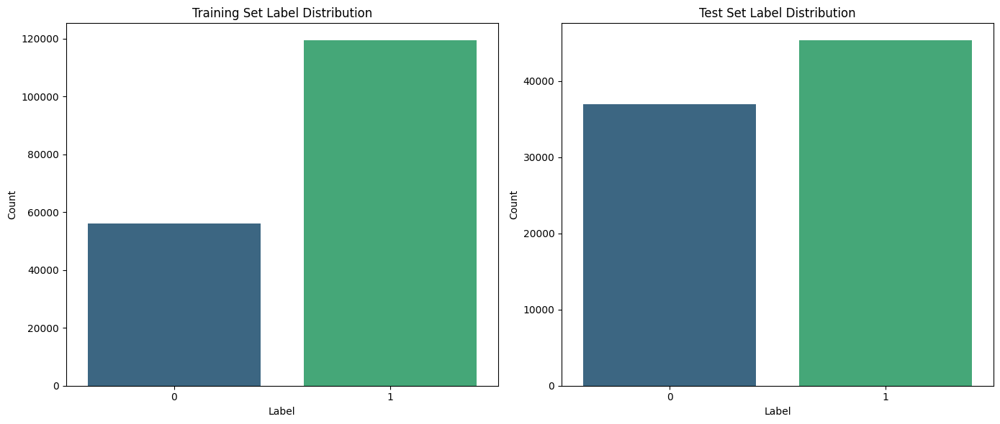

In [ ]:
# Set up the matplotlib figure
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

# Plot for the training set
sns.barplot(x=train_label_counts.index, y=train_label_counts.values, ax=axes[0], palette='viridis')
axes[0].set_title('Training Set Label Distribution')
axes[0].set_xlabel('Label')
axes[0].set_ylabel('Count')

# Plot for the test set
sns.barplot(x=test_label_counts.index, y=test_label_counts.values, ax=axes[1], palette='viridis')
axes[1].set_title('Test Set Label Distribution')
axes[1].set_xlabel('Label')
axes[1].set_ylabel('Count')

# Show the plot
plt.tight_layout()
plt.show()


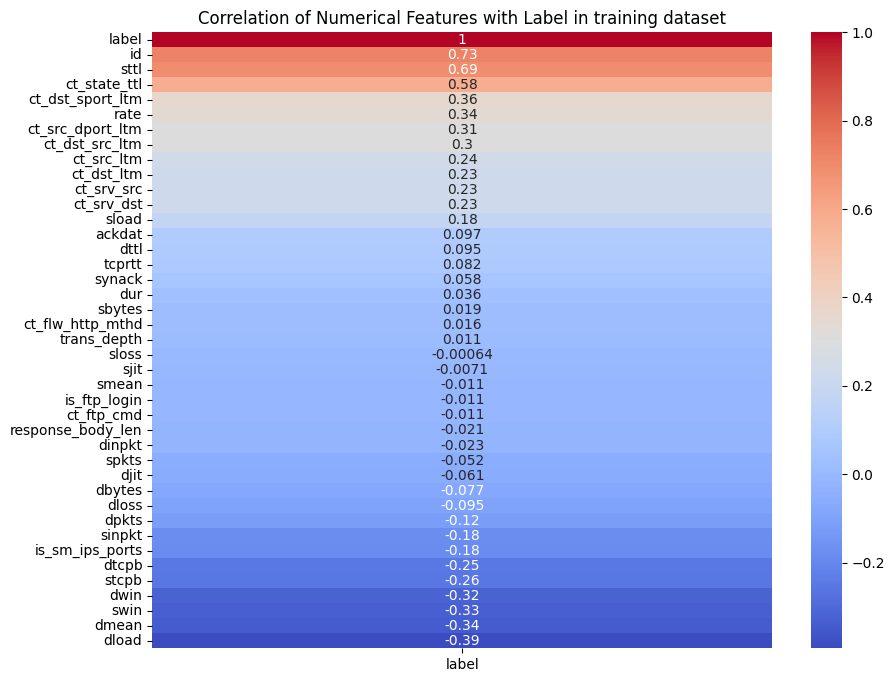

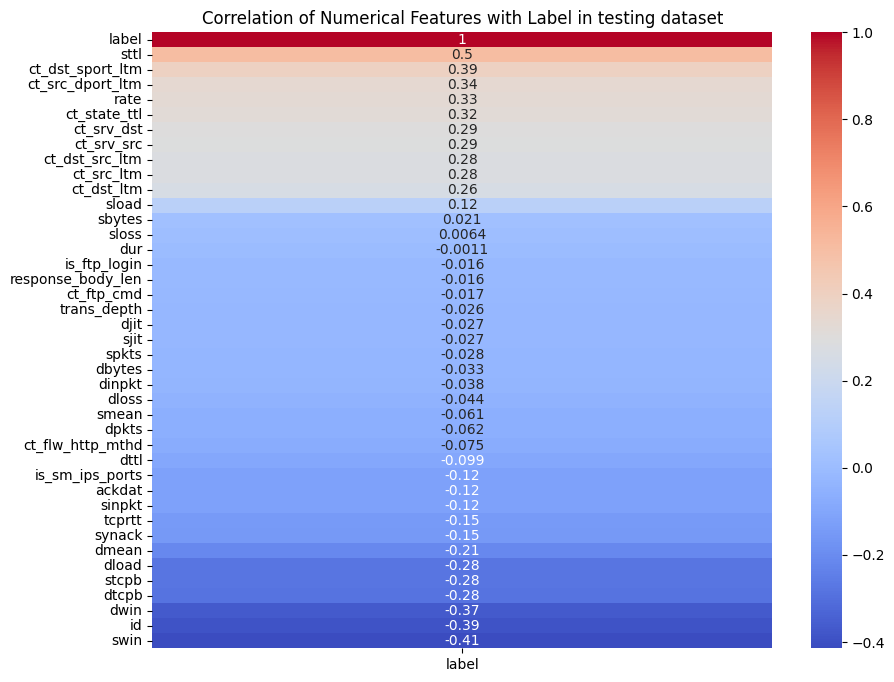

In [ ]:


# Selecting numerical columns
numerical_cols = train.select_dtypes(include='number').columns

plt.figure(figsize=(10, 8))
correlation = train[numerical_cols].corr()
sns.heatmap(correlation[['label']].sort_values(by='label', ascending=False), annot=True, cmap='coolwarm')
plt.title('Correlation of Numerical Features with Label in training dataset')
plt.show()


numerical_cols = test.select_dtypes(include='number').columns

plt.figure(figsize=(10, 8))
correlation = test[numerical_cols].corr()
sns.heatmap(correlation[['label']].sort_values(by='label', ascending=False), annot=True, cmap='coolwarm')
plt.title('Correlation of Numerical Features with Label in testing dataset')
plt.show()

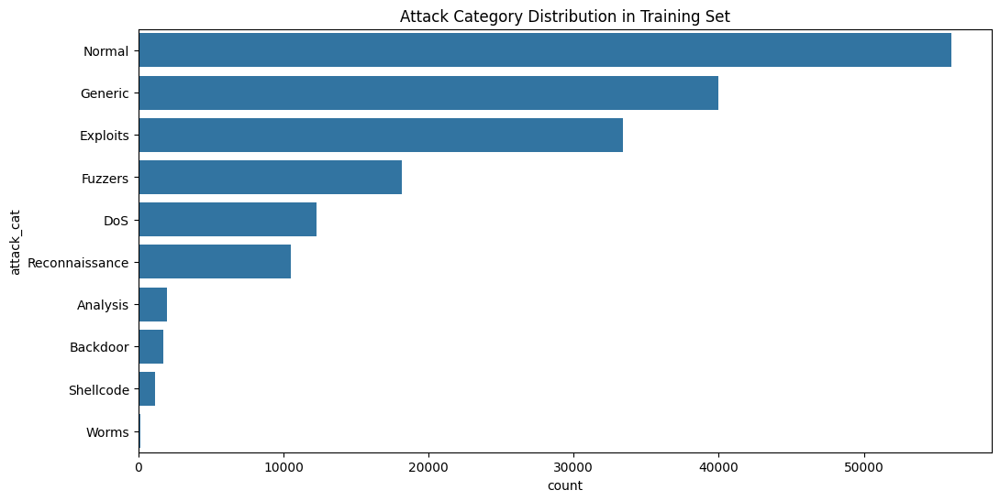

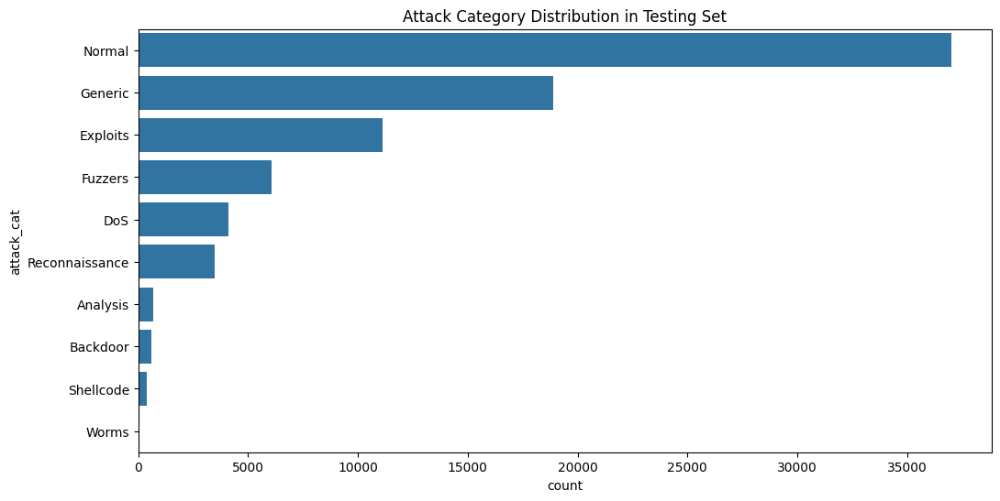

In [ ]:
# Plot the distribution of attack categories in the training set
plt.figure(figsize=(12, 6))
sns.countplot(y='attack_cat', data=train, order=train['attack_cat'].value_counts().index)
plt.title('Attack Category Distribution in Training Set')
plt.show()


# Plot the distribution of attack categories in the testing set
plt.figure(figsize=(12, 6))
sns.countplot(y='attack_cat', data=test, order=test['attack_cat'].value_counts().index)
plt.title('Attack Category Distribution in Testing Set')
plt.show()

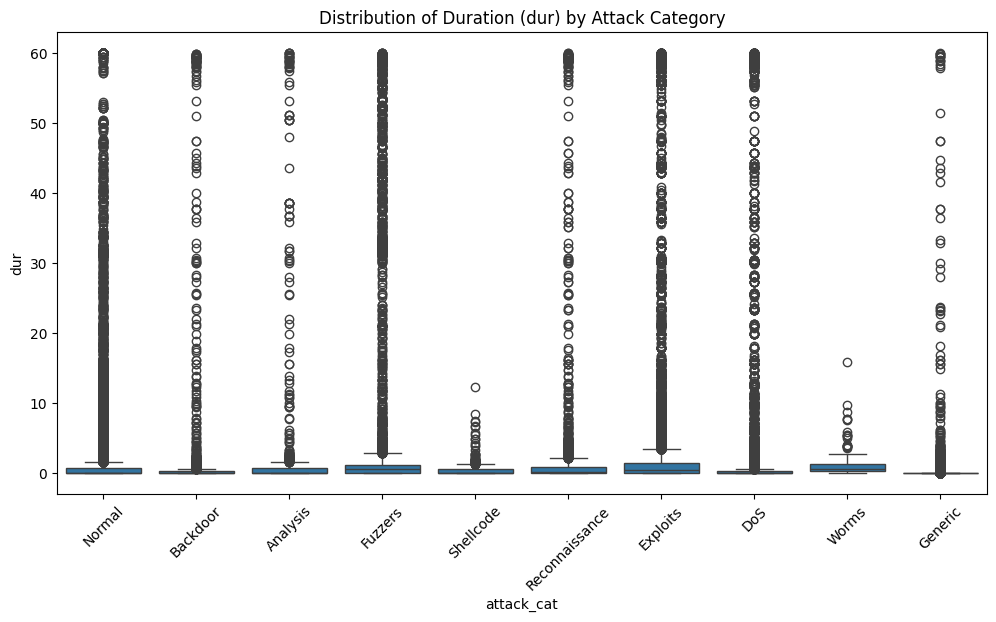

In [ ]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='attack_cat', y='dur', data=train)
plt.title('Distribution of Duration (dur) by Attack Category')
plt.xticks(rotation=45)
plt.show()


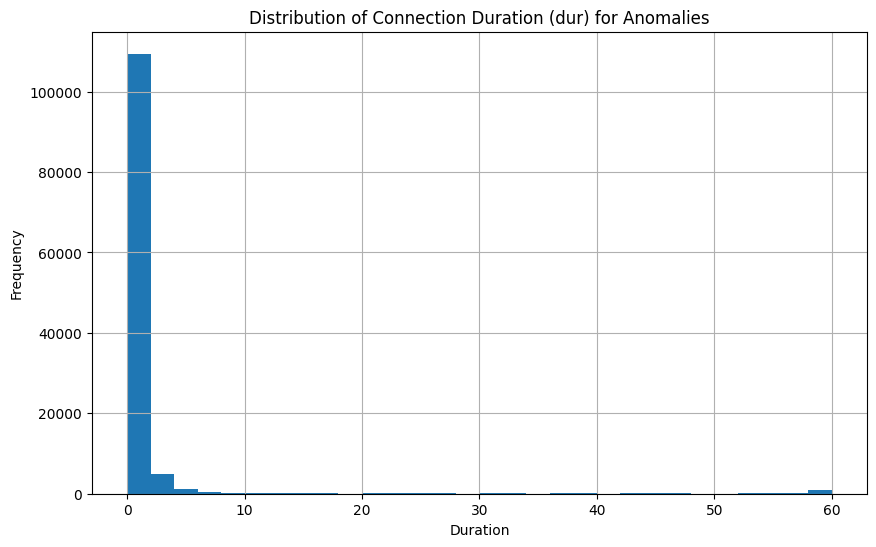

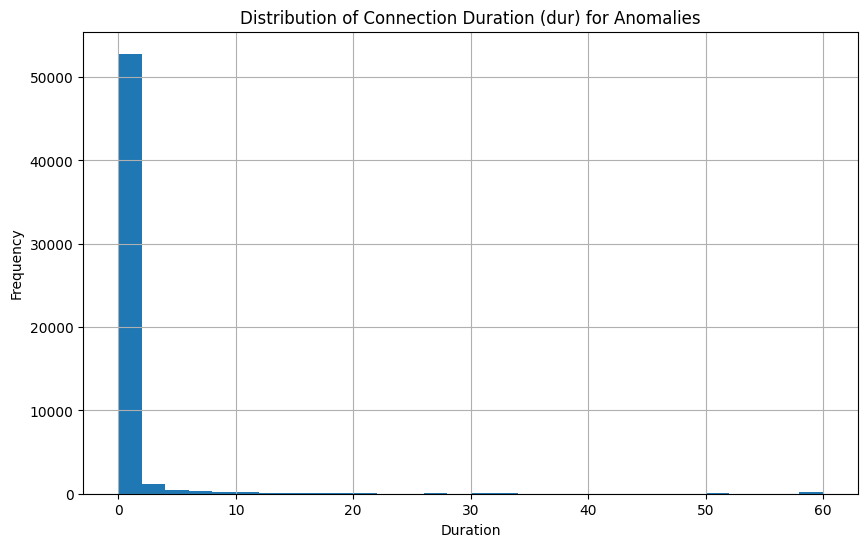

In [ ]:
train[train['label'] == 1]['dur'].hist(bins=30, figsize=(10, 6))
plt.title('Distribution of Connection Duration (dur) for Anomalies')
plt.xlabel('Duration')
plt.ylabel('Frequency')
plt.show()

train[train['label'] == 0]['dur'].hist(bins=30, figsize=(10, 6))
plt.title('Distribution of Connection Duration (dur) for Anomalies')
plt.xlabel('Duration')
plt.ylabel('Frequency')
plt.show()


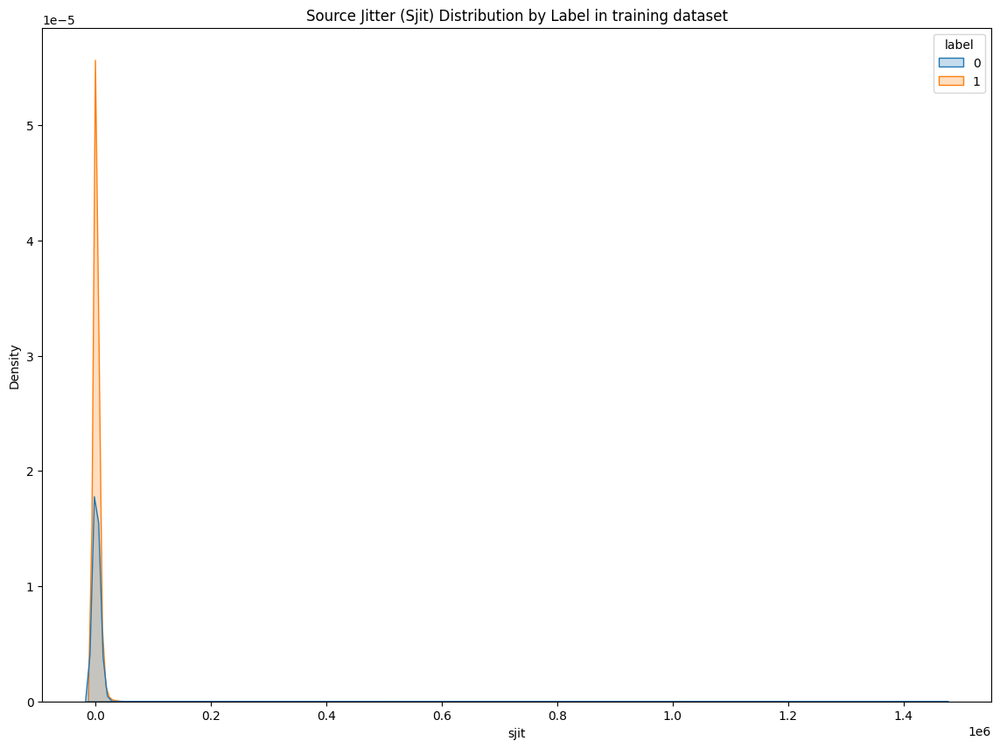

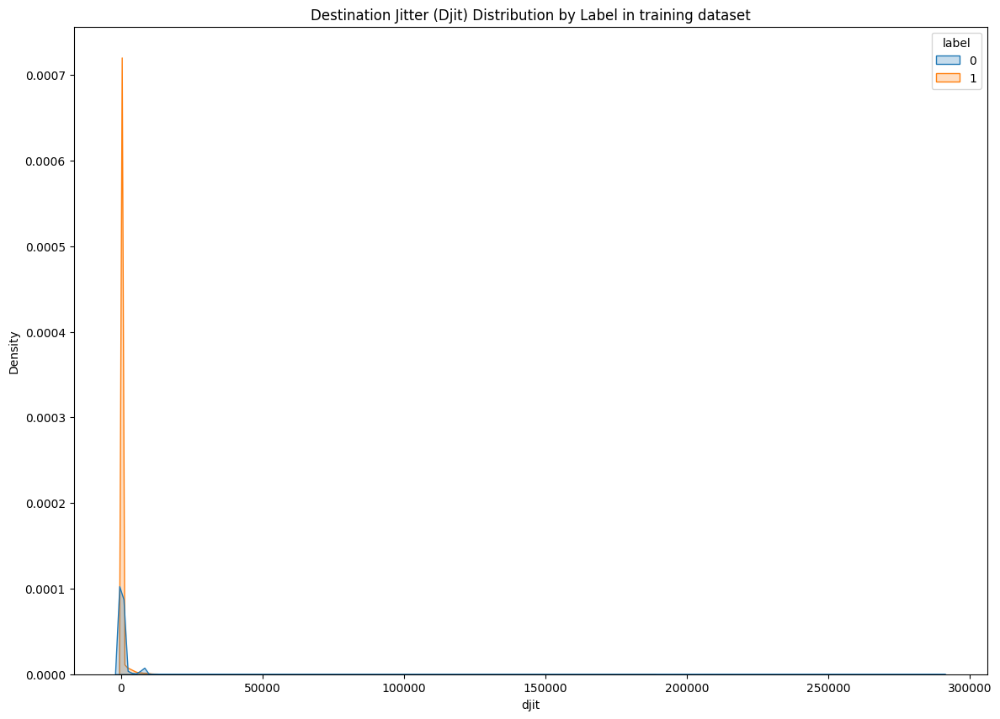

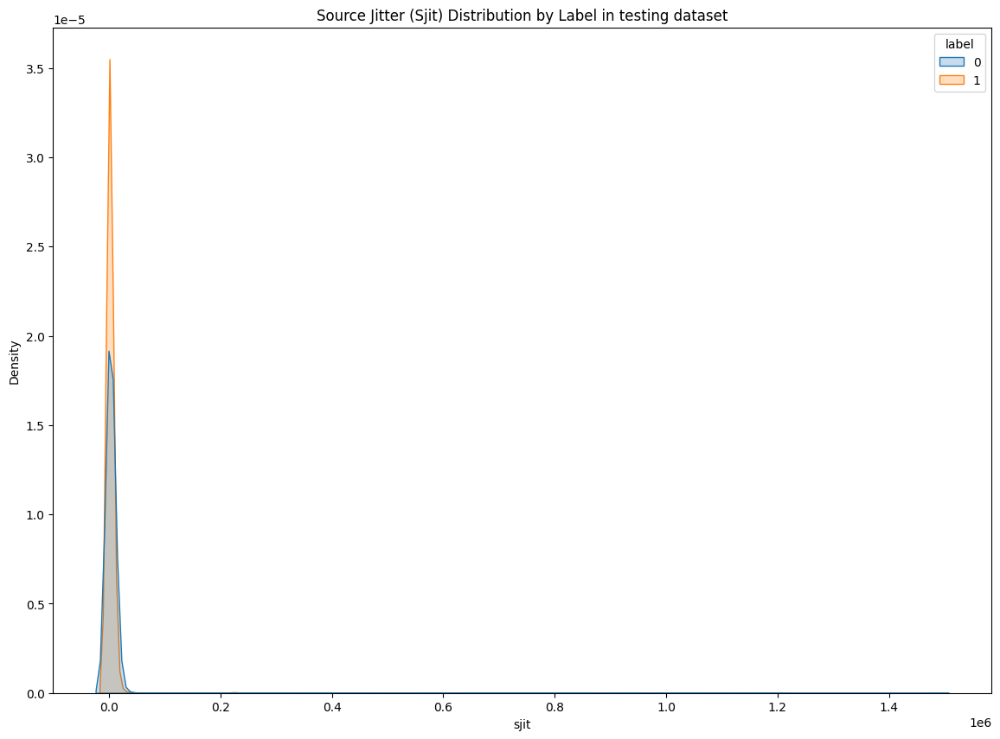

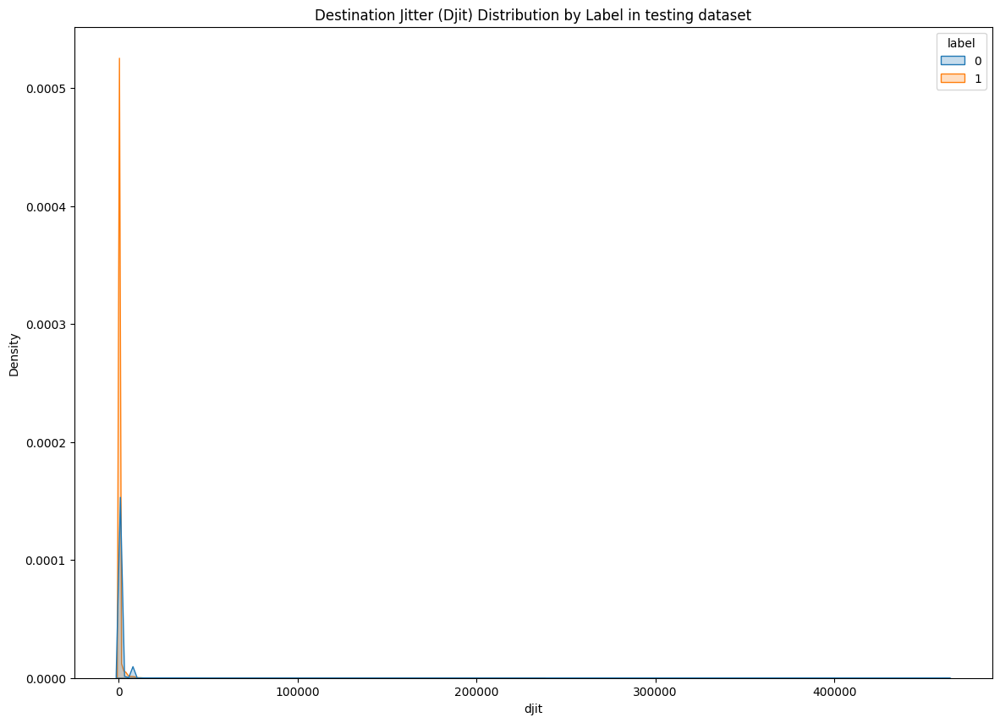

In [ ]:

plt.figure(figsize=(14, 10))
sns.kdeplot(data=train, x='sjit', hue='label', fill=True)
plt.title('Source Jitter (Sjit) Distribution by Label in training dataset')
plt.show()



plt.figure(figsize=(14, 10))
sns.kdeplot(data=train, x='djit', hue='label', fill=True)
plt.title('Destination Jitter (Djit) Distribution by Label in training dataset')
plt.show()


plt.figure(figsize=(14, 10))
sns.kdeplot(data=test, x='sjit', hue='label', fill=True)
plt.title('Source Jitter (Sjit) Distribution by Label in testing dataset')
plt.show()



plt.figure(figsize=(14, 10))
sns.kdeplot(data=test, x='djit', hue='label', fill=True)
plt.title('Destination Jitter (Djit) Distribution by Label in testing dataset')
plt.show()




Most repeated sjit values by label:
label
0    0.0
1    0.0
Name: sjit, dtype: float64

Most repeated djit values by label:
label
0    0.0
1    0.0
Name: djit, dtype: float64


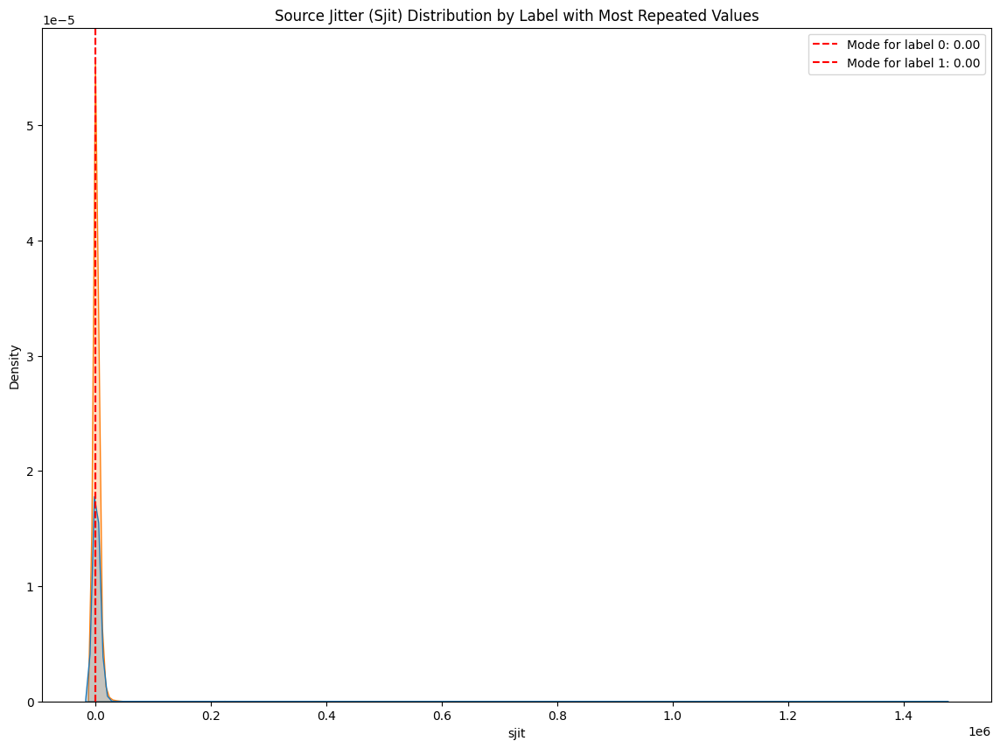

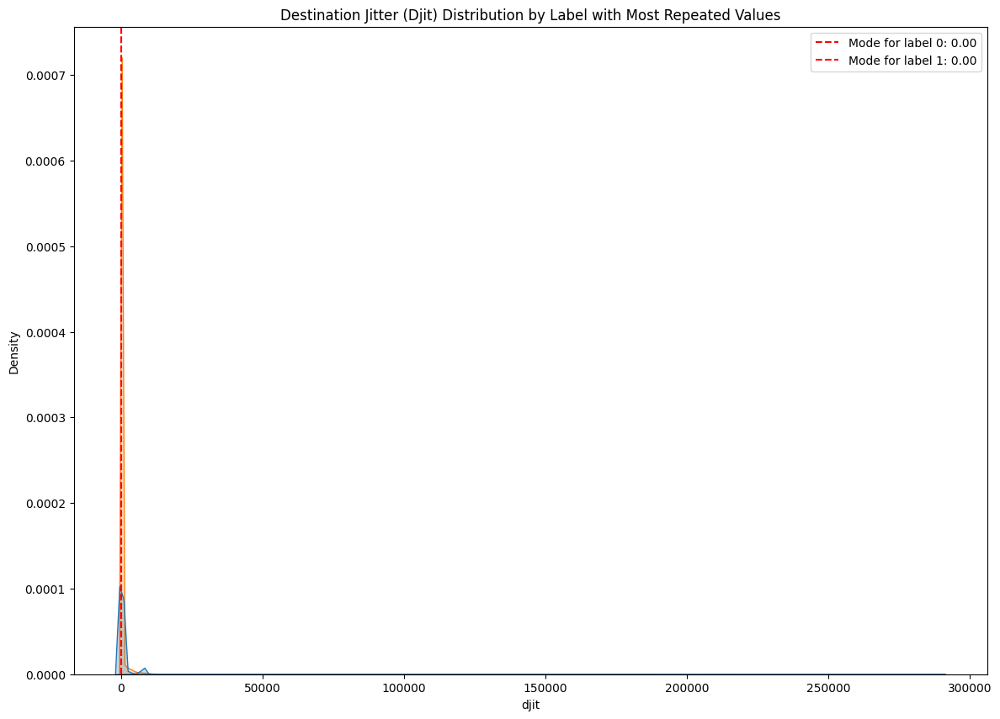

In [ ]:
# Calculate the most repeated (mode) values for sjit and djit by label
sjit_mode = train.groupby('label')['sjit'].apply(lambda x: x.mode().iloc[0] if not x.mode().empty else None)
djit_mode = train.groupby('label')['djit'].apply(lambda x: x.mode().iloc[0] if not x.mode().empty else None)

print("Most repeated sjit values by label:")
print(sjit_mode)

print("\nMost repeated djit values by label:")
print(djit_mode)

# Plot the distributions with annotations for the most repeated values
plt.figure(figsize=(14, 10))
sns.kdeplot(data=train, x='sjit', hue='label', fill=True)
for label, mode_value in sjit_mode.items():
    plt.axvline(mode_value, color='red', linestyle='--', label=f'Mode for label {label}: {mode_value:.2f}')
plt.title('Source Jitter (Sjit) Distribution by Label with Most Repeated Values')
plt.legend()
plt.show()

plt.figure(figsize=(14, 10))
sns.kdeplot(data=train, x='djit', hue='label', fill=True)
for label, mode_value in djit_mode.items():
    plt.axvline(mode_value, color='red', linestyle='--', label=f'Mode for label {label}: {mode_value:.2f}')
plt.title('Destination Jitter (Djit) Distribution by Label with Most Repeated Values')
plt.legend()
plt.show()



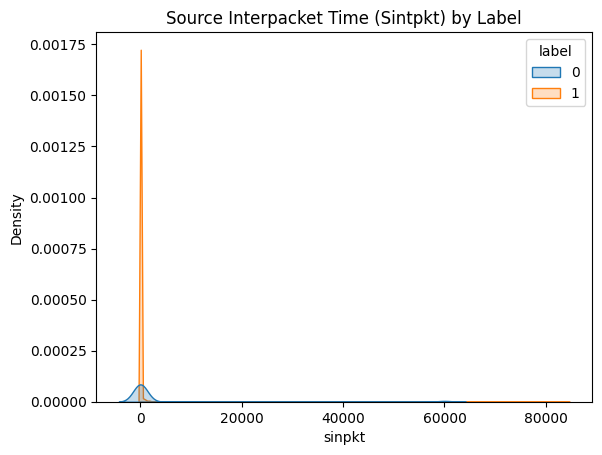

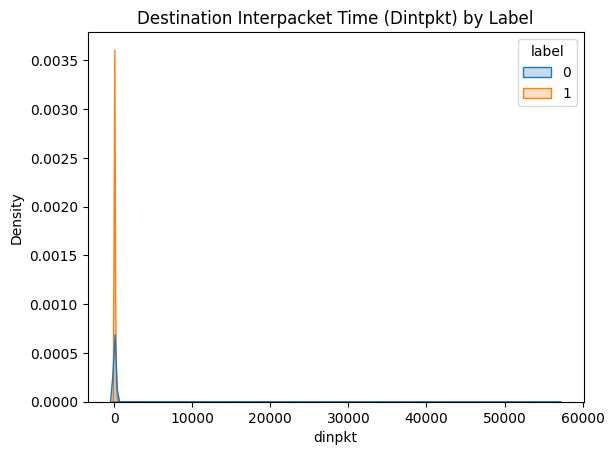

In [ ]:
sns.kdeplot(data=train, x='sinpkt', hue='label', fill=True)
plt.title('Source Interpacket Time (Sintpkt) by Label')
plt.show()

sns.kdeplot(data=train, x='dinpkt', hue='label', fill=True)
plt.title('Destination Interpacket Time (Dintpkt) by Label')
plt.show()


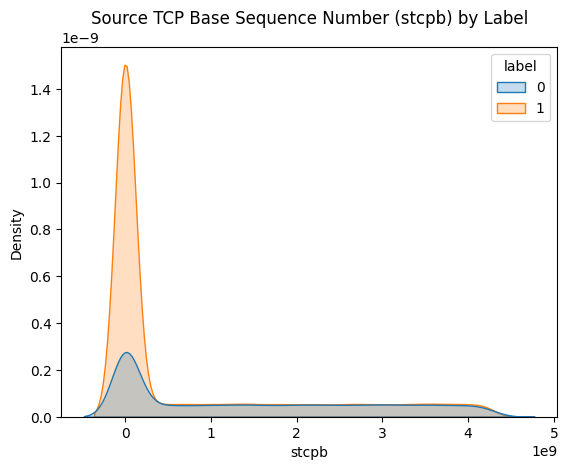

In [ ]:
sns.kdeplot(data=train, x='stcpb', hue='label', fill=True)
plt.title('Source TCP Base Sequence Number (stcpb) by Label')
plt.show()


Mode of sttl by label: label
0     31
1    254
Name: sttl, dtype: int64
Mode of ct_state_ttl by label: label
0    0
1    2
Name: ct_state_ttl, dtype: int64


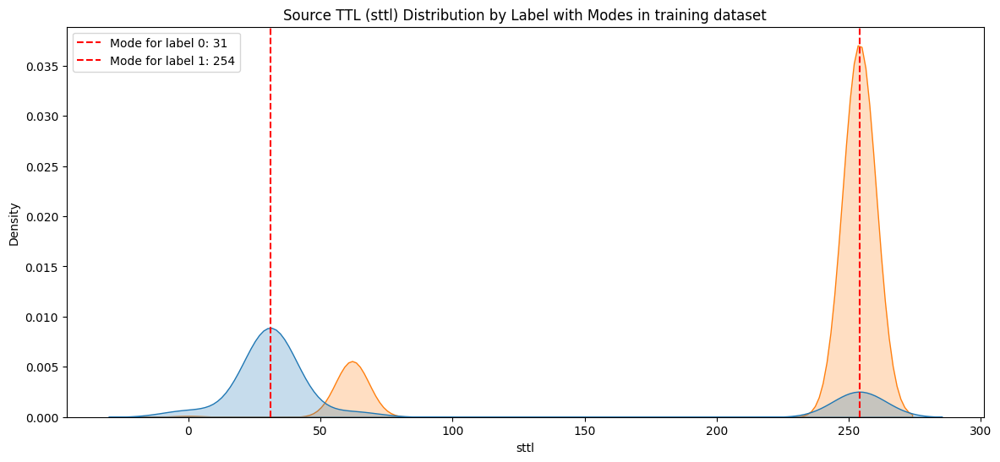

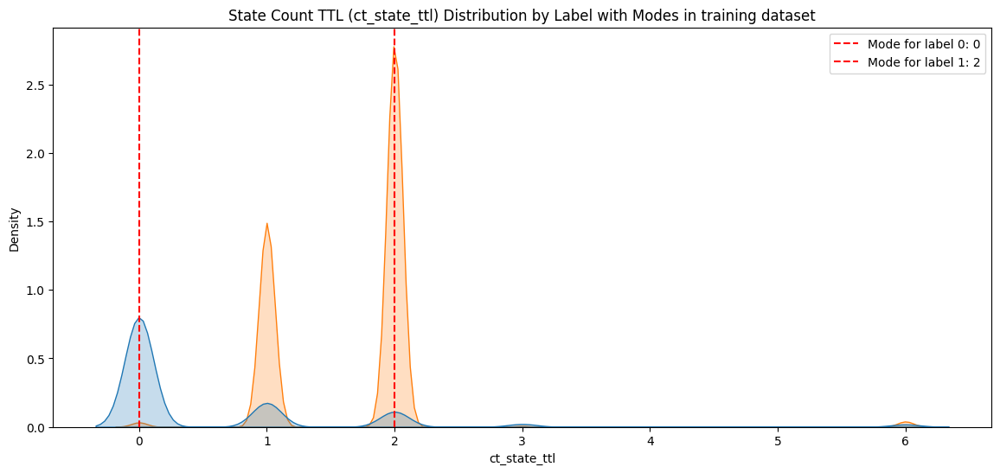

Mode of sttl by label: label
0     31
1    254
Name: sttl, dtype: int64
Mode of ct_state_ttl by label: label
0    0
1    2
Name: ct_state_ttl, dtype: int64


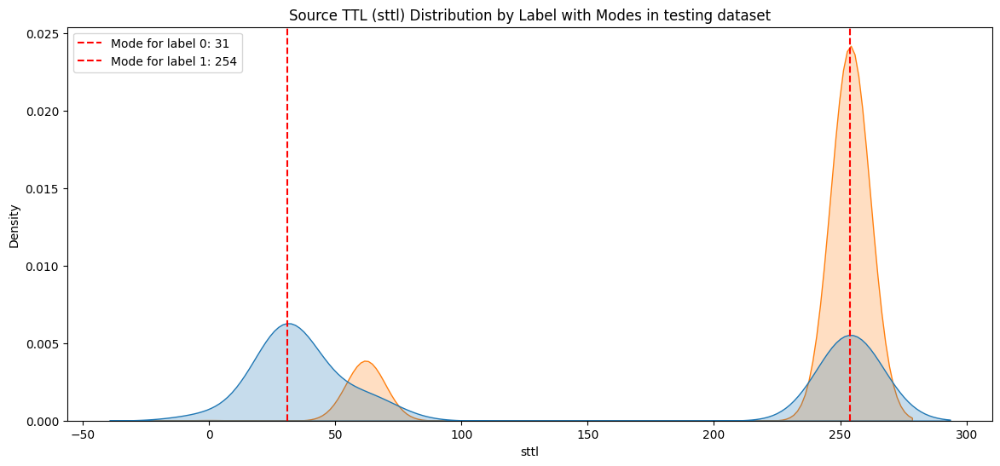

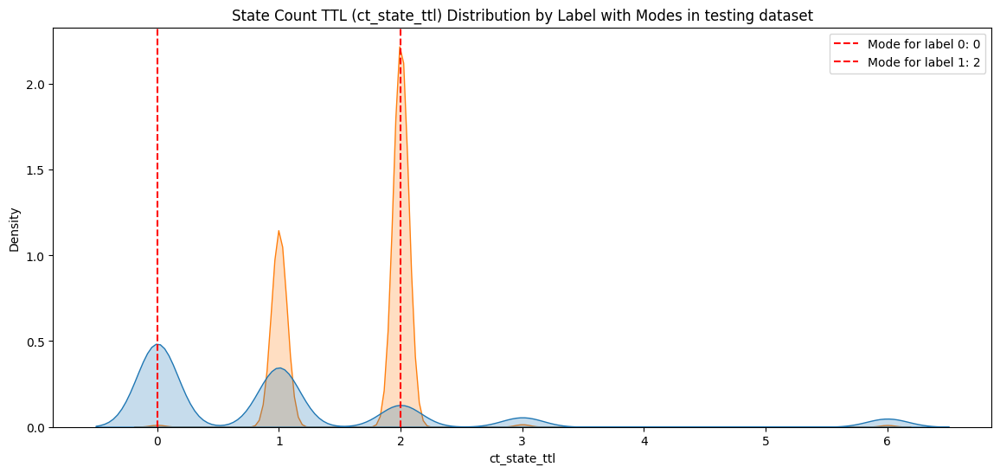

In [ ]:
# Modes for sttl and ct_state_ttl by label
sttl_mode = train.groupby('label')['sttl'].apply(lambda x: x.mode().iloc[0] if not x.mode().empty else None)
ct_state_ttl_mode = train.groupby('label')['ct_state_ttl'].apply(lambda x: x.mode().iloc[0] if not x.mode().empty else None)

print("Mode of sttl by label:", sttl_mode)
print("Mode of ct_state_ttl by label:", ct_state_ttl_mode)

# Plot sttl with modes
plt.figure(figsize=(14, 6))
sns.kdeplot(data=train, x='sttl', hue='label', fill=True)
for label, mode_value in sttl_mode.items():
    plt.axvline(mode_value, color='red', linestyle='--', label=f'Mode for label {label}: {mode_value}')
plt.title('Source TTL (sttl) Distribution by Label with Modes in training dataset')
plt.legend()
plt.show()

# Plot ct_state_ttl with modes
plt.figure(figsize=(14, 6))
sns.kdeplot(data=train, x='ct_state_ttl', hue='label', fill=True)
for label, mode_value in ct_state_ttl_mode.items():
    plt.axvline(mode_value, color='red', linestyle='--', label=f'Mode for label {label}: {mode_value}')
plt.title('State Count TTL (ct_state_ttl) Distribution by Label with Modes in training dataset')
plt.legend()
plt.show()





# Modes for sttl and ct_state_ttl by label
sttl_mode = test.groupby('label')['sttl'].apply(lambda x: x.mode().iloc[0] if not x.mode().empty else None)
ct_state_ttl_mode = test.groupby('label')['ct_state_ttl'].apply(lambda x: x.mode().iloc[0] if not x.mode().empty else None)

print("Mode of sttl by label:", sttl_mode)
print("Mode of ct_state_ttl by label:", ct_state_ttl_mode)

# Plot sttl with modes
plt.figure(figsize=(14, 6))
sns.kdeplot(data=test, x='sttl', hue='label', fill=True)
for label, mode_value in sttl_mode.items():
    plt.axvline(mode_value, color='red', linestyle='--', label=f'Mode for label {label}: {mode_value}')
plt.title('Source TTL (sttl) Distribution by Label with Modes in testing dataset')
plt.legend()
plt.show()

# Plot ct_state_ttl with modes
plt.figure(figsize=(14, 6))
sns.kdeplot(data=test, x='ct_state_ttl', hue='label', fill=True)
for label, mode_value in ct_state_ttl_mode.items():
    plt.axvline(mode_value, color='red', linestyle='--', label=f'Mode for label {label}: {mode_value}')
plt.title('State Count TTL (ct_state_ttl) Distribution by Label with Modes in testing dataset')
plt.legend()
plt.show()

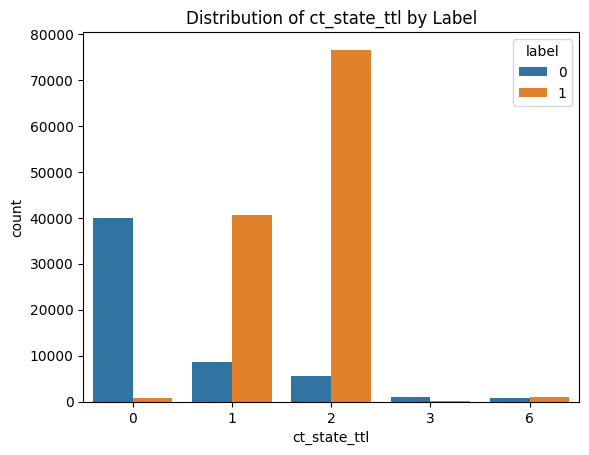

In [ ]:
sns.countplot(x='ct_state_ttl', hue='label', data=train)
plt.title('Distribution of ct_state_ttl by Label')
plt.show()


In [ ]:
grouped_stats = train.groupby('label')[['ct_dst_sport_ltm', 'ct_src_dport_ltm']].agg(['mean', 'var']).reset_index()
print("Mean and Variance of ct_sport_itm and ct_dport_itm by Label:")
print(grouped_stats)

print()

print("Mean and Variance of 'ct_dst_sport_ltm' and 'ct_src_dport_ltm' by Label\n")

print(grouped_stats.to_markdown(index=False))



Mean and Variance of ct_sport_itm and ct_dport_itm by Label:
  label ct_dst_sport_ltm            ct_src_dport_ltm           
                    mean        var             mean        var
0     0         1.190304   4.037660         1.793804   7.458920
1     1         5.621471  40.980378         7.067998  82.758163

Mean and Variance of 'ct_dst_sport_ltm' and 'ct_src_dport_ltm' by Label

|   ('label', '') |   ('ct_dst_sport_ltm', 'mean') |   ('ct_dst_sport_ltm', 'var') |   ('ct_src_dport_ltm', 'mean') |   ('ct_src_dport_ltm', 'var') |
|----------------:|-------------------------------:|------------------------------:|-------------------------------:|------------------------------:|
|               0 |                        1.1903  |                       4.03766 |                         1.7938 |                       7.45892 |
|               1 |                        5.62147 |                      40.9804  |                         7.068  |                      82.7582  |


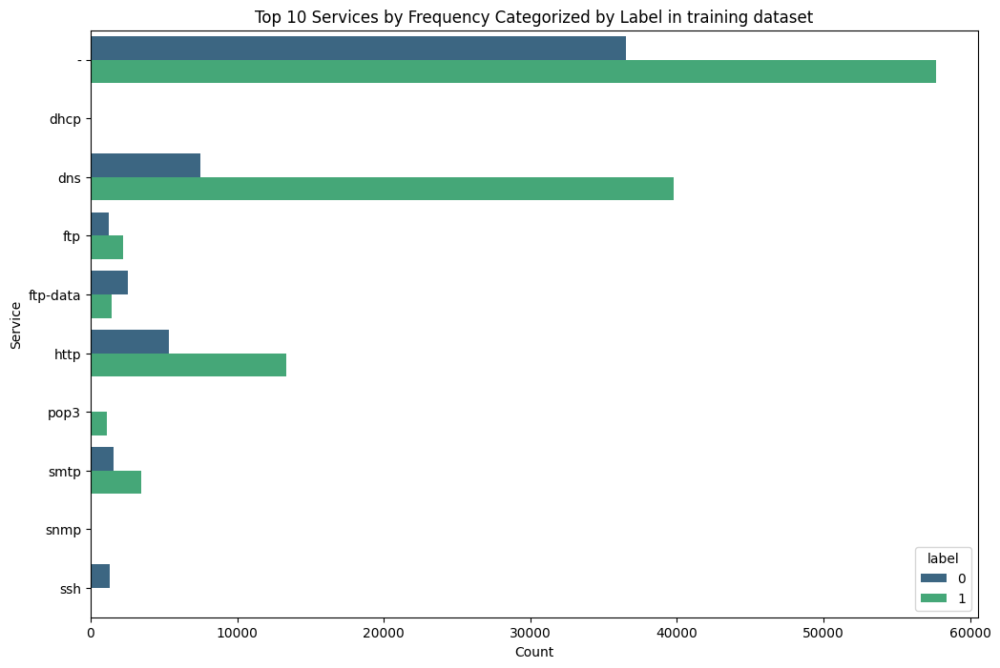

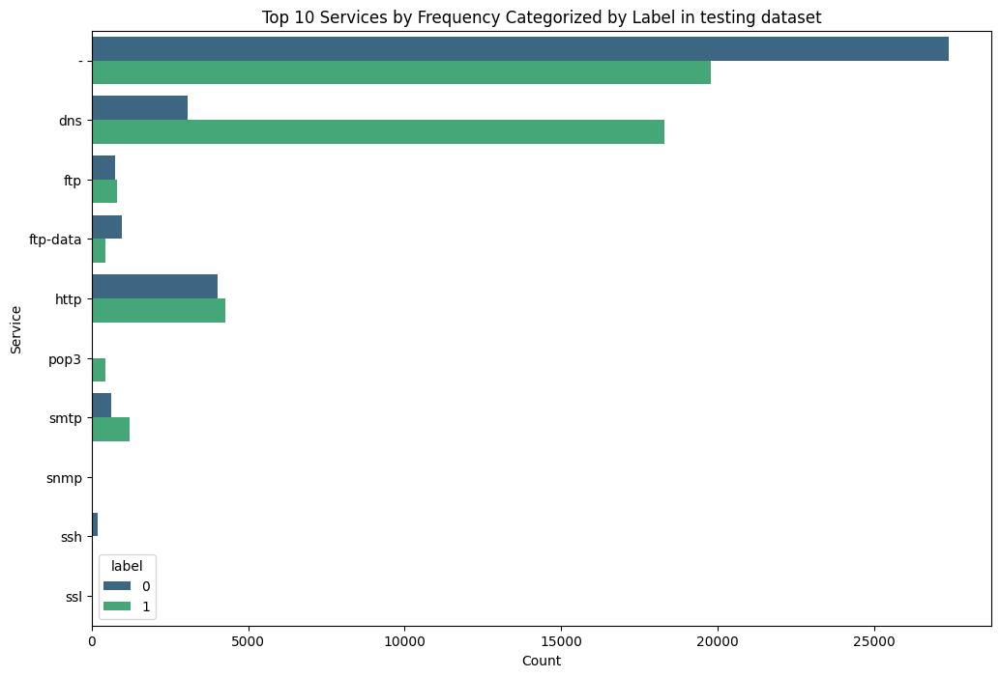

In [ ]:
# Group data by 'service' and 'label', then count occurrences
service_label_counts = train.groupby(['service', 'label']).size().reset_index(name='count')

# Get the top 10 services overall
top_services = train['service'].value_counts().head(10).index

# Filter data for only the top services
filtered_data = service_label_counts[service_label_counts['service'].isin(top_services)]

# Create a barplot for top services categorized by label
plt.figure(figsize=(12, 8))
sns.barplot(
    x='count', y='service', hue='label', data=filtered_data, palette='viridis'
)
plt.title('Top 10 Services by Frequency Categorized by Label in training dataset')
plt.xlabel('Count')
plt.ylabel('Service')
plt.show()


# Group data by 'service' and 'label', then count occurrences
service_label_counts = test.groupby(['service', 'label']).size().reset_index(name='count')

# Get the top 10 services overall
top_services = test['service'].value_counts().head(10).index

# Filter data for only the top services
filtered_data = service_label_counts[service_label_counts['service'].isin(top_services)]

# Create a barplot for top services categorized by label
plt.figure(figsize=(12, 8))
sns.barplot(
    x='count', y='service', hue='label', data=filtered_data, palette='viridis'
)
plt.title('Top 10 Services by Frequency Categorized by Label in testing dataset')
plt.xlabel('Count')
plt.ylabel('Service')
plt.show()

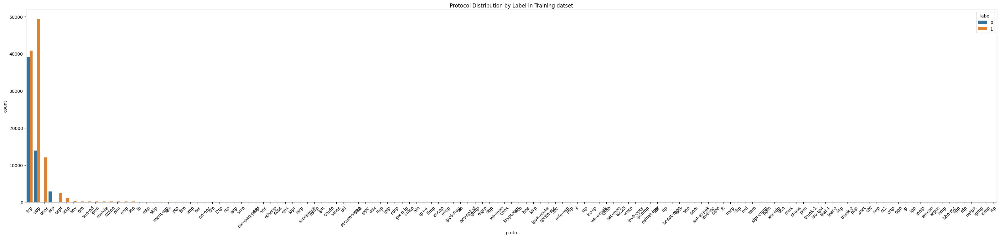

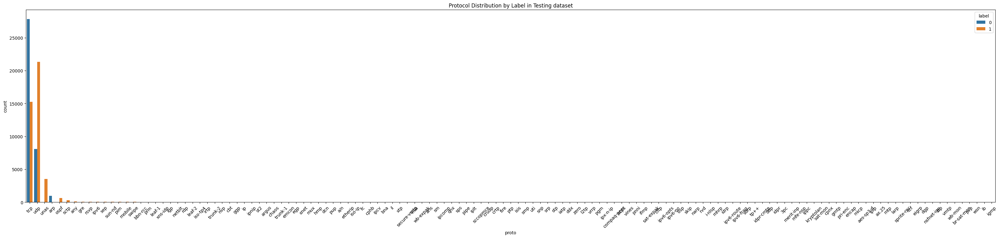

In [ ]:
# Plot protocol usage distribution in attack vs. normal traffic
plt.figure(figsize=(40,8))
sns.countplot(x='proto', hue='label', data=train, order=train['proto'].value_counts().index)
plt.title('Protocol Distribution by Label in Training datset')
plt.xticks(rotation=45)
plt.show()

# Plot protocol usage distribution in attack vs. normal traffic
plt.figure(figsize=(40,8))
sns.countplot(x='proto', hue='label', data=test, order=test['proto'].value_counts().index)
plt.title('Protocol Distribution by Label in Testing dataset')
plt.xticks(rotation=45)
plt.show()

<ipython-input-27-ab0afa7b5abf>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=rare_protocols.values, y=rare_protocols.index, palette='mako')


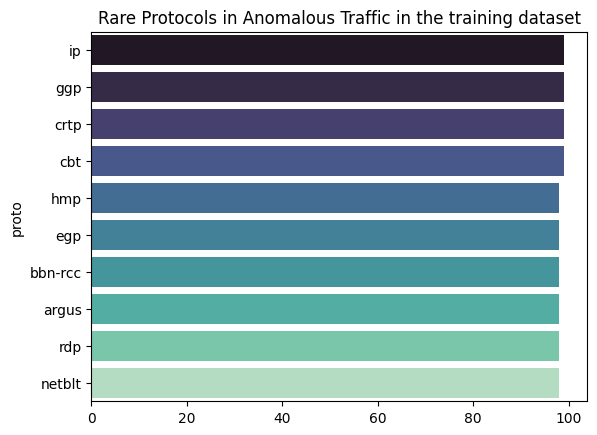

<ipython-input-27-ab0afa7b5abf>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=rare_protocols.values, y=rare_protocols.index, palette='mako')


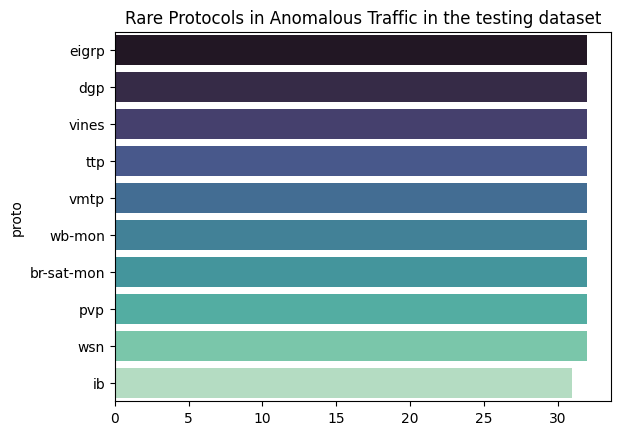

In [ ]:
rare_protocols = train[train['label'] == 1]['proto'].value_counts().tail(10)
sns.barplot(x=rare_protocols.values, y=rare_protocols.index, palette='mako')
plt.title('Rare Protocols in Anomalous Traffic in the training dataset')
plt.show()


rare_protocols = test[test['label'] == 1]['proto'].value_counts().tail(10)
sns.barplot(x=rare_protocols.values, y=rare_protocols.index, palette='mako')
plt.title('Rare Protocols in Anomalous Traffic in the testing dataset')
plt.show()

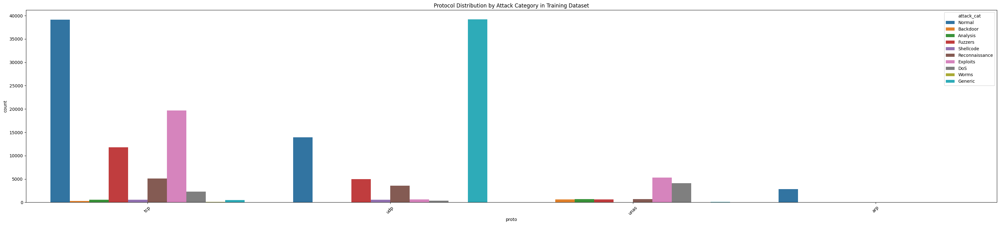

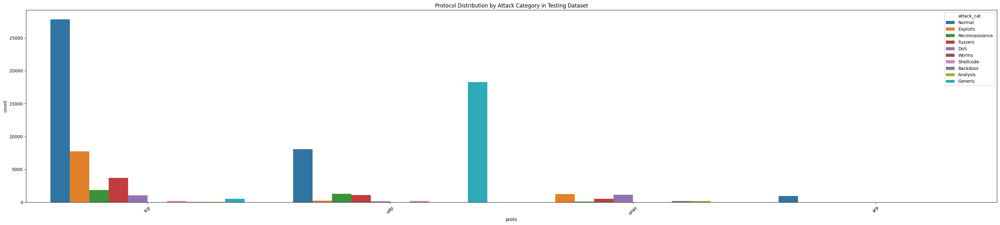

In [ ]:
# Getting top 6 protocols from the training and testing dataset
top_4_proto_train = train['proto'].value_counts().index[:4]
top_4_proto_test = test['proto'].value_counts().index[:4]


plt.figure(figsize=(40, 8))
sns.countplot(x='proto', hue='attack_cat', data=train[train['proto'].isin(top_4_proto_train)], order=top_4_proto_train)
plt.title('Protocol Distribution by Attack Category in Training Dataset')
plt.xticks(rotation=45)
plt.show()


plt.figure(figsize=(40, 8))
sns.countplot(x='proto', hue='attack_cat', data=test[test['proto'].isin(top_4_proto_test)], order=top_4_proto_test)
plt.title('Protocol Distribution by Attack Category in Testing Dataset')
plt.xticks(rotation=45)
plt.show()


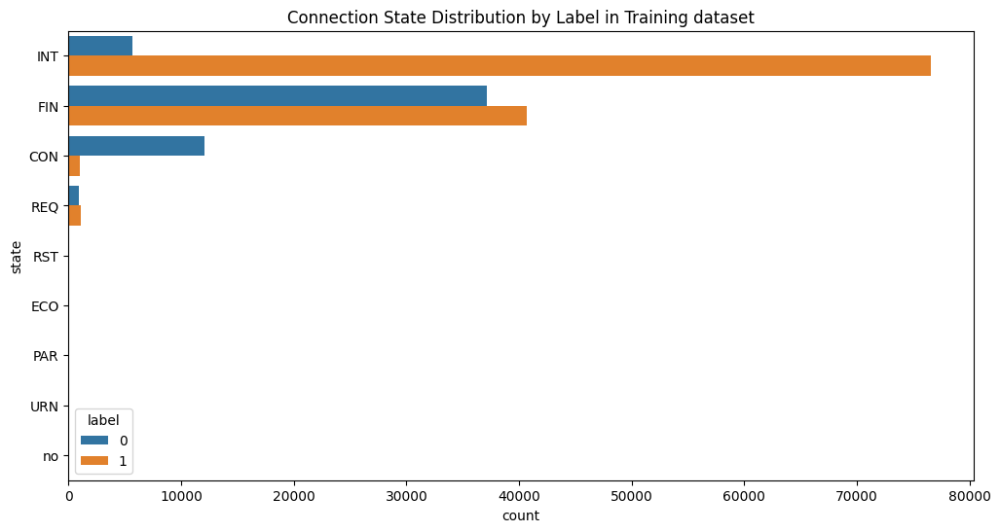

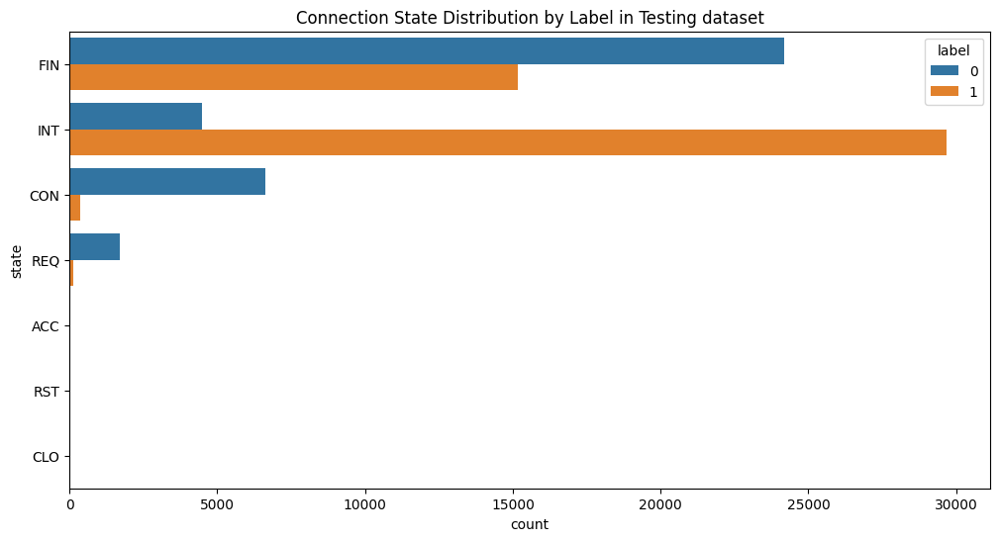

In [ ]:
# Plot connection state distribution in attack vs. normal traffic
plt.figure(figsize=(12, 6))
sns.countplot(y='state', hue='label', data=train, order=train['state'].value_counts().index)
plt.title('Connection State Distribution by Label in Training dataset')
plt.show()


# Plot connection state distribution in attack vs. normal traffic
plt.figure(figsize=(12, 6))
sns.countplot(y='state', hue='label', data=test, order=test['state'].value_counts().index)
plt.title('Connection State Distribution by Label in Testing dataset')
plt.show()

In [ ]:
# Calculate mean, min, and max for spkts and dpkts grouped by label
summary_stats_train = train.groupby('label')[['spkts', 'dpkts']].agg(['mean', 'min', 'max']).reset_index()
summary_stats_test = test.groupby('label')[['spkts', 'dpkts']].agg(['mean', 'min', 'max']).reset_index()

# Display the results
print("Training Dataset Summary (spkts and dpkts):")
print(summary_stats_train)

print("\nTesting Dataset Summary (spkts and dpkts):")
print(summary_stats_test)


print()

# Display the results as tables
print("Training Dataset Summary (spkts and dpkts):\n")

print(summary_stats_train.to_markdown(index=False))

print("\nTesting Dataset Summary (spkts and dpkts):\n")

print(summary_stats_test.to_markdown(index=False))


Training Dataset Summary (spkts and dpkts):
  label      spkts                dpkts           
              mean min   max       mean min    max
0     0  30.725482   1   656  38.057696   0   1716
1     1  15.405946   1  9616  10.012619   0  10974

Testing Dataset Summary (spkts and dpkts):
  label      spkts                 dpkts           
              mean min    max       mean min    max
0     0  22.776973   1    690  25.415324   0   1432
1     1  15.311480   1  10646  11.122937   0  11018

Training Dataset Summary (spkts and dpkts):

|   ('label', '') |   ('spkts', 'mean') |   ('spkts', 'min') |   ('spkts', 'max') |   ('dpkts', 'mean') |   ('dpkts', 'min') |   ('dpkts', 'max') |
|----------------:|--------------------:|-------------------:|-------------------:|--------------------:|-------------------:|-------------------:|
|               0 |             30.7255 |                  1 |                656 |             38.0577 |                  0 |               1716 |
|         

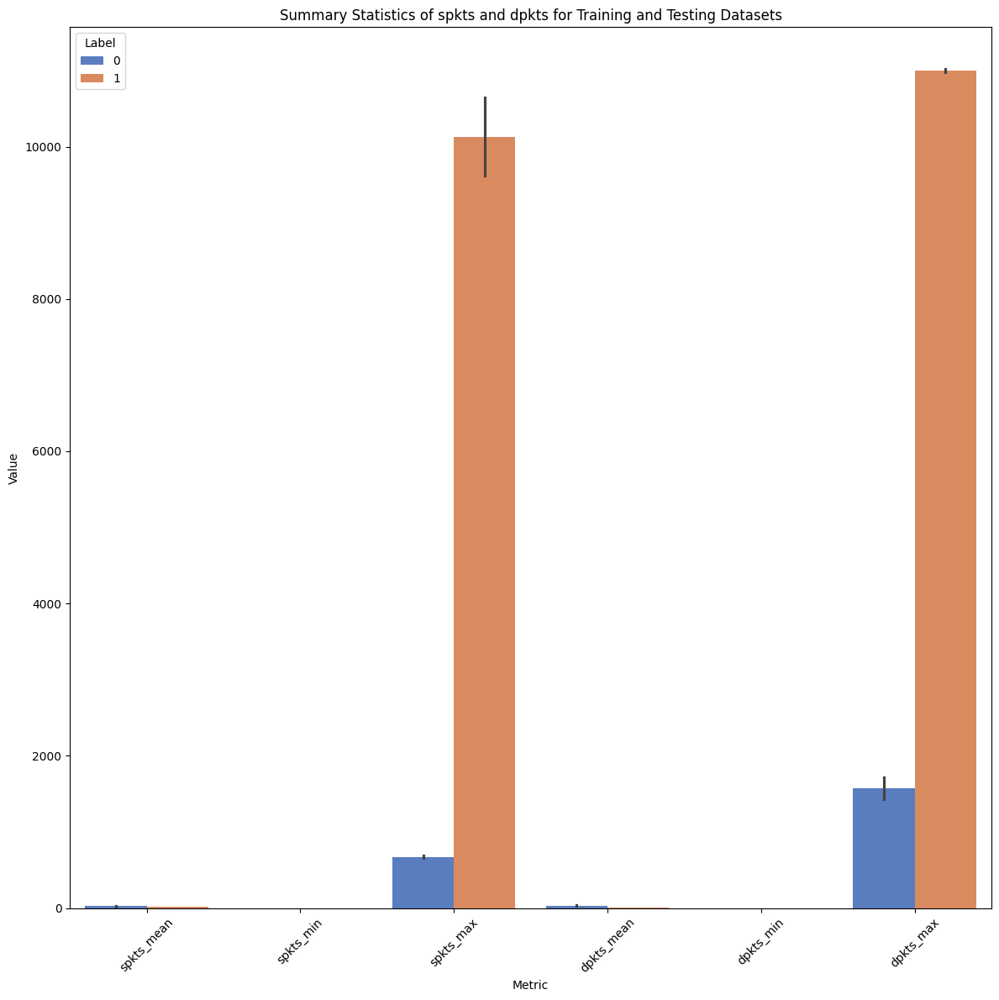

In [ ]:


# Rename the columns for clarity
summary_stats_train.columns = ['label', 'spkts_mean', 'spkts_min', 'spkts_max', 'dpkts_mean', 'dpkts_min', 'dpkts_max']
summary_stats_test.columns = ['label', 'spkts_mean', 'spkts_min', 'spkts_max', 'dpkts_mean', 'dpkts_min', 'dpkts_max']

# Melt the data to long format for easier plotting
train_melted = summary_stats_train.melt(id_vars='label',
                                          value_vars=['spkts_mean', 'spkts_min', 'spkts_max', 'dpkts_mean', 'dpkts_min', 'dpkts_max'],
                                          var_name='metric',
                                          value_name='value')

test_melted = summary_stats_test.melt(id_vars='label',
                                        value_vars=['spkts_mean', 'spkts_min', 'spkts_max', 'dpkts_mean', 'dpkts_min', 'dpkts_max'],
                                        var_name='metric',
                                        value_name='value')

# Add a column to distinguish between train and test datasets
train_melted['dataset'] = 'Training'
test_melted['dataset'] = 'Testing'

# Combine both melted dataframes
combined_data = pd.concat([train_melted, test_melted], ignore_index=True)

# Set up the matplotlib figure
plt.figure(figsize=(12, 12))

# Create the bar plot
sns.barplot(data=combined_data, x='metric', y='value', hue='label', palette='muted', dodge=True)

# Add title and labels
plt.title('Summary Statistics of spkts and dpkts for Training and Testing Datasets')
plt.xlabel('Metric')
plt.ylabel('Value')
plt.xticks(rotation=45)
plt.legend(title='Label', loc='upper left')
plt.tight_layout()

# Show the plot
plt.show()


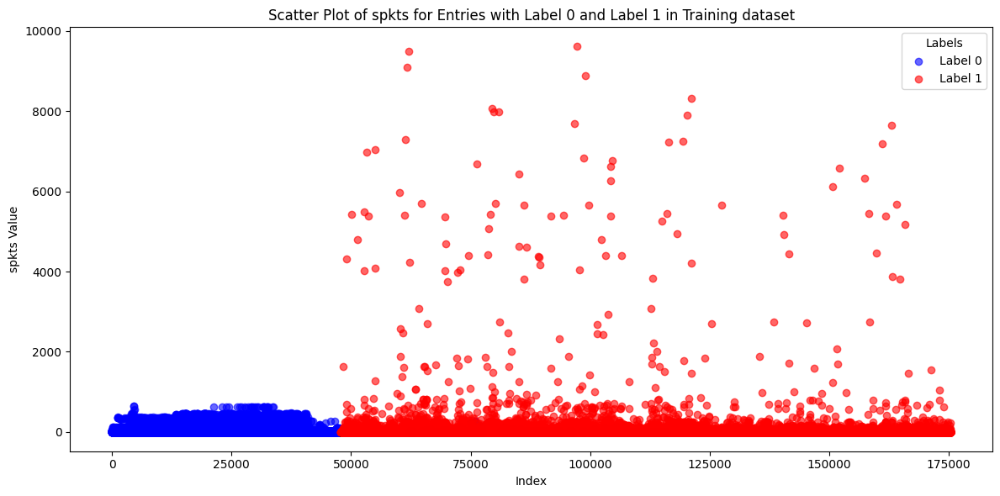

In [ ]:





# Create a scatter plot for spkts where label is 0 and label is 1
plt.figure(figsize=(12, 6))

# Filter the data where label is 0
subset_0 = train[train['label'] == 0]
# Filter the data where label is 1
subset_1 = train[train['label'] == 1]

# Scatter plot of spkts for entries where label is 0
plt.scatter(subset_0.index, subset_0['spkts'], color='blue', alpha=0.6, label='Label 0')

# Scatter plot of spkts for entries where label is 1
plt.scatter(subset_1.index, subset_1['spkts'], color='red', alpha=0.6, label='Label 1')

# Add title and labels
plt.title('Scatter Plot of spkts for Entries with Label 0 and Label 1 in Training dataset')
plt.xlabel('Index')
plt.ylabel('spkts Value')
plt.legend(title='Labels')
plt.tight_layout()

# Show the plot
plt.show()




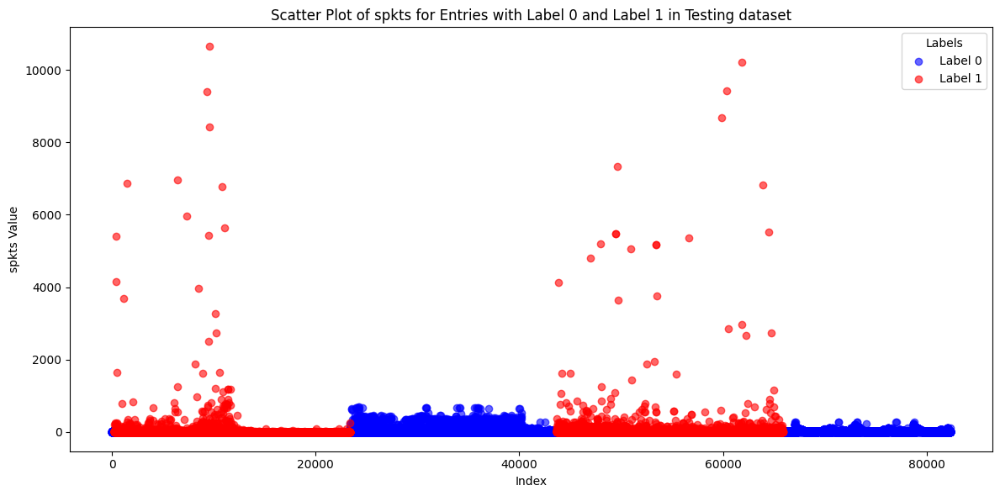

In [ ]:
# Create a scatter plot for spkts where label is 0 and label is 1
plt.figure(figsize=(12, 6))

# Filter the data where label is 0
subset_0 = test[test['label'] == 0]
# Filter the data where label is 1
subset_1 = test[test['label'] == 1]

# Scatter plot of spkts for entries where label is 0
plt.scatter(subset_0.index, subset_0['spkts'], color='blue', alpha=0.6, label='Label 0')

# Scatter plot of spkts for entries where label is 1
plt.scatter(subset_1.index, subset_1['spkts'], color='red', alpha=0.6, label='Label 1')

# Add title and labels
plt.title('Scatter Plot of spkts for Entries with Label 0 and Label 1 in Testing dataset')
plt.xlabel('Index')
plt.ylabel('spkts Value')
plt.legend(title='Labels')
plt.tight_layout()

# Show the plot
plt.show()

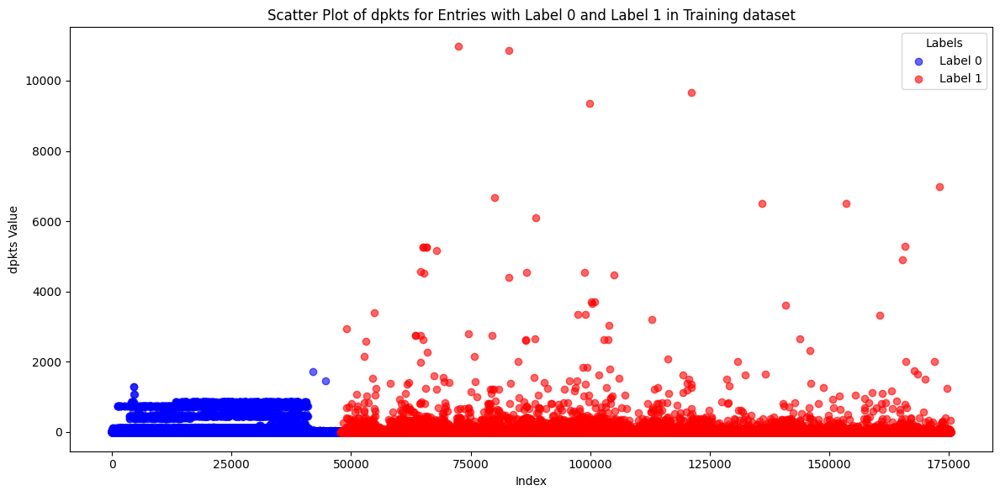

In [ ]:


# Create a scatter plot for spkts where label is 0 and label is 1
plt.figure(figsize=(12, 6))

# Filter the data where label is 0
subset_0 = train[train['label'] == 0]
# Filter the data where label is 1
subset_1 = train[train['label'] == 1]

# Scatter plot of spkts for entries where label is 0
plt.scatter(subset_0.index, subset_0['dpkts'], color='blue', alpha=0.6, label='Label 0')

# Scatter plot of spkts for entries where label is 1
plt.scatter(subset_1.index, subset_1['dpkts'], color='red', alpha=0.6, label='Label 1')

# Add title and labels
plt.title('Scatter Plot of dpkts for Entries with Label 0 and Label 1 in Training dataset')
plt.xlabel('Index')
plt.ylabel('dpkts Value')
plt.legend(title='Labels')
plt.tight_layout()

# Show the plot
plt.show()

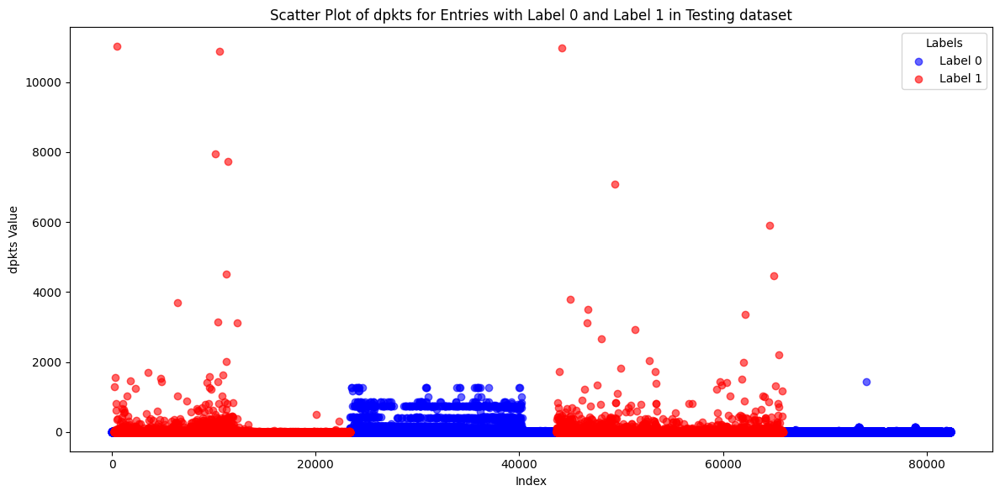

In [ ]:
# Create a scatter plot for spkts where label is 0 and label is 1
plt.figure(figsize=(12, 6))

# Filter the data where label is 0
subset_0 = test[test['label'] == 0]
# Filter the data where label is 1
subset_1 = test[test['label'] == 1]

# Scatter plot of spkts for entries where label is 0
plt.scatter(subset_0.index, subset_0['dpkts'], color='blue', alpha=0.6, label='Label 0')

# Scatter plot of spkts for entries where label is 1
plt.scatter(subset_1.index, subset_1['dpkts'], color='red', alpha=0.6, label='Label 1')

# Add title and labels
plt.title('Scatter Plot of dpkts for Entries with Label 0 and Label 1 in Testing dataset')
plt.xlabel('Index')
plt.ylabel('dpkts Value')
plt.legend(title='Labels')
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
# Calculate mean, min, and max for sload and dload grouped by label
summary_stats_train = train.groupby('label')[['sload', 'dload']].agg(['mean', 'min', 'max']).reset_index()
summary_stats_test = test.groupby('label')[['sload', 'dload']].agg(['mean', 'min', 'max']).reset_index()

# Display the results
print("Training Dataset Summary (sload and dload):")
print(summary_stats_train)

print("\nTesting Dataset Summary (sload and dload):")
print(summary_stats_test)

print()


# Display the results as tables
print("Training Dataset Summary (sload and dload):\n")

print(summary_stats_train.to_markdown(index=False))

print("\nTesting Dataset Summary (sload and dload):\n")

print(summary_stats_test.to_markdown(index=False))

Training Dataset Summary (sload and dload):
  label         sload                            dload                  
                 mean  min           max          mean  min          max
0     0  2.317070e+07  0.0  5.344000e+09  2.062949e+06  0.0  22422730.00
1     1  9.704916e+07  0.0  5.988000e+09  1.813877e+04  0.0   2447663.25

Testing Dataset Summary (sload and dload):
  label         sload                            dload                 
                 mean  min           max          mean  min         max
0     0  3.975339e+07  0.0  4.368000e+09  1.373613e+06  0.0  20821108.0
1     1  8.478722e+07  0.0  5.268000e+09  2.405574e+04  0.0   2317180.0

Training Dataset Summary (sload and dload):

|   ('label', '') |   ('sload', 'mean') |   ('sload', 'min') |   ('sload', 'max') |   ('dload', 'mean') |   ('dload', 'min') |   ('dload', 'max') |
|----------------:|--------------------:|-------------------:|-------------------:|--------------------:|-------------------:|------------

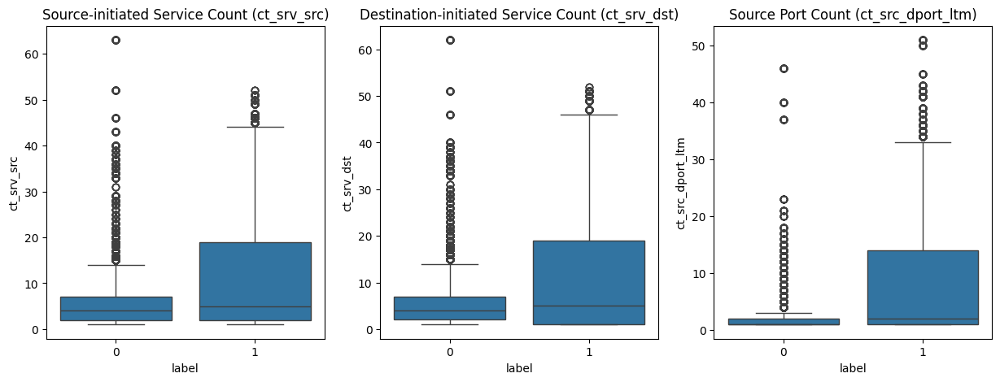

In [ ]:
# Box plots for ct_srv_src, ct_srv_dst, and ct_src_dport_ltm grouped by label
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
sns.boxplot(x='label', y='ct_srv_src', data=train)
plt.title('Source-initiated Service Count (ct_srv_src)')

plt.subplot(1, 3, 2)
sns.boxplot(x='label', y='ct_srv_dst', data=train)
plt.title('Destination-initiated Service Count (ct_srv_dst)')

plt.subplot(1, 3, 3)
sns.boxplot(x='label', y='ct_src_dport_ltm', data=train)
plt.title('Source Port Count (ct_src_dport_ltm)')
plt.show()


Data Engineering

In [ ]:
# Concatenate training and testing datasets
data = pd.concat([train,test], ignore_index=True)

print("Shape of combined dataset:", data.shape)
print("Columns in dataset:", data.columns)

Shape of combined dataset: (257673, 45)
Columns in dataset: Index(['id', 'dur', 'proto', 'service', 'state', 'spkts', 'dpkts', 'sbytes',
       'dbytes', 'rate', 'sttl', 'dttl', 'sload', 'dload', 'sloss', 'dloss',
       'sinpkt', 'dinpkt', 'sjit', 'djit', 'swin', 'stcpb', 'dtcpb', 'dwin',
       'tcprtt', 'synack', 'ackdat', 'smean', 'dmean', 'trans_depth',
       'response_body_len', 'ct_srv_src', 'ct_state_ttl', 'ct_dst_ltm',
       'ct_src_dport_ltm', 'ct_dst_sport_ltm', 'ct_dst_src_ltm',
       'is_ftp_login', 'ct_ftp_cmd', 'ct_flw_http_mthd', 'ct_src_ltm',
       'ct_srv_dst', 'is_sm_ips_ports', 'attack_cat', 'label'],
      dtype='object')


In [ ]:
# Identify categorical columns
categorical_columns = data.select_dtypes(include=['object']).columns
print("Ctegorical Columns:", categorical_columns)



Ctegorical Columns: Index(['proto', 'service', 'state', 'attack_cat'], dtype='object')


In [ ]:
from sklearn.preprocessing import OneHotEncoder, StandardScaler

# Identify categorical and numerical columns
categorical_columns = [col for col in data.columns if data[col].dtype == 'object']
numerical_columns = [col for col in data.columns if data[col].dtype in ['int64', 'float64'] and col not in ['id', 'label']]

# One-Hot Encode Categorical Features
one_hot_encoder = OneHotEncoder(sparse_output=False)
one_hot_encoded = pd.DataFrame(
    one_hot_encoder.fit_transform(train[categorical_columns]),
    columns=one_hot_encoder.get_feature_names_out(categorical_columns)
)



# Concatenate One-Hot Encoded Variables with Numerical Columns
train_with_raw_numerical = pd.concat([train.drop(columns=categorical_columns), one_hot_encoded], axis=1)



# Standardize Numerical Features
scaler = StandardScaler()
train_standardized_numerical = scaler.fit_transform(train[numerical_columns])
train_standardized_numerical_df = pd.DataFrame(train_standardized_numerical, columns=numerical_columns)

# Combine Standardized Numerical Features and Encoded Categorical Features
train_standardized = pd.concat([train_standardized_numerical_df, one_hot_encoded, train[['id', 'label']]], axis=1)




# Check the shape and columns of both datasets
print("Train dataset with raw numerical features (data):", train_with_raw_numerical.shape)
print("Train dataset with standardized numerical features (data_standardized):", train_standardized.shape)


Train dataset with raw numerical features (data): (175341, 206)
Train dataset with standardized numerical features (data_standardized): (175341, 206)


In [ ]:


# When initializing the OneHotEncoder
one_hot_encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')

# Fit the encoder on the training data
one_hot_encoder.fit(train[categorical_columns])

# Transform the test data
test_one_hot_encoded = pd.DataFrame(
    one_hot_encoder.transform(test[categorical_columns]),
    columns=one_hot_encoder.get_feature_names_out(categorical_columns)
)


# Concatenate One-Hot Encoded Variables with Numerical Columns
test_with_raw_numerical = pd.concat([test.drop(columns=categorical_columns), test_one_hot_encoded], axis=1)

# Use the fitted StandardScaler to transform test data
test_standardized_numerical = scaler.transform(test[numerical_columns])
test_standardized_numerical_df = pd.DataFrame(test_standardized_numerical, columns=numerical_columns)

# Combine Standardized Numerical Features and Encoded Categorical Features for test data
test_standardized = pd.concat([test_standardized_numerical_df, test_one_hot_encoded, test[['id','label']]], axis=1)

# Check the shape and columns of test datasets
print("Test dataset with raw numerical features:", test_with_raw_numerical.shape)
print("Test dataset with standardized numerical features:", test_standardized.shape)

Test dataset with raw numerical features: (82332, 206)
Test dataset with standardized numerical features: (82332, 206)


In [ ]:
print(train_with_raw_numerical.columns)
print(train_with_raw_numerical.head())
print(train_standardized.columns)
print(train_standardized.head())
print(_*50)
print(test_with_raw_numerical.columns)
print(test_with_raw_numerical.head())
print(test_standardized.columns)
print(test_standardized.head())

Index(['id', 'dur', 'spkts', 'dpkts', 'sbytes', 'dbytes', 'rate', 'sttl',
       'dttl', 'sload',
       ...
       'attack_cat_Analysis', 'attack_cat_Backdoor', 'attack_cat_DoS',
       'attack_cat_Exploits', 'attack_cat_Fuzzers', 'attack_cat_Generic',
       'attack_cat_Normal', 'attack_cat_Reconnaissance',
       'attack_cat_Shellcode', 'attack_cat_Worms'],
      dtype='object', length=206)
   id       dur  spkts  dpkts  sbytes  dbytes       rate  sttl  dttl  \
0   1  0.121478      6      4     258     172  74.087490   252   254   
1   2  0.649902     14     38     734   42014  78.473372    62   252   
2   3  1.623129      8     16     364   13186  14.170161    62   252   
3   4  1.681642     12     12     628     770  13.677108    62   252   
4   5  0.449454     10      6     534     268  33.373826   254   252   

          sload  ...  attack_cat_Analysis  attack_cat_Backdoor  \
0  14158.942380  ...                  0.0                  0.0   
1   8395.112305  ...                  

Outlier Analysis

In [ ]:
# Calculate the Z-scores for numerical columns in the training data
train_z_scores = np.abs(scaler.transform(train[numerical_columns]))

# Count the number of outliers for each feature in the training data
train_outlier_counts = (train_z_scores > 3).sum(axis=0)
train_outlier_summary = pd.DataFrame({
    'Feature': numerical_columns,
    'Outliers': train_outlier_counts,
    'Total Instances': len(train),
    'Percentage Outliers': (train_outlier_counts / len(train)) * 100
})

print("Training Data Outlier Summary (Z-Score):")
print(train_outlier_summary.sort_values(by='Outliers', ascending=False))
print(train_outlier_summary.sort_values(by='Outliers', ascending=False).to_markdown(index=False))


Training Data Outlier Summary (Z-Score):
              Feature  Outliers  Total Instances  Percentage Outliers
30   ct_src_dport_ltm      6203           175341             3.537678
36         ct_src_ltm      5947           175341             3.391677
29         ct_dst_ltm      5924           175341             3.378559
23              smean      5811           175341             3.314114
9               dload      5497           175341             3.135034
24              dmean      4745           175341             2.706155
8               sload      3359           175341             1.915696
5                rate      3204           175341             1.827297
0                 dur      3132           175341             1.786234
38    is_sm_ips_ports      2762           175341             1.575216
12             sinpkt      2654           175341             1.513622
33       is_ftp_login      2567           175341             1.464004
34         ct_ftp_cmd      2567           175341 

In [ ]:
# Calculate the Z-scores for numerical columns in the test data
test_z_scores = np.abs(scaler.transform(test[numerical_columns]))

# Count the number of outliers for each feature in the test data
test_outlier_counts = (test_z_scores > 3).sum(axis=0)
test_outlier_summary = pd.DataFrame({
    'Feature': numerical_columns,
    'Outliers': test_outlier_counts,
    'Total Instances': len(test),
    'Percentage Outliers': (test_outlier_counts / len(test)) * 100
})

print("Test Data Outlier Summary (Z-Score):")
print(test_outlier_summary.sort_values(by='Outliers', ascending=False))
print(test_outlier_summary.sort_values(by='Outliers', ascending=False).to_markdown(index=False))

Test Data Outlier Summary (Z-Score):
              Feature  Outliers  Total Instances  Percentage Outliers
31   ct_dst_sport_ltm      3195            82332             3.880630
23              smean      2878            82332             3.495603
9               dload      2702            82332             3.281835
30   ct_src_dport_ltm      2655            82332             3.224749
29         ct_dst_ltm      2644            82332             3.211388
36         ct_src_ltm      2565            82332             3.115435
32     ct_dst_src_ltm      2372            82332             2.881018
27         ct_srv_src      2357            82332             2.862799
37         ct_srv_dst      2333            82332             2.833649
24              dmean      2331            82332             2.831220
21             synack      1824            82332             2.215420
28       ct_state_ttl      1805            82332             2.192343
20             tcprtt      1618            82332     

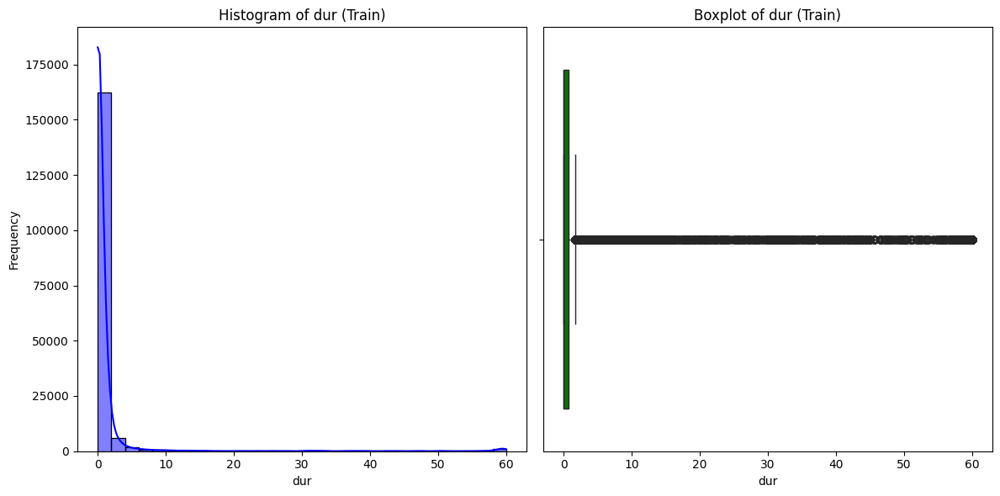

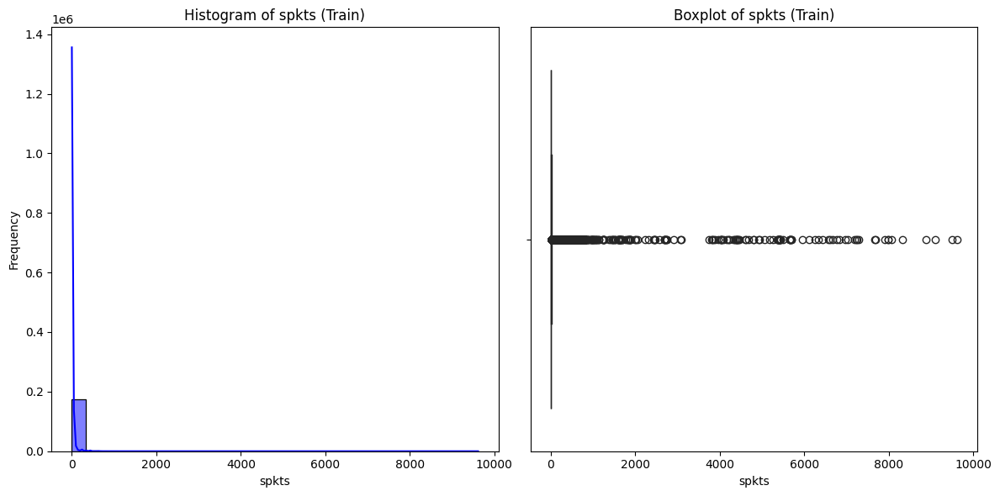

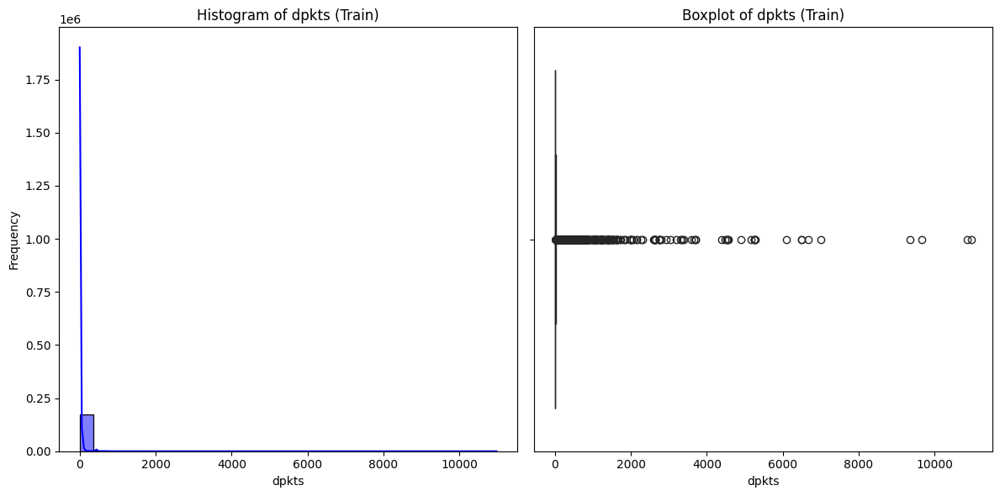

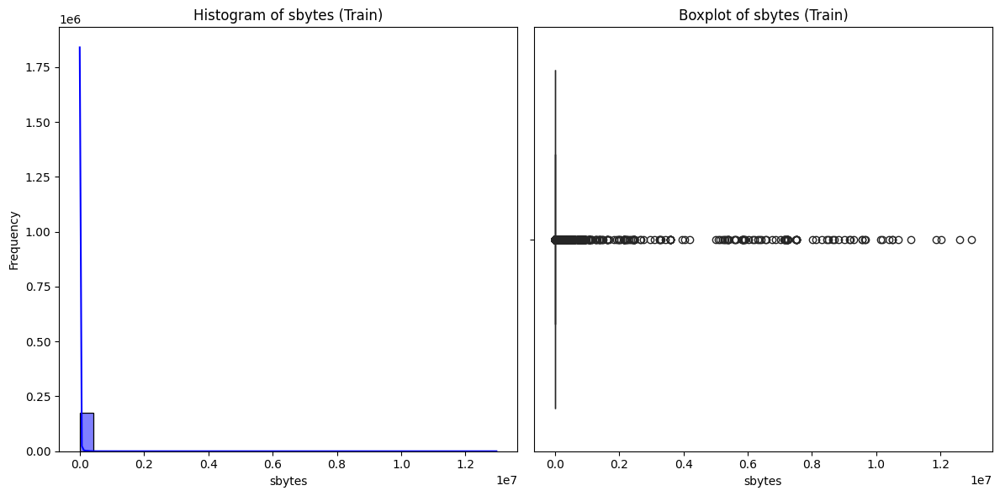

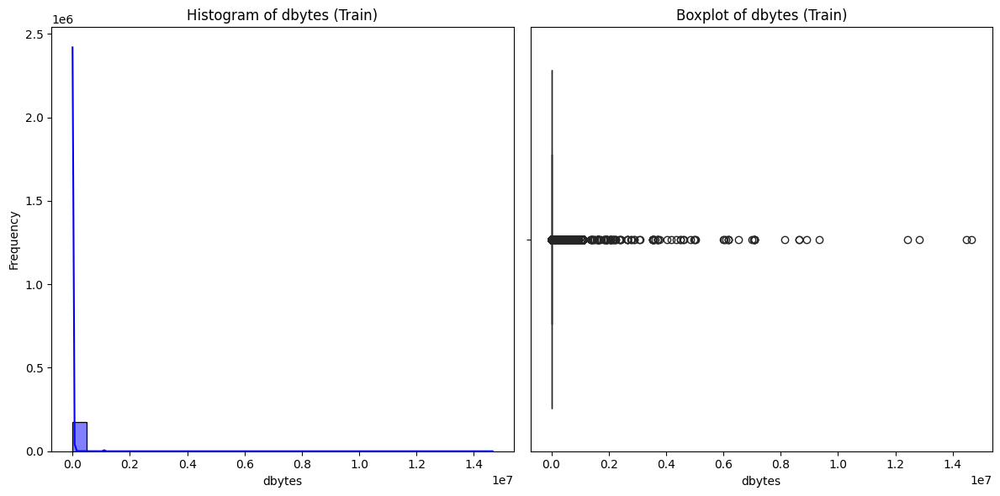

...

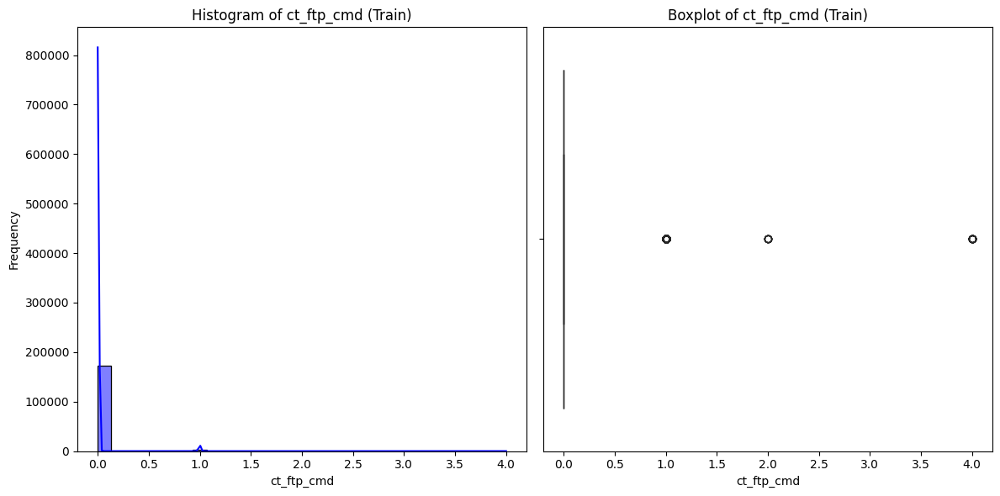

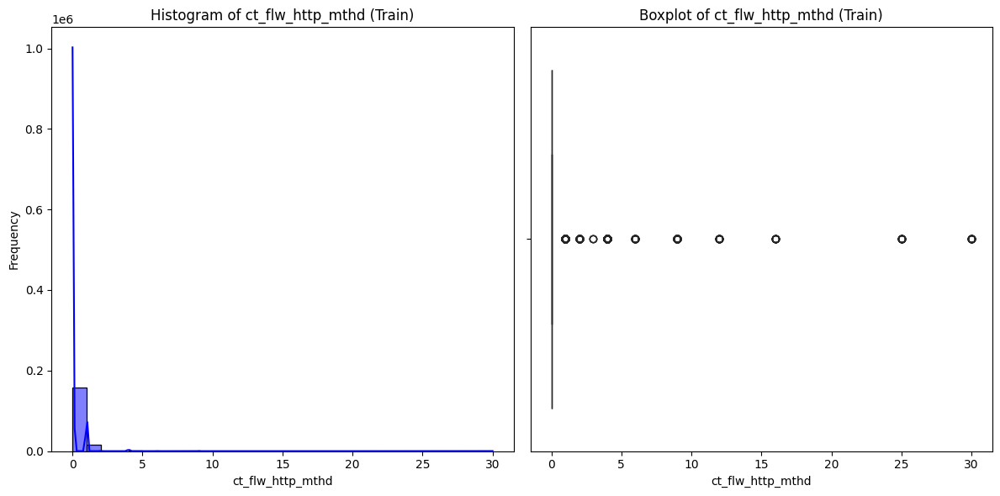

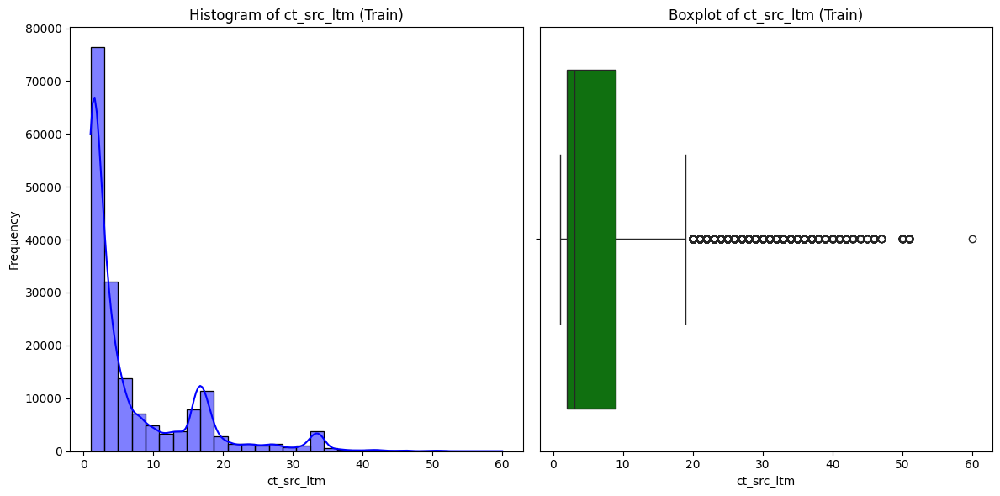

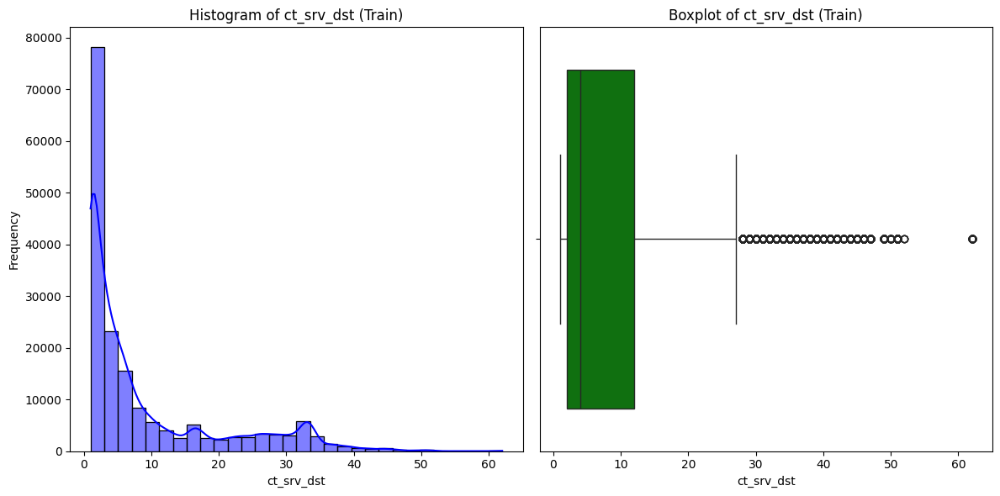

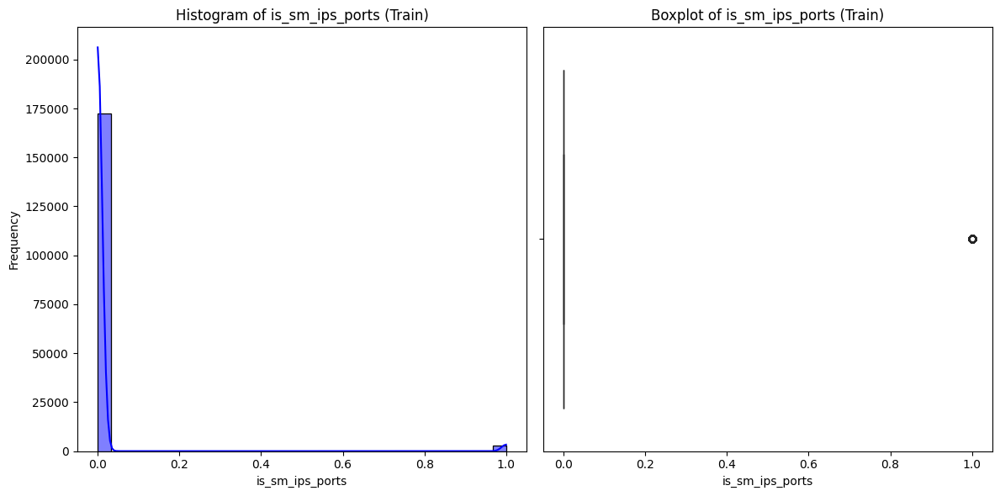

In [ ]:
# Iterate through numerical features for training data
for col in numerical_columns:
    plt.figure(figsize=(12, 6))

    # Histogram
    plt.subplot(1, 2, 1)
    sns.histplot(train[col], kde=True, bins=30, color='blue')
    plt.title(f"Histogram of {col} (Train)")
    plt.xlabel(col)
    plt.ylabel("Frequency")

    # Boxplot
    plt.subplot(1, 2, 2)
    sns.boxplot(x=train[col], color='green')
    plt.title(f"Boxplot of {col} (Train)")

    plt.tight_layout()
    plt.show()

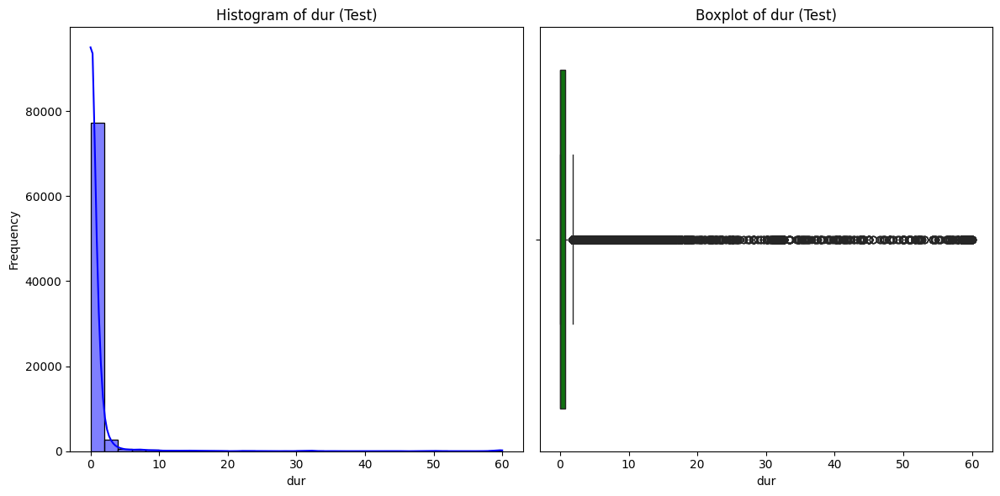

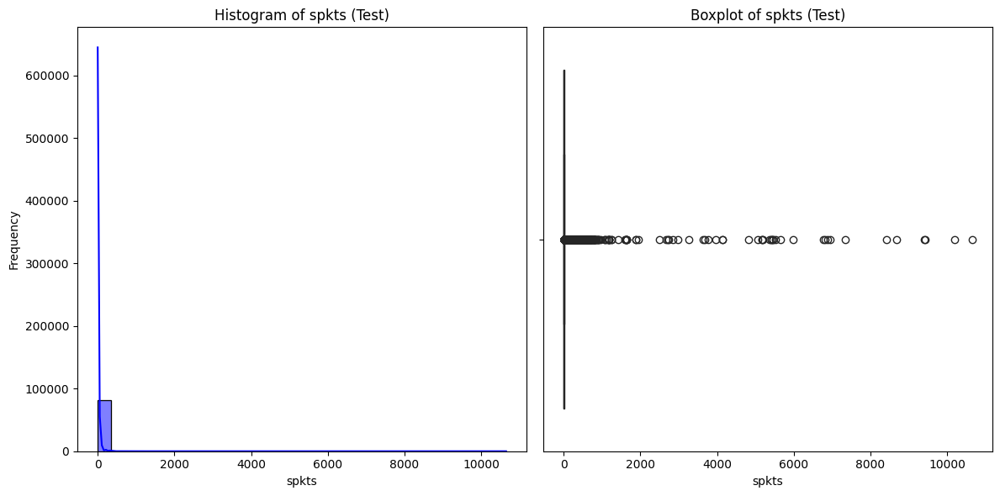

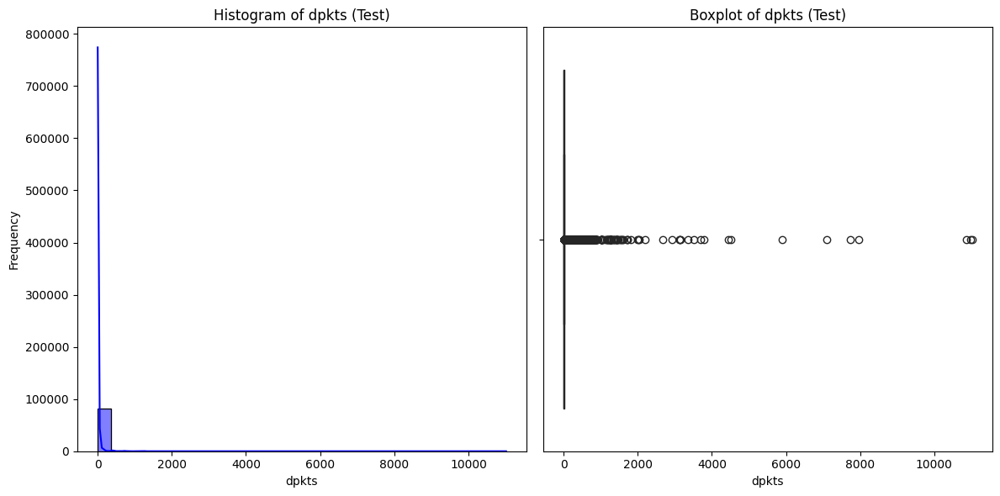

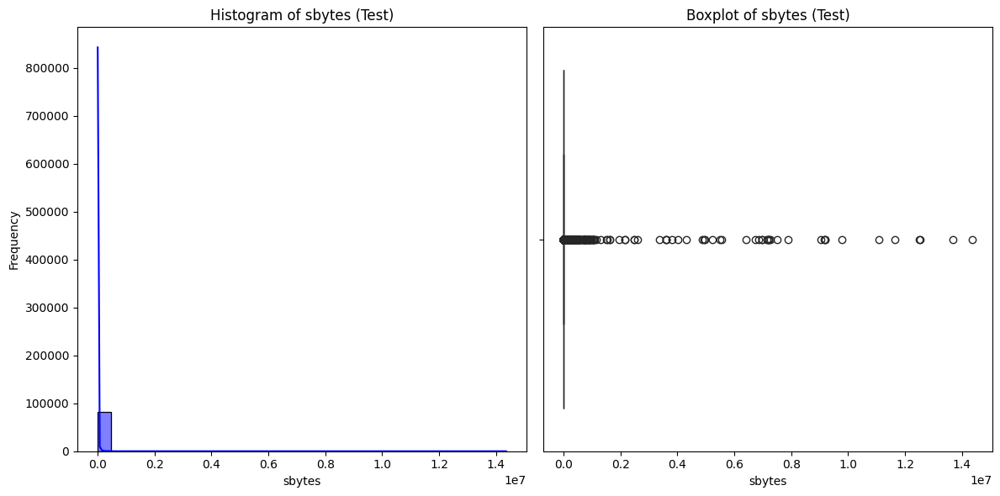

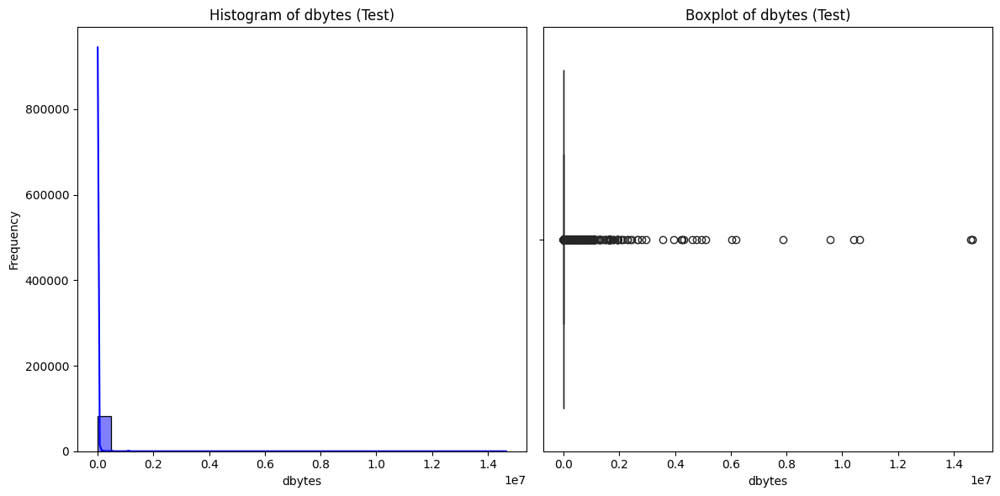

...

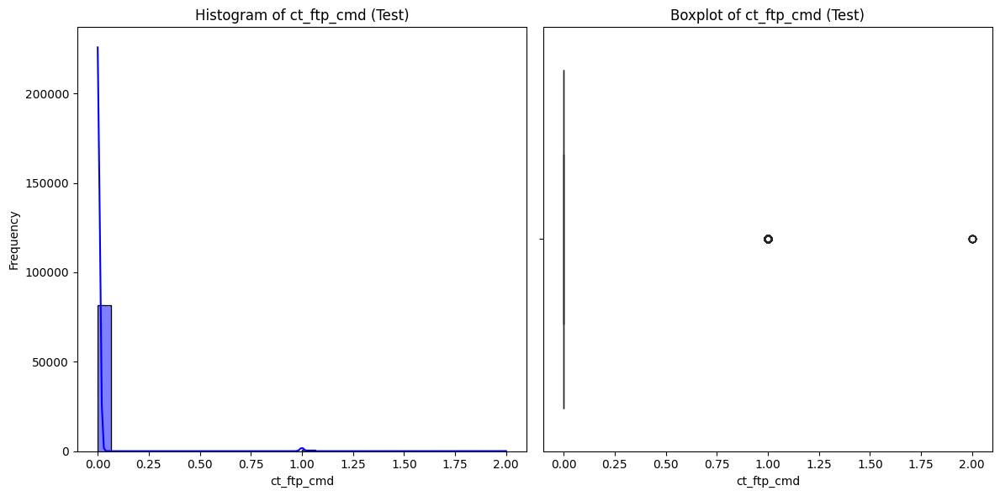

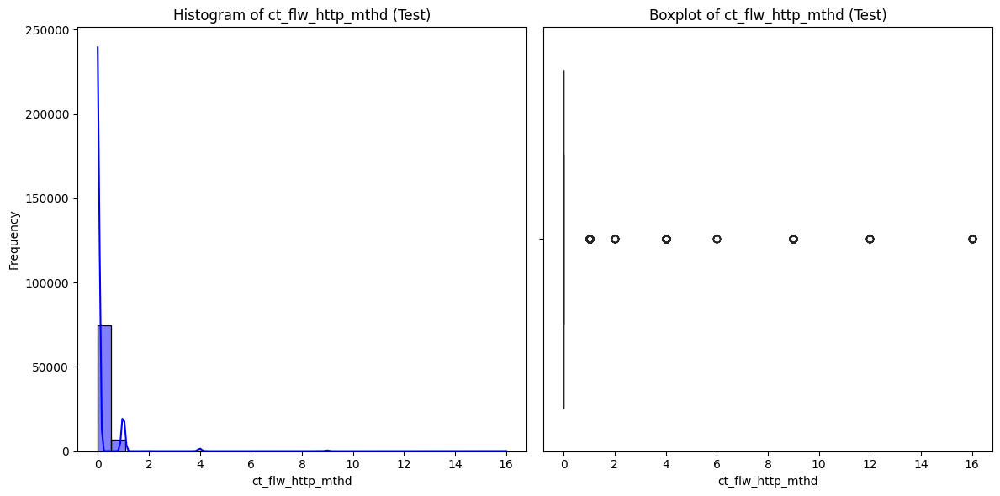

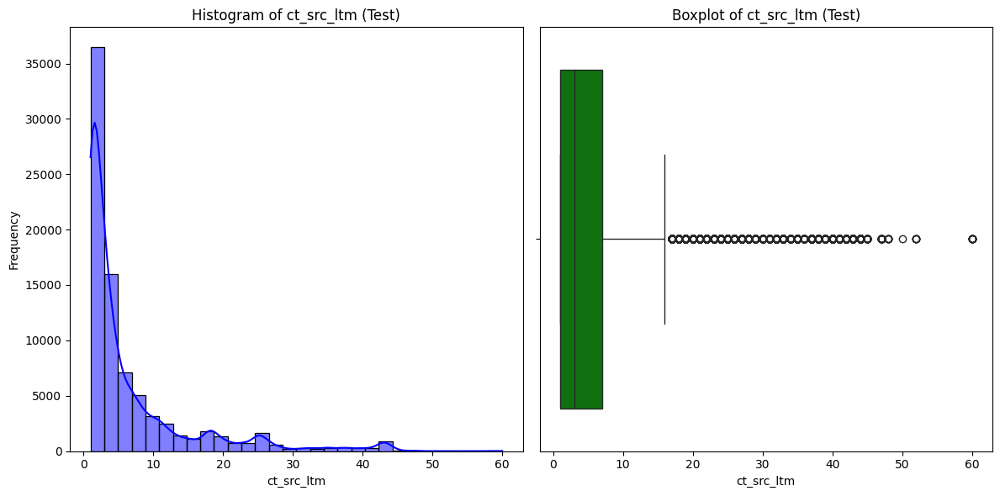

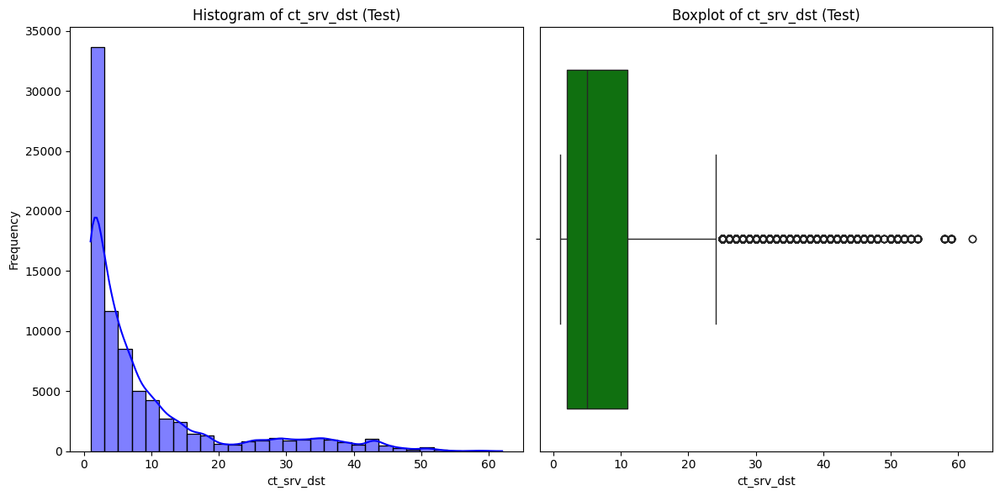

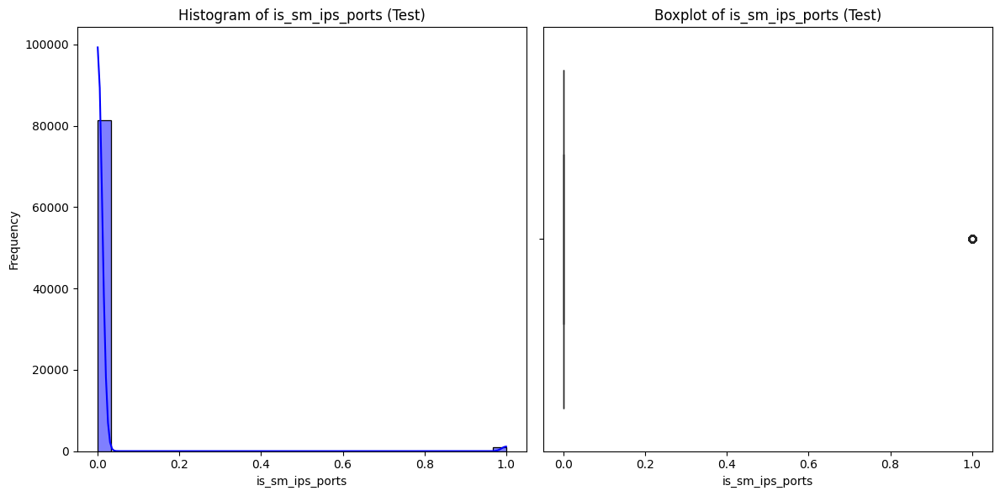

In [ ]:
# Iterate through numerical features for test data
for col in numerical_columns:
    plt.figure(figsize=(12, 6))

    # Histogram
    plt.subplot(1, 2, 1)
    sns.histplot(test[col], kde=True, bins=30, color='blue')
    plt.title(f"Histogram of {col} (Test)")
    plt.xlabel(col)
    plt.ylabel("Frequency")

    # Boxplot
    plt.subplot(1, 2, 2)
    sns.boxplot(x=test[col], color='green')
    plt.title(f"Boxplot of {col} (Test)")

    plt.tight_layout()
    plt.show()

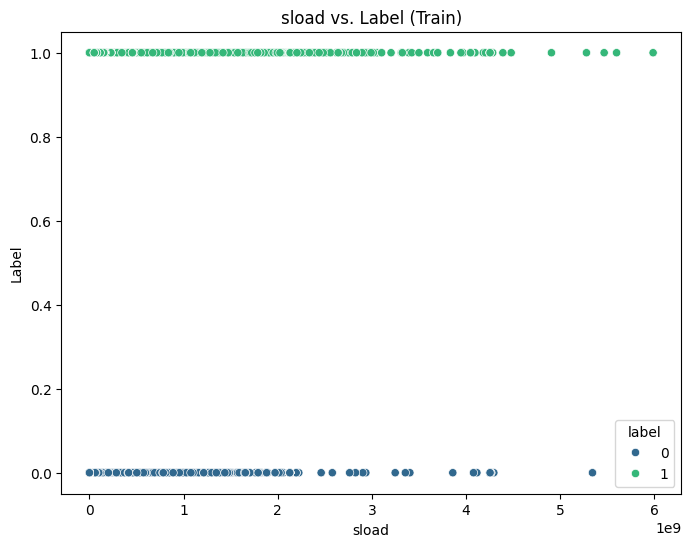

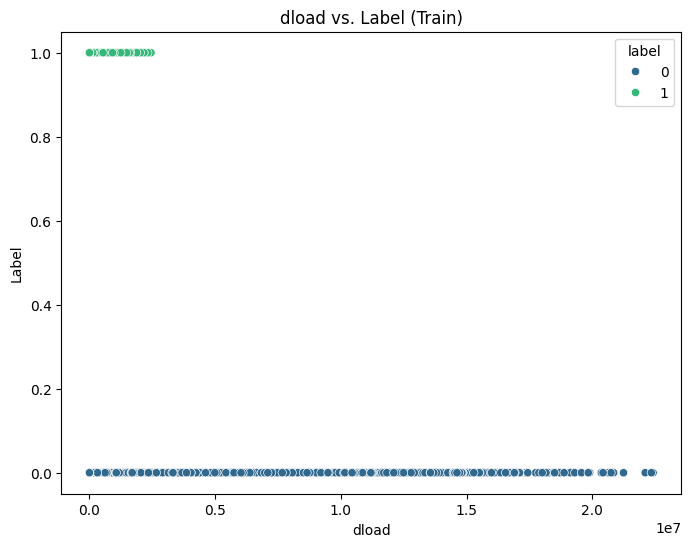

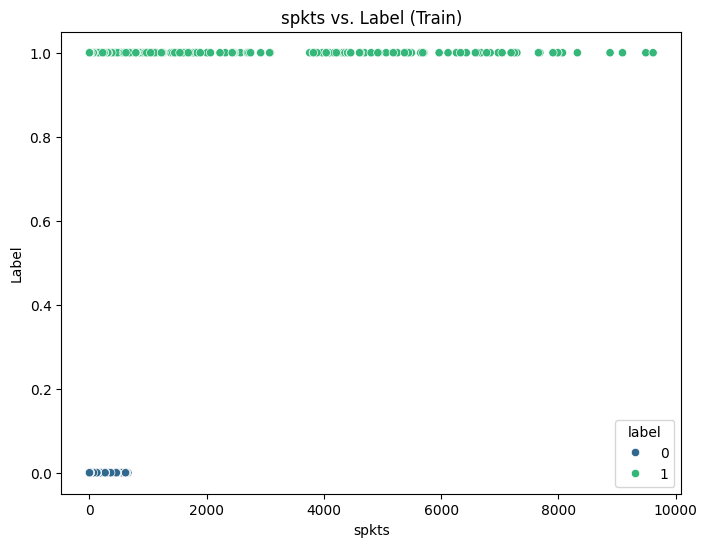

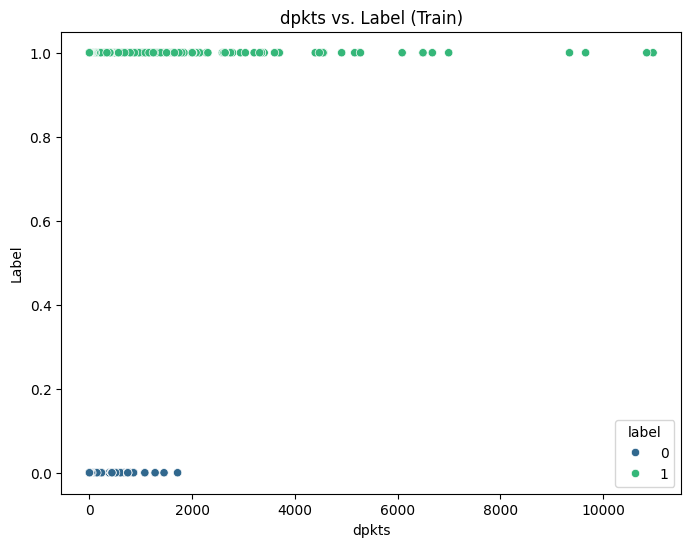

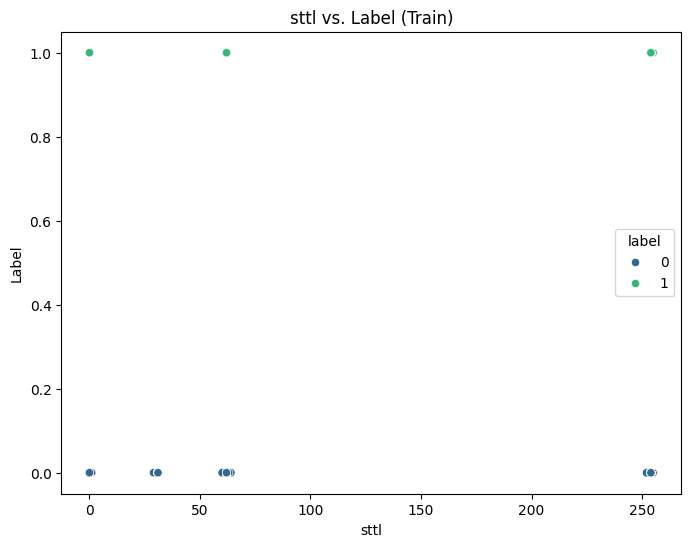

In [ ]:
# Pairwise scatter plots for key numerical features against the target label (Training data)
top_features = ['sload', 'dload', 'spkts', 'dpkts', 'sttl']

for col in top_features:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=train[col], y=train['label'], hue=train['label'], palette='viridis')
    plt.title(f"{col} vs. Label (Train)")
    plt.xlabel(col)
    plt.ylabel("Label")
    plt.show()


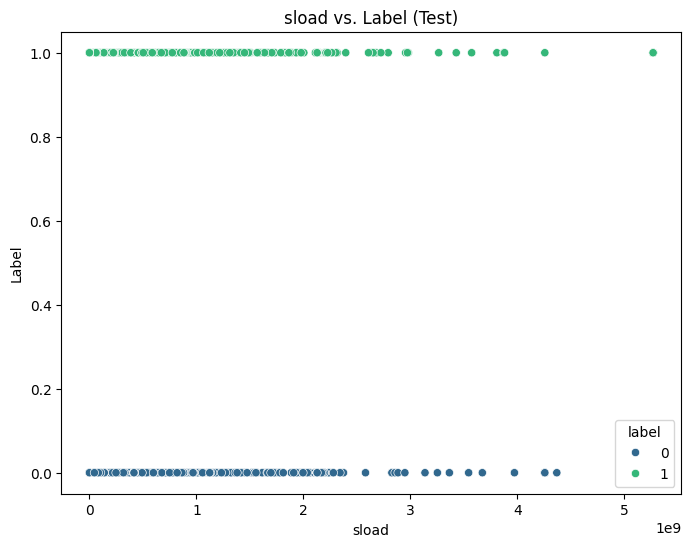

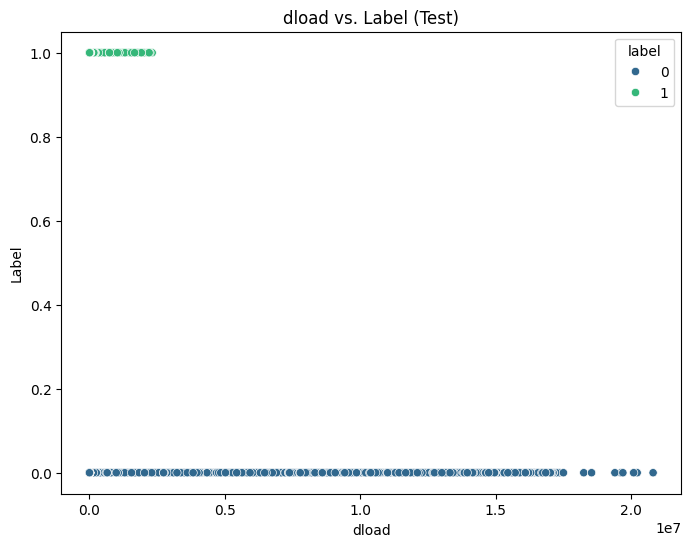

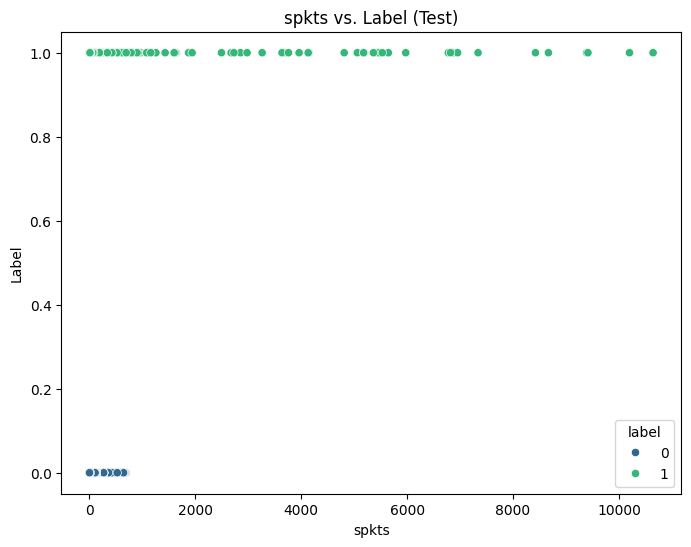

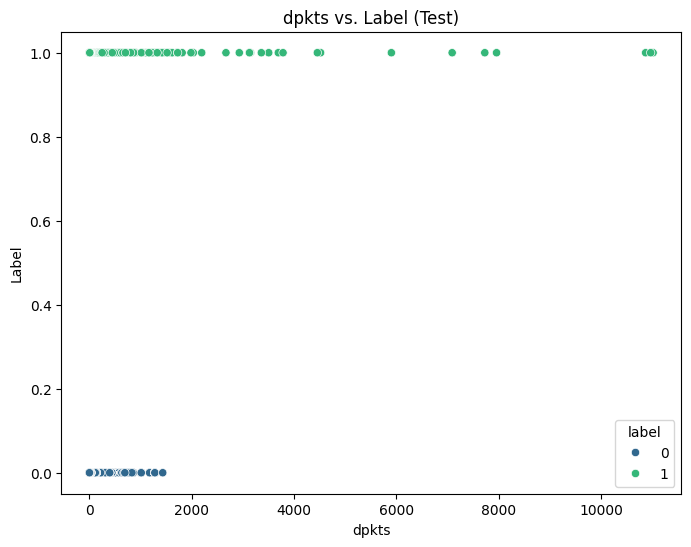

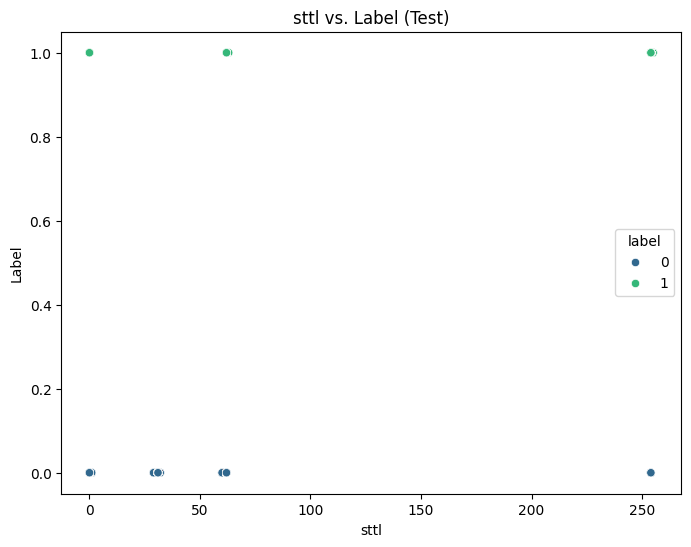

In [ ]:
# Pairwise scatter plots for key numerical features against the target label (Test data)
top_features = ['sload', 'dload', 'spkts', 'dpkts', 'sttl']

for col in top_features:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=test[col], y=test['label'], hue=test['label'], palette='viridis')
    plt.title(f"{col} vs. Label (Test)")
    plt.xlabel(col)
    plt.ylabel("Label")
    plt.show()

Normality Test

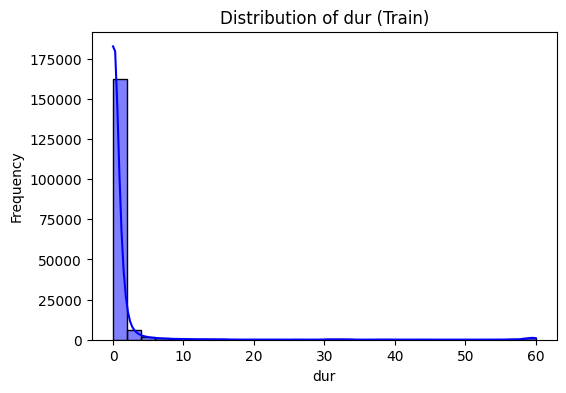

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: dur (Train)
Shapiro-Wilk Test: Statistic=0.19293740468361764, p-value=1.9306935901550692e-192
D'Agostino and Pearson Test: Statistic=225786.06455500142, p-value=0.0
--------------------------------------------------


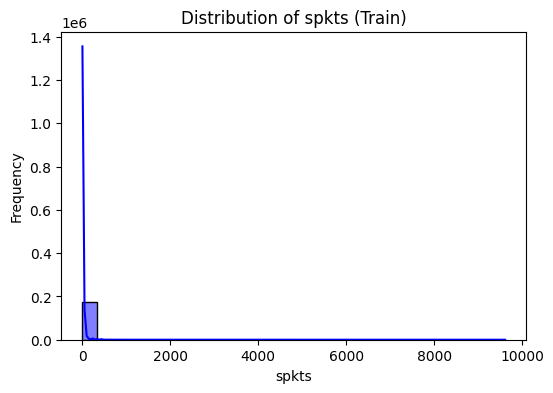

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: spkts (Train)
Shapiro-Wilk Test: Statistic=0.0714472832701073, p-value=1.4718196542078284e-197
D'Agostino and Pearson Test: Statistic=507881.19958910666, p-value=0.0
--------------------------------------------------


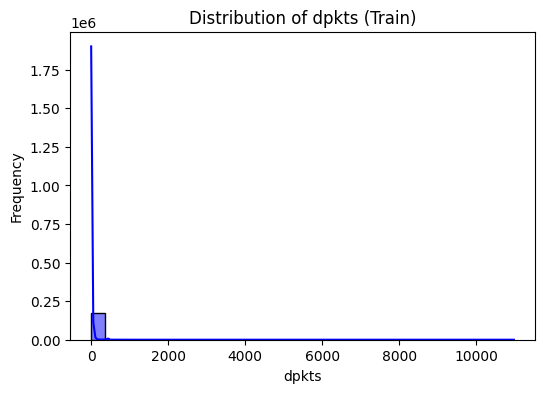

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: dpkts (Train)
Shapiro-Wilk Test: Statistic=0.11950727961771102, p-value=1.3046736049639959e-195
D'Agostino and Pearson Test: Statistic=493351.261265638, p-value=0.0
--------------------------------------------------


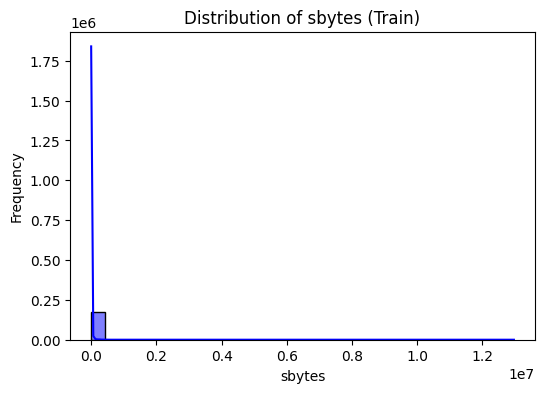

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: sbytes (Train)
Shapiro-Wilk Test: Statistic=0.020291417403341616, p-value=1.5582833452474136e-199
D'Agostino and Pearson Test: Statistic=530455.8576696803, p-value=0.0
--------------------------------------------------


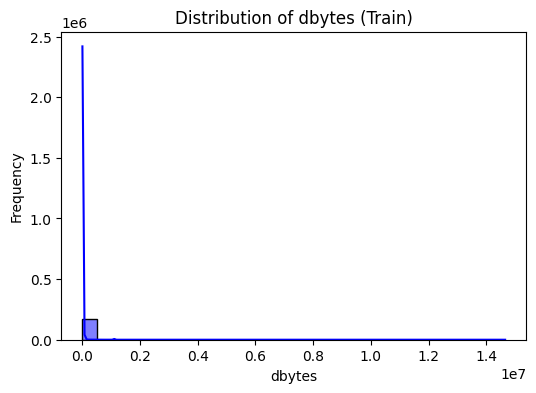

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: dbytes (Train)
Shapiro-Wilk Test: Statistic=0.06926821483810841, p-value=1.2070605404953218e-197
D'Agostino and Pearson Test: Statistic=507809.0135596351, p-value=0.0
--------------------------------------------------


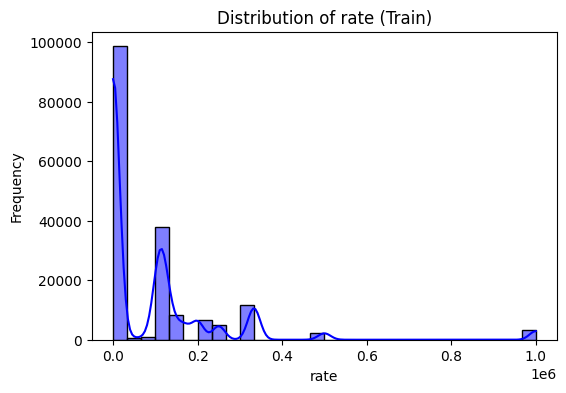

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: rate (Train)
Shapiro-Wilk Test: Statistic=0.5950769347445992, p-value=2.9554089904028493e-168
D'Agostino and Pearson Test: Statistic=123330.78122645033, p-value=0.0
--------------------------------------------------


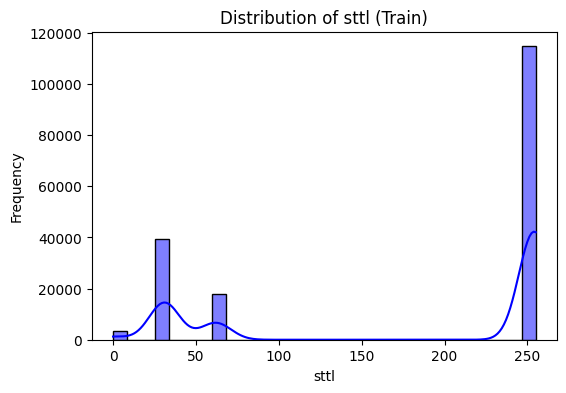

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: sttl (Train)
Shapiro-Wilk Test: Statistic=0.6328135414837688, p-value=5.862816846212402e-165
D'Agostino and Pearson Test: Statistic=1060233.050795505, p-value=0.0
--------------------------------------------------


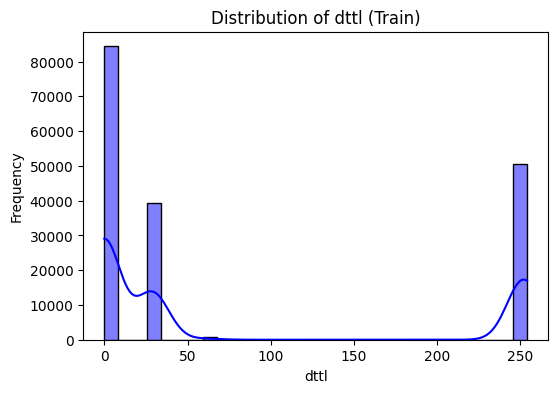

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: dttl (Train)
Shapiro-Wilk Test: Statistic=0.6317091847123028, p-value=4.649123690113038e-165
D'Agostino and Pearson Test: Statistic=120037.93462923318, p-value=0.0
--------------------------------------------------


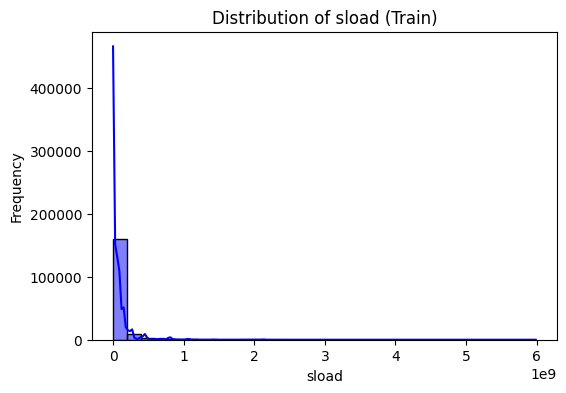

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: sload (Train)
Shapiro-Wilk Test: Statistic=0.3809780629648968, p-value=6.045676135347865e-183
D'Agostino and Pearson Test: Statistic=254404.79194213485, p-value=0.0
--------------------------------------------------


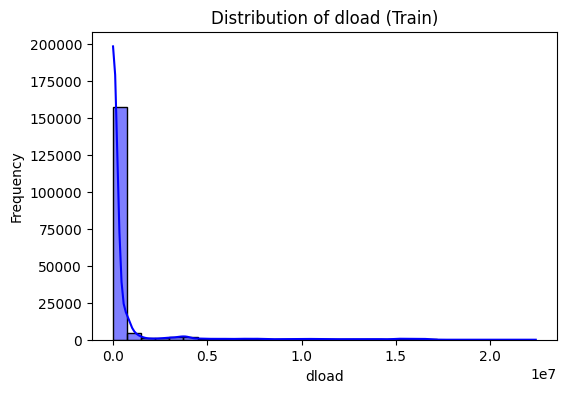

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: dload (Train)
Shapiro-Wilk Test: Statistic=0.3055649617443925, p-value=4.966095143414346e-187
D'Agostino and Pearson Test: Statistic=161698.46689280908, p-value=0.0
--------------------------------------------------


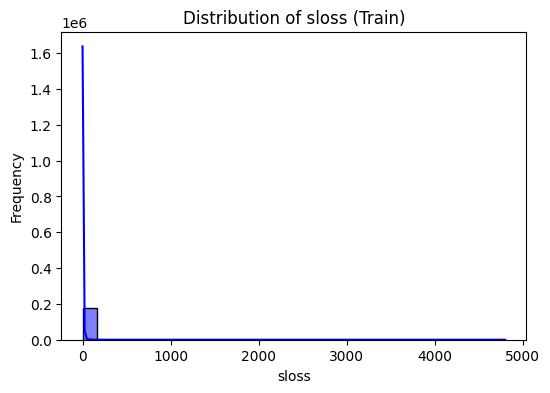

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: sloss (Train)
Shapiro-Wilk Test: Statistic=0.0300861276892036, p-value=3.660008661790808e-199
D'Agostino and Pearson Test: Statistic=528122.4394235444, p-value=0.0
--------------------------------------------------


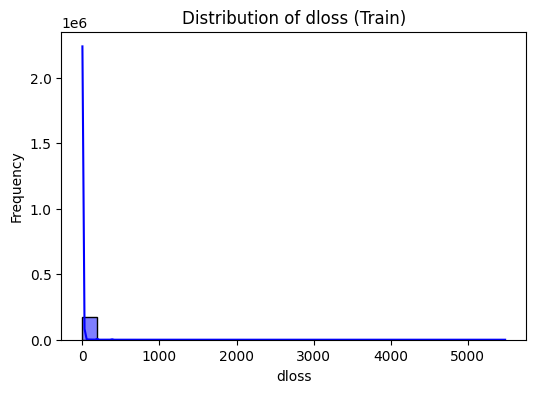

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: dloss (Train)
Shapiro-Wilk Test: Statistic=0.08728444171350691, p-value=6.300321156223529e-197
D'Agostino and Pearson Test: Statistic=515370.0705362665, p-value=0.0
--------------------------------------------------


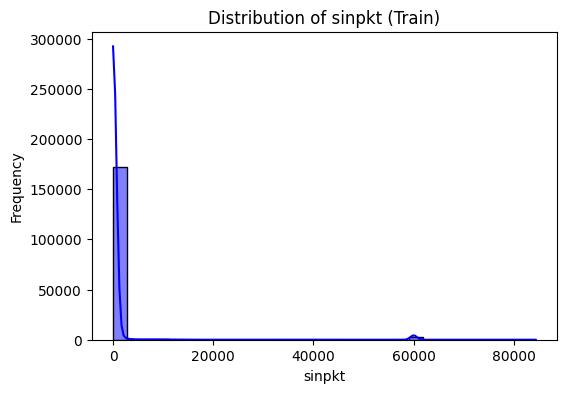

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: sinpkt (Train)
Shapiro-Wilk Test: Statistic=0.11181636040308374, p-value=6.272646738676876e-196
D'Agostino and Pearson Test: Statistic=232690.46228101023, p-value=0.0
--------------------------------------------------


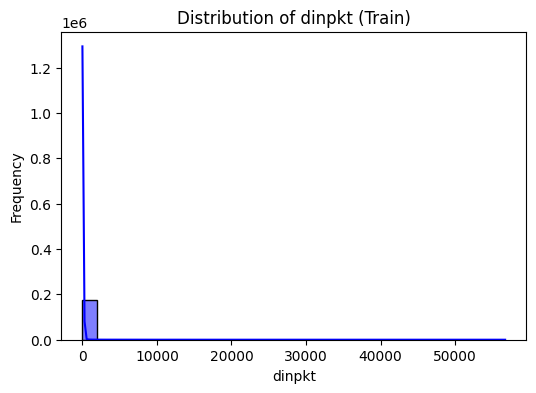

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: dinpkt (Train)
Shapiro-Wilk Test: Statistic=0.04902006326732289, p-value=1.9501261768660377e-198
D'Agostino and Pearson Test: Statistic=451765.30414178915, p-value=0.0
--------------------------------------------------


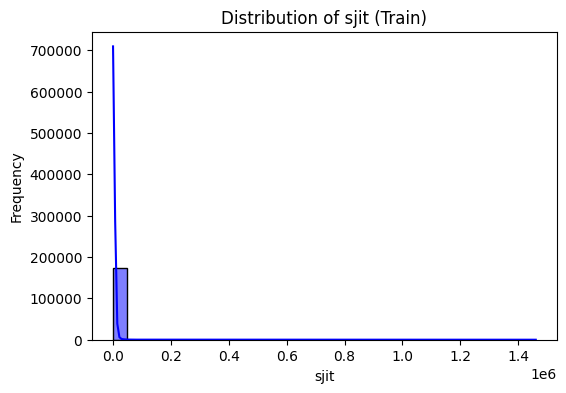

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: sjit (Train)
Shapiro-Wilk Test: Statistic=0.07040842223478727, p-value=1.3389729912839076e-197
D'Agostino and Pearson Test: Statistic=359873.19179395976, p-value=0.0
--------------------------------------------------


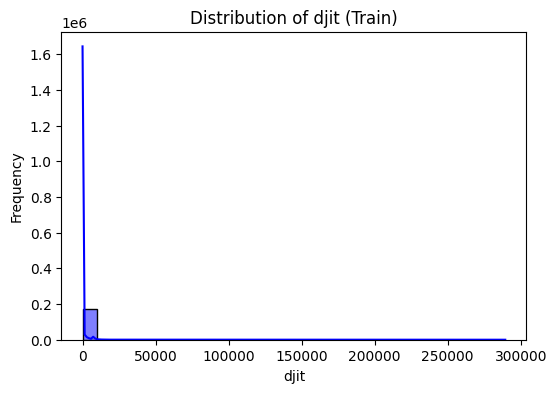

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: djit (Train)
Shapiro-Wilk Test: Statistic=0.1141449164891829, p-value=7.824958592791381e-196
D'Agostino and Pearson Test: Statistic=452022.4607156012, p-value=0.0
--------------------------------------------------


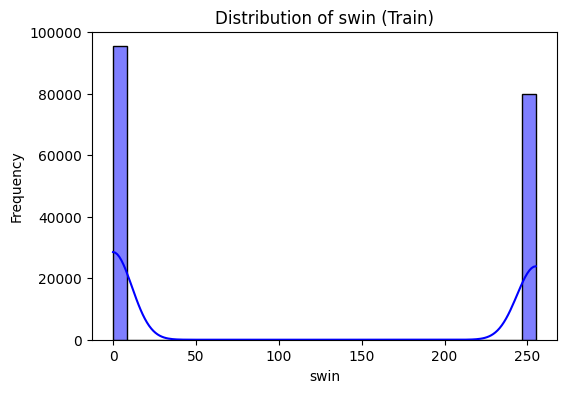

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: swin (Train)
Shapiro-Wilk Test: Statistic=0.6338165812194848, p-value=7.241618253198776e-165
D'Agostino and Pearson Test: Statistic=609101.2059128927, p-value=0.0
--------------------------------------------------


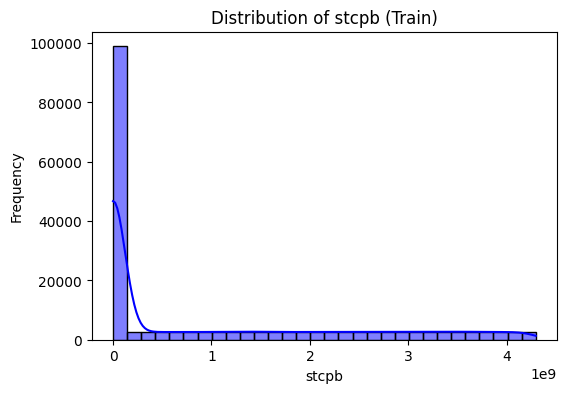

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: stcpb (Train)
Shapiro-Wilk Test: Statistic=0.7301557536160983, p-value=8.613240239067671e-155
D'Agostino and Pearson Test: Statistic=24327.974546944388, p-value=0.0
--------------------------------------------------


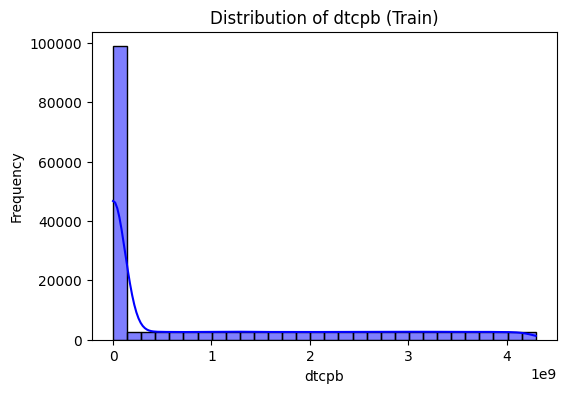

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: dtcpb (Train)
Shapiro-Wilk Test: Statistic=0.7305154680718537, p-value=9.516656492481597e-155
D'Agostino and Pearson Test: Statistic=24318.672932555728, p-value=0.0
--------------------------------------------------


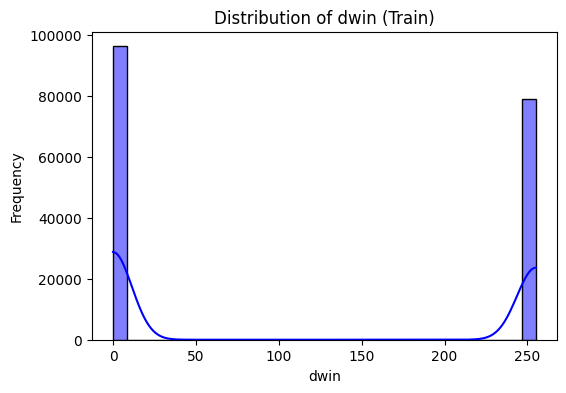

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: dwin (Train)
Shapiro-Wilk Test: Statistic=0.6331362399238127, p-value=6.274700038014482e-165
D'Agostino and Pearson Test: Statistic=611974.8924166865, p-value=0.0
--------------------------------------------------


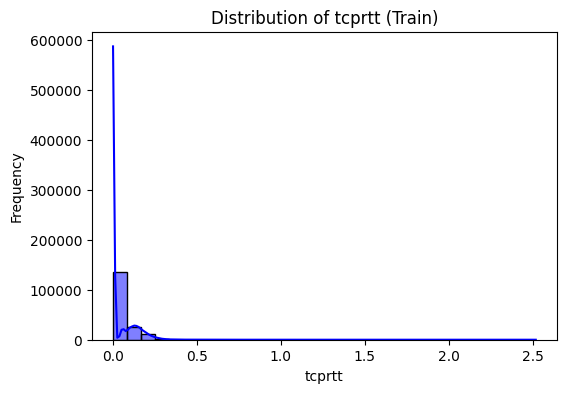

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: tcprtt (Train)
Shapiro-Wilk Test: Statistic=0.5731829500584571, p-value=4.808185267555553e-170
D'Agostino and Pearson Test: Statistic=161572.2321147316, p-value=0.0
--------------------------------------------------


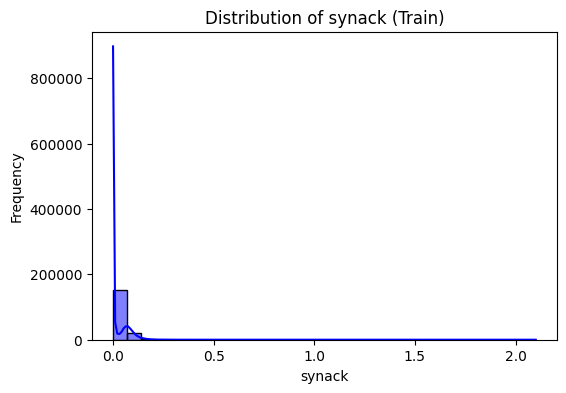

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: synack (Train)
Shapiro-Wilk Test: Statistic=0.53018653668843, p-value=2.4959314201754332e-173
D'Agostino and Pearson Test: Statistic=207986.29416996558, p-value=0.0
--------------------------------------------------


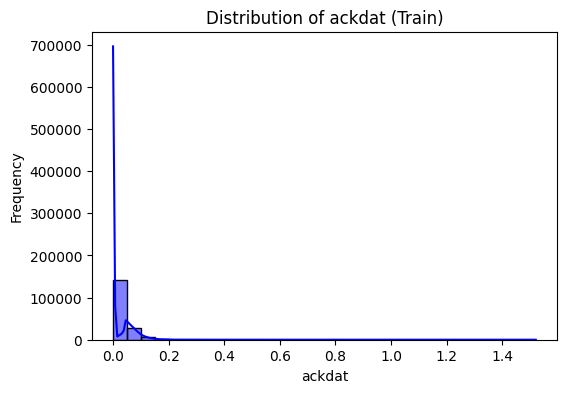

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: ackdat (Train)
Shapiro-Wilk Test: Statistic=0.5455599890810132, p-value=3.46281775281281e-172
D'Agostino and Pearson Test: Statistic=203708.27741144257, p-value=0.0
--------------------------------------------------


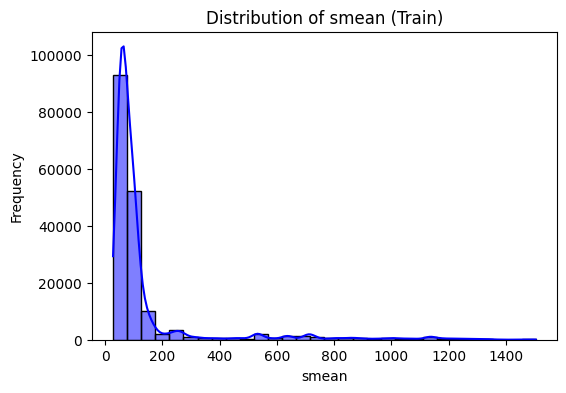

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: smean (Train)
Shapiro-Wilk Test: Statistic=0.43439907107721176, p-value=9.055560809975382e-180
D'Agostino and Pearson Test: Statistic=132783.4831861954, p-value=0.0
--------------------------------------------------


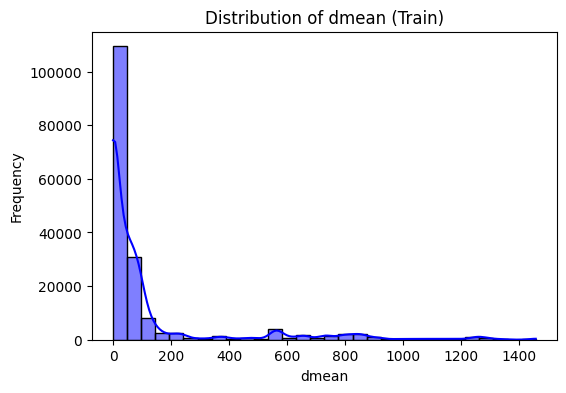

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: dmean (Train)
Shapiro-Wilk Test: Statistic=0.5282731033126995, p-value=1.808972245129257e-173
D'Agostino and Pearson Test: Statistic=100437.07085125388, p-value=0.0
--------------------------------------------------


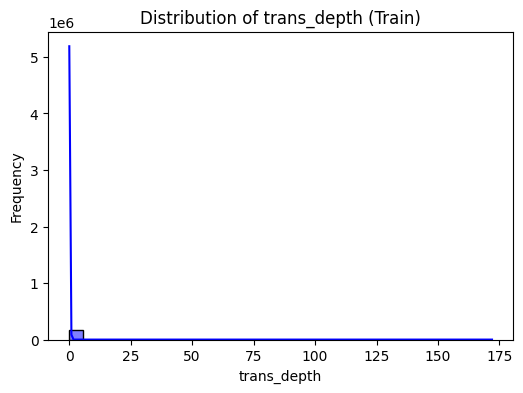

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: trans_depth (Train)
Shapiro-Wilk Test: Statistic=0.06339518211559392, p-value=7.087772700534383e-198
D'Agostino and Pearson Test: Statistic=814383.3716210172, p-value=0.0
--------------------------------------------------


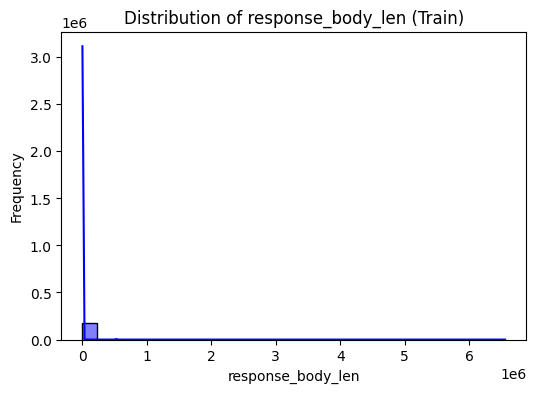

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: response_body_len (Train)
Shapiro-Wilk Test: Statistic=0.015835685515609987, p-value=1.0593997491927906e-199
D'Agostino and Pearson Test: Statistic=637524.2614031178, p-value=0.0
--------------------------------------------------


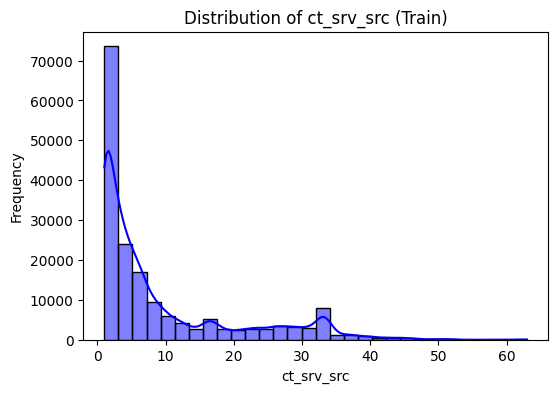

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: ct_srv_src (Train)
Shapiro-Wilk Test: Statistic=0.7584907035418683, p-value=3.2865187937946864e-151
D'Agostino and Pearson Test: Statistic=42156.305358376034, p-value=0.0
--------------------------------------------------


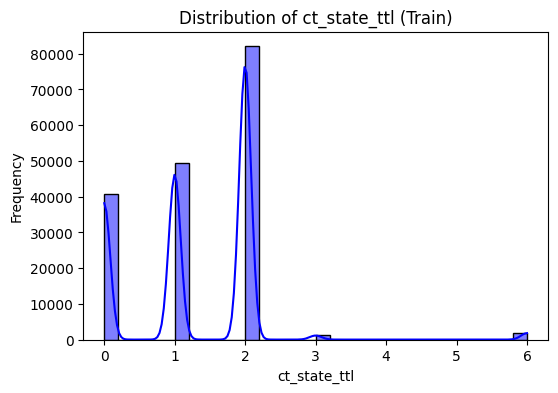

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: ct_state_ttl (Train)
Shapiro-Wilk Test: Statistic=0.7659744911044164, p-value=3.3516515880405807e-150
D'Agostino and Pearson Test: Statistic=36072.514854867615, p-value=0.0
--------------------------------------------------


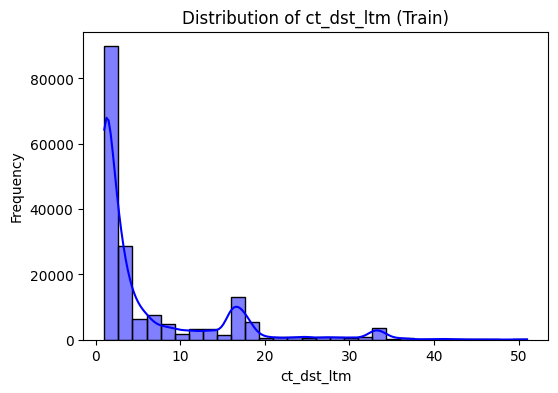

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: ct_dst_ltm (Train)
Shapiro-Wilk Test: Statistic=0.6812091618898086, p-value=2.9771886599596856e-160
D'Agostino and Pearson Test: Statistic=69189.0775816513, p-value=0.0
--------------------------------------------------


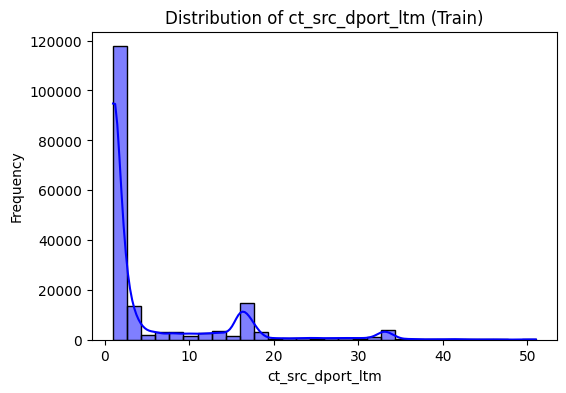

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: ct_src_dport_ltm (Train)
Shapiro-Wilk Test: Statistic=0.6115982652644907, p-value=7.564704973486306e-167
D'Agostino and Pearson Test: Statistic=74051.27981495432, p-value=0.0
--------------------------------------------------


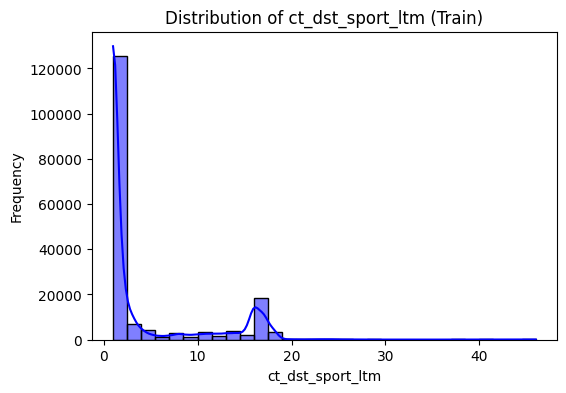

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: ct_dst_sport_ltm (Train)
Shapiro-Wilk Test: Statistic=0.5992823276993755, p-value=6.669504990939203e-168
D'Agostino and Pearson Test: Statistic=50375.56157865326, p-value=0.0
--------------------------------------------------


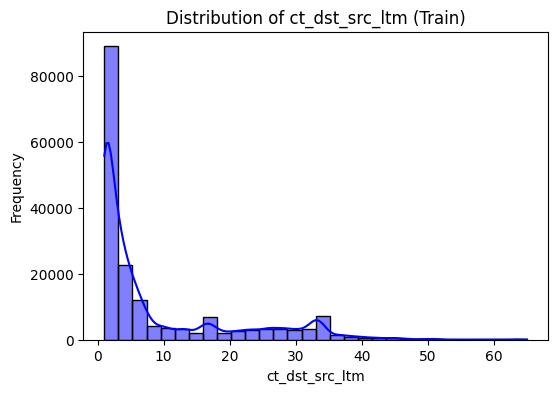

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: ct_dst_src_ltm (Train)
Shapiro-Wilk Test: Statistic=0.7215520147552955, p-value=8.206599928809744e-156
D'Agostino and Pearson Test: Statistic=43095.29792929127, p-value=0.0
--------------------------------------------------


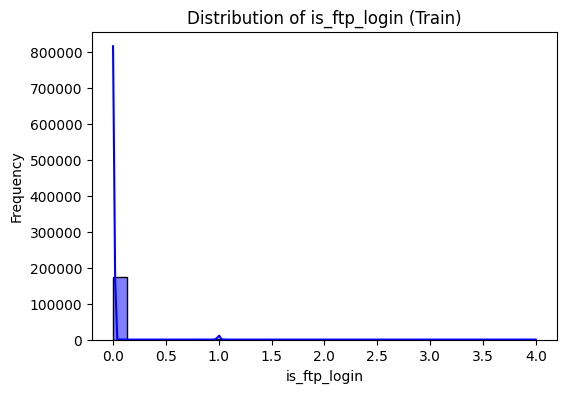

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: is_ftp_login (Train)
Shapiro-Wilk Test: Statistic=0.09234811606931737, p-value=1.0077955957805423e-196
D'Agostino and Pearson Test: Statistic=271984.89784336195, p-value=0.0
--------------------------------------------------


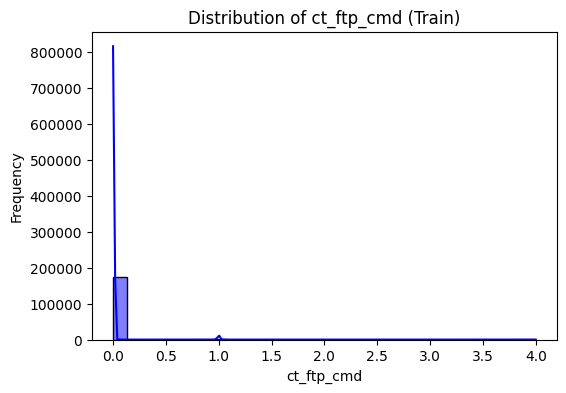

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: ct_ftp_cmd (Train)
Shapiro-Wilk Test: Statistic=0.09234811606931737, p-value=1.0077955957805423e-196
D'Agostino and Pearson Test: Statistic=271984.89784336195, p-value=0.0
--------------------------------------------------


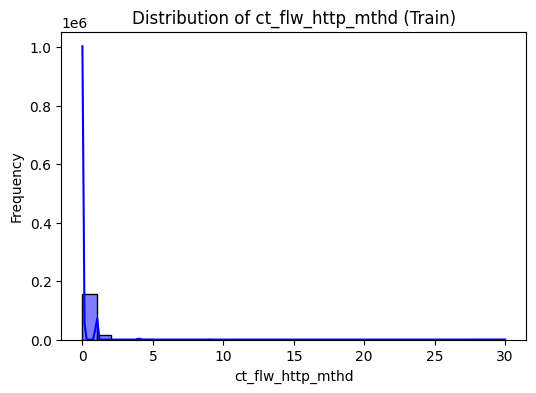

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: ct_flw_http_mthd (Train)
Shapiro-Wilk Test: Statistic=0.15346237051394496, p-value=3.551919495833152e-194
D'Agostino and Pearson Test: Statistic=411055.27343140054, p-value=0.0
--------------------------------------------------


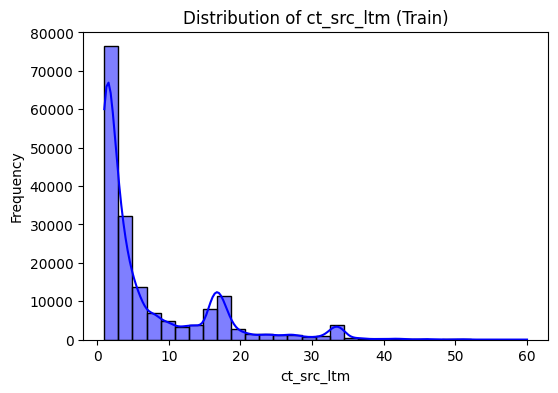

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: ct_src_ltm (Train)
Shapiro-Wilk Test: Statistic=0.7260245841993759, p-value=2.762773244308131e-155
D'Agostino and Pearson Test: Statistic=59687.19484372384, p-value=0.0
--------------------------------------------------


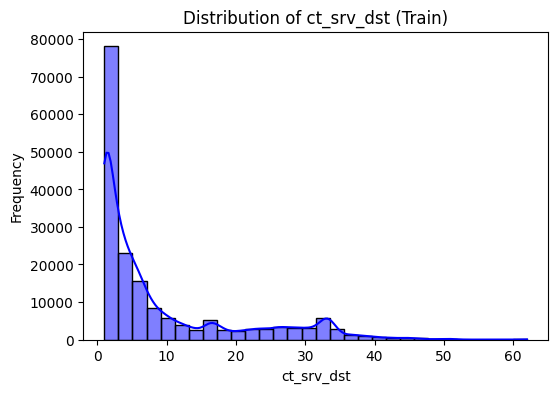

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Feature: ct_srv_dst (Train)
Shapiro-Wilk Test: Statistic=0.7492926629480019, p-value=2.064093555848788e-152
D'Agostino and Pearson Test: Statistic=42309.575940096605, p-value=0.0
--------------------------------------------------


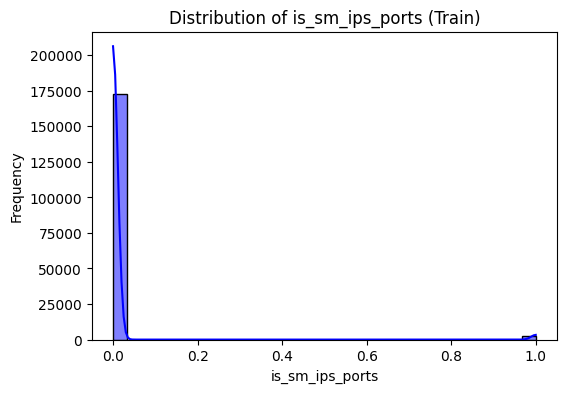

Feature: is_sm_ips_ports (Train)
Shapiro-Wilk Test: Statistic=0.10060865928922225, p-value=2.179736387188281e-196
D'Agostino and Pearson Test: Statistic=229954.94664071067, p-value=0.0
--------------------------------------------------
Training Data Normality Results:
              Feature  Shapiro-Wilk Statistic  Shapiro-Wilk p-value  \
0                 dur                0.192937         1.930694e-192   
1               spkts                0.071447         1.471820e-197   
2               dpkts                0.119507         1.304674e-195   
3              sbytes                0.020291         1.558283e-199   
4              dbytes                0.069268         1.207061e-197   
5                rate                0.595077         2.955409e-168   
6                sttl                0.632814         5.862817e-165   
7                dttl                0.631709         4.649124e-165   
8               sload                0.380978         6.045676e-183   
9               dload

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


In [ ]:
from scipy.stats import shapiro, normaltest

# Initialize summary table for training data
train_normality_results = []

# Check distribution visually and statistically for training data
for col in numerical_columns:
    plt.figure(figsize=(6, 4))
    sns.histplot(train[col], kde=True, bins=30, color='blue')
    plt.title(f"Distribution of {col} (Train)")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.show()

    # Perform normality tests
    shapiro_test = shapiro(train[col])  # Shapiro-Wilk Test
    ks_test = normaltest(train[col])  # D'Agostino and Pearson's Test

    # Store results
    train_normality_results.append({
        'Feature': col,
        'Shapiro-Wilk Statistic': shapiro_test.statistic,
        'Shapiro-Wilk p-value': shapiro_test.pvalue,
        'D Agostino-Pearson Statistic': ks_test.statistic,
        'D Agostino-Pearson p-value': ks_test.pvalue,
        'Normal (p > 0.05)': (shapiro_test.pvalue > 0.05) and (ks_test.pvalue > 0.05)
    })

    print(f"Feature: {col} (Train)")
    print(f"Shapiro-Wilk Test: Statistic={shapiro_test.statistic}, p-value={shapiro_test.pvalue}")
    print(f"D'Agostino and Pearson Test: Statistic={ks_test.statistic}, p-value={ks_test.pvalue}")
    print("-" * 50)

# Convert results to a DataFrame for reporting
train_normality_df = pd.DataFrame(train_normality_results)
print("Training Data Normality Results:")
print(train_normality_df)

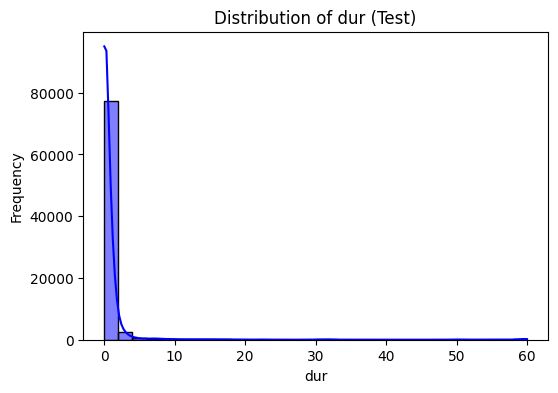

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: dur (Test)
Shapiro-Wilk Test: Statistic=0.18261506319095944, p-value=7.516003411063692e-172
D'Agostino and Pearson Test: Statistic=122970.09778253763, p-value=0.0
--------------------------------------------------


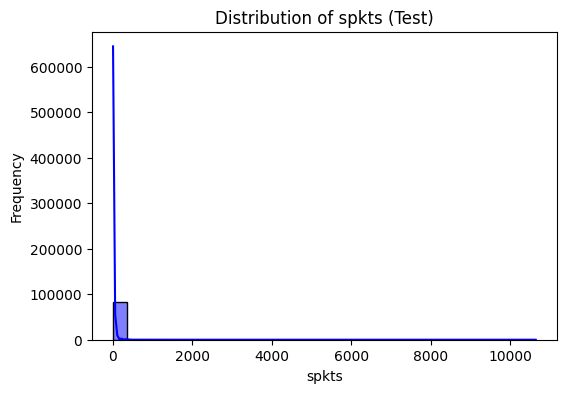

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: spkts (Test)
Shapiro-Wilk Test: Statistic=0.06025907826301713, p-value=1.2856281917297352e-176
D'Agostino and Pearson Test: Statistic=254203.6787000137, p-value=0.0
--------------------------------------------------


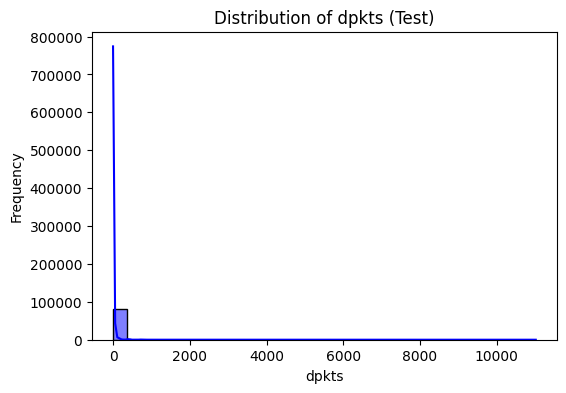

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: dpkts (Test)
Shapiro-Wilk Test: Statistic=0.0924509439370983, p-value=2.0250467009974047e-175
D'Agostino and Pearson Test: Statistic=257807.5498439854, p-value=0.0
--------------------------------------------------


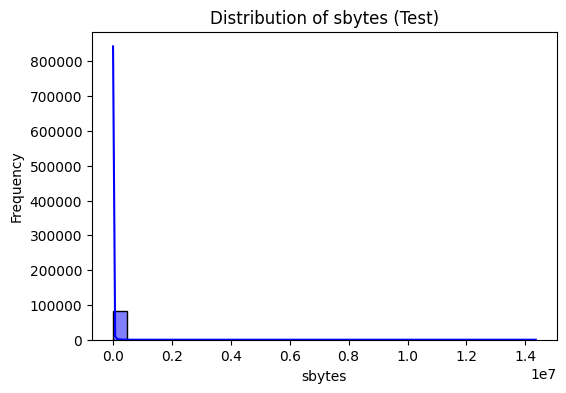

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: sbytes (Test)
Shapiro-Wilk Test: Statistic=0.01713711776454463, p-value=3.6469882458456053e-178
D'Agostino and Pearson Test: Statistic=265134.47874829103, p-value=0.0
--------------------------------------------------


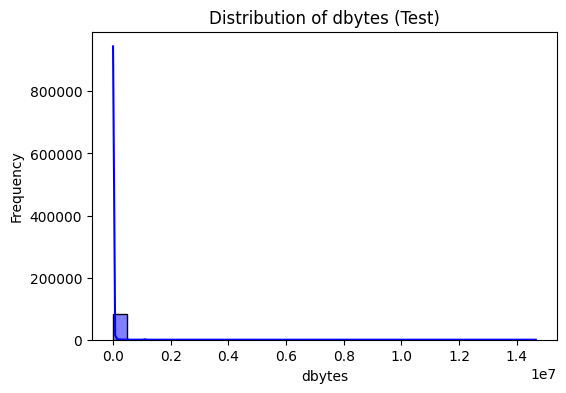

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: dbytes (Test)
Shapiro-Wilk Test: Statistic=0.051732674813635415, p-value=6.283300471314973e-177
D'Agostino and Pearson Test: Statistic=263641.0377992099, p-value=0.0
--------------------------------------------------


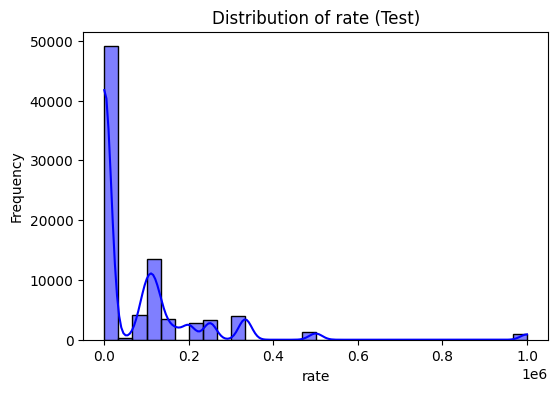

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: rate (Test)
Shapiro-Wilk Test: Statistic=0.585081330580697, p-value=1.27879788441917e-149
D'Agostino and Pearson Test: Statistic=61277.69866076206, p-value=0.0
--------------------------------------------------


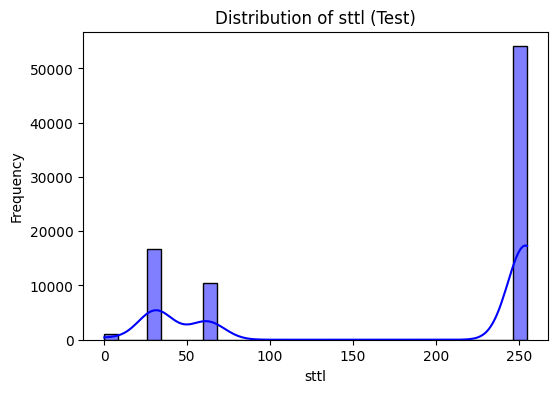

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: sttl (Test)
Shapiro-Wilk Test: Statistic=0.6329499464581663, p-value=9.11522555736911e-146
D'Agostino and Pearson Test: Statistic=526330.1044515446, p-value=0.0
--------------------------------------------------


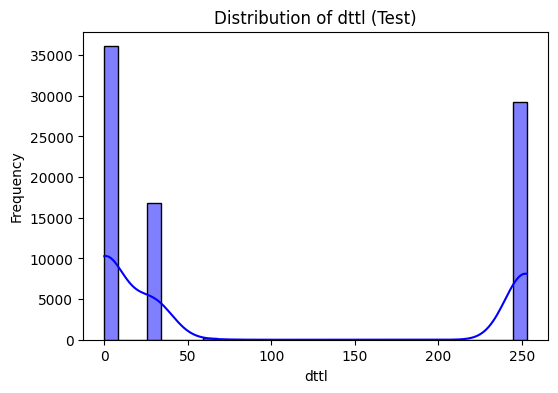

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: dttl (Test)
Shapiro-Wilk Test: Statistic=0.6567114821117109, p-value=1.1012193549068338e-143
D'Agostino and Pearson Test: Statistic=387852.67914941977, p-value=0.0
--------------------------------------------------


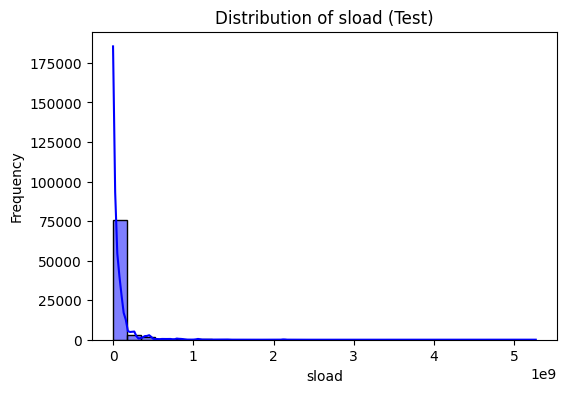

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: sload (Test)
Shapiro-Wilk Test: Statistic=0.35273362669018704, p-value=5.044506134639644e-164
D'Agostino and Pearson Test: Statistic=125481.00770733625, p-value=0.0
--------------------------------------------------


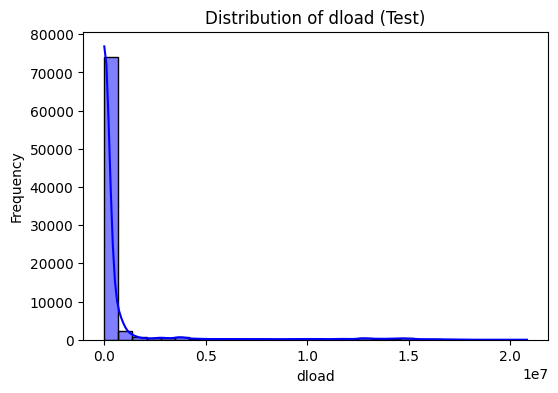

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: dload (Test)
Shapiro-Wilk Test: Statistic=0.28562003737560837, p-value=2.6079048309518558e-167
D'Agostino and Pearson Test: Statistic=76515.96074884754, p-value=0.0
--------------------------------------------------


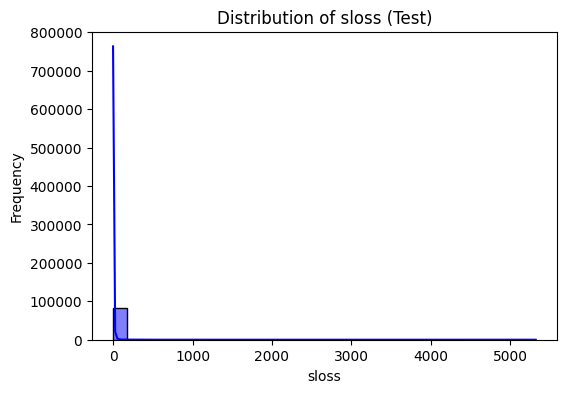

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: sloss (Test)
Shapiro-Wilk Test: Statistic=0.02697975343889425, p-value=8.121001419661054e-178
D'Agostino and Pearson Test: Statistic=262835.785228958, p-value=0.0
--------------------------------------------------


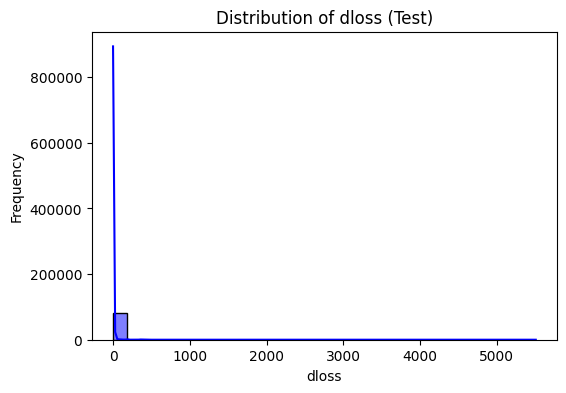

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: dloss (Test)
Shapiro-Wilk Test: Statistic=0.06587558032075058, p-value=2.0669102314408586e-176
D'Agostino and Pearson Test: Statistic=266975.033914686, p-value=0.0
--------------------------------------------------


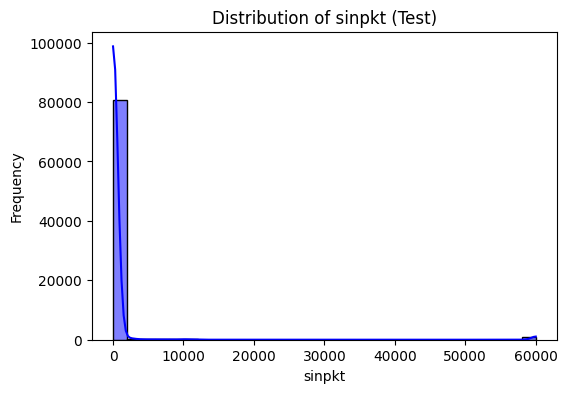

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: sinpkt (Test)
Shapiro-Wilk Test: Statistic=0.09510500270246458, p-value=2.5518098440592774e-175
D'Agostino and Pearson Test: Statistic=120372.15627903742, p-value=0.0
--------------------------------------------------


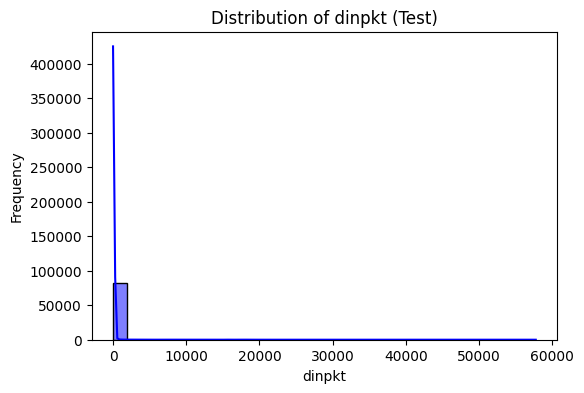

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: dinpkt (Test)
Shapiro-Wilk Test: Statistic=0.055690248675363874, p-value=8.753699864702952e-177
D'Agostino and Pearson Test: Statistic=190788.9603404463, p-value=0.0
--------------------------------------------------


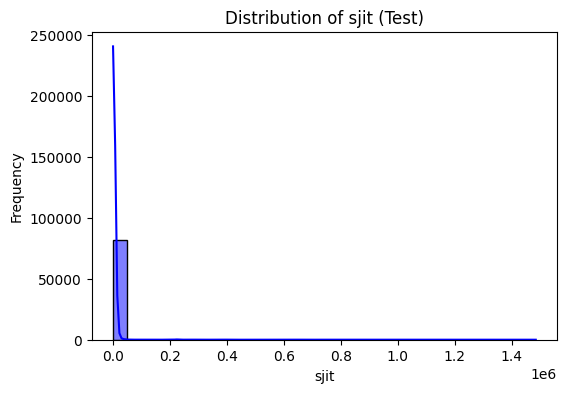

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: sjit (Test)
Shapiro-Wilk Test: Statistic=0.07228005964111306, p-value=3.5630853084416955e-176
D'Agostino and Pearson Test: Statistic=157963.70507861362, p-value=0.0
--------------------------------------------------


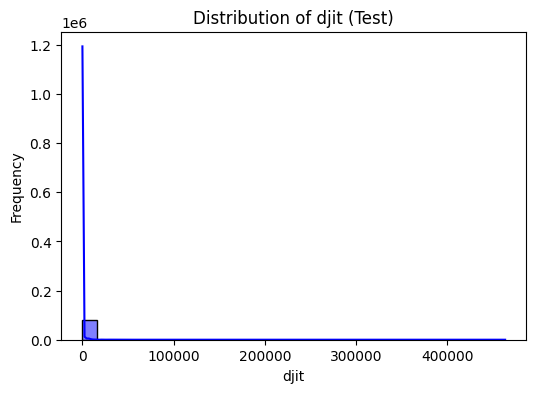

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: djit (Test)
Shapiro-Wilk Test: Statistic=0.10826909545634067, p-value=8.106878677890245e-175
D'Agostino and Pearson Test: Statistic=277510.9627325078, p-value=0.0
--------------------------------------------------


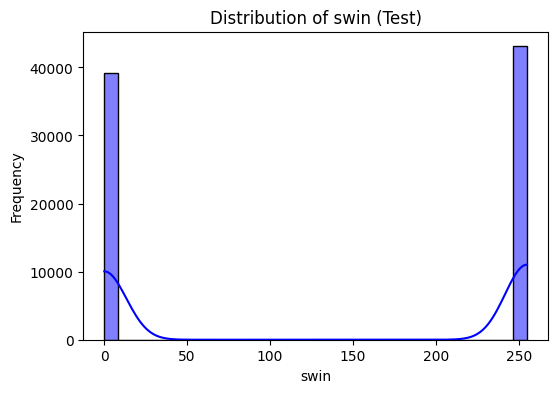

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: swin (Test)
Shapiro-Wilk Test: Statistic=0.6358722514039075, p-value=1.6189855227780422e-145
D'Agostino and Pearson Test: Statistic=282190.04889541835, p-value=0.0
--------------------------------------------------


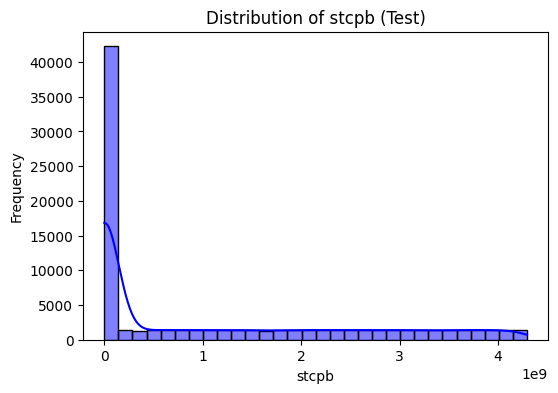

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: stcpb (Test)
Shapiro-Wilk Test: Statistic=0.7666140099113475, p-value=5.631324172563691e-132
D'Agostino and Pearson Test: Statistic=11914.432347379197, p-value=0.0
--------------------------------------------------


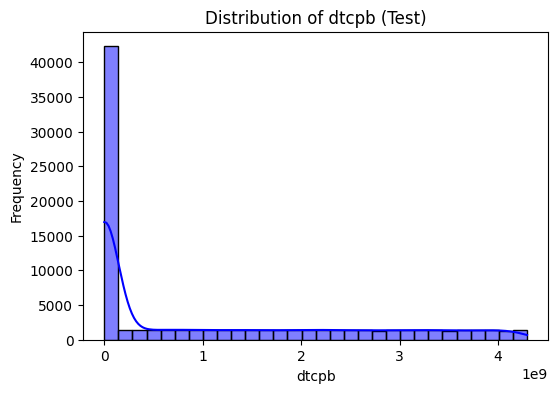

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: dtcpb (Test)
Shapiro-Wilk Test: Statistic=0.7657751735919742, p-value=4.406256698370078e-132
D'Agostino and Pearson Test: Statistic=11603.807646942503, p-value=0.0
--------------------------------------------------


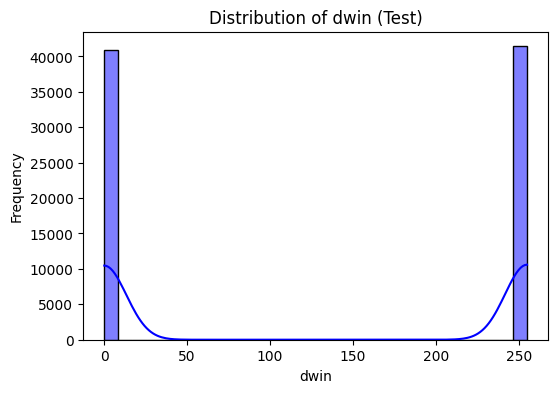

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: dwin (Test)
Shapiro-Wilk Test: Statistic=0.6366780426708905, p-value=1.8982211423834877e-145
D'Agostino and Pearson Test: Statistic=280716.211272422, p-value=0.0
--------------------------------------------------


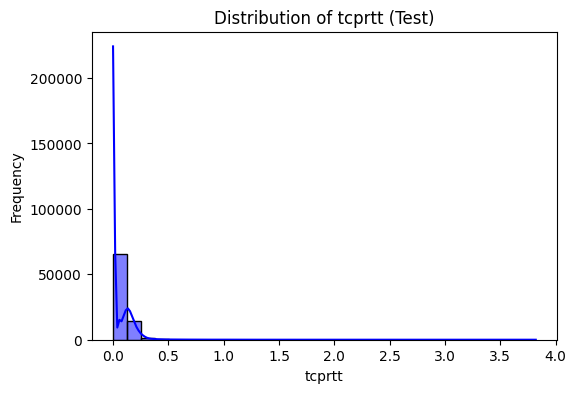

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: tcprtt (Test)
Shapiro-Wilk Test: Statistic=0.4738791754221743, p-value=3.152859310463377e-157
D'Agostino and Pearson Test: Statistic=123585.83490709629, p-value=0.0
--------------------------------------------------


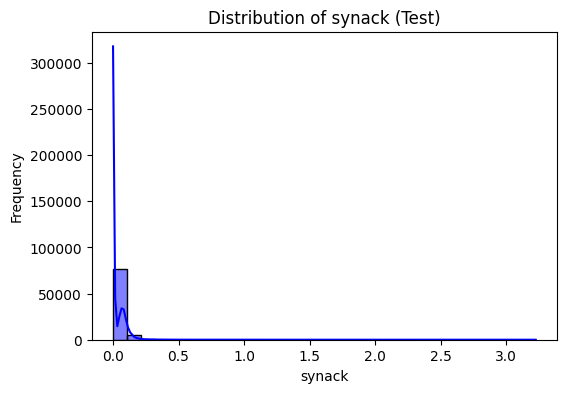

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: synack (Test)
Shapiro-Wilk Test: Statistic=0.38433018085640214, p-value=2.2772495533784525e-162
D'Agostino and Pearson Test: Statistic=153003.56984861838, p-value=0.0
--------------------------------------------------


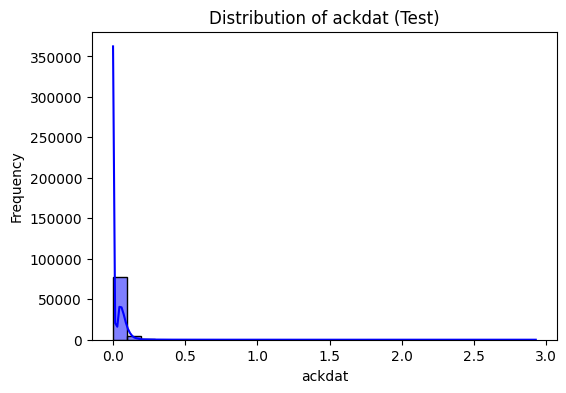

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: ackdat (Test)
Shapiro-Wilk Test: Statistic=0.47736669603805937, p-value=5.1808867340011416e-157
D'Agostino and Pearson Test: Statistic=128648.22372867822, p-value=0.0
--------------------------------------------------


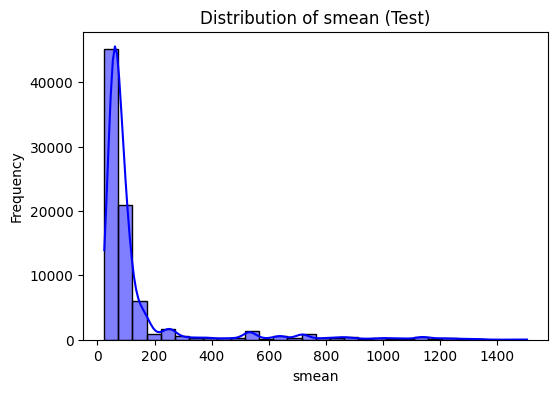

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: smean (Test)
Shapiro-Wilk Test: Statistic=0.45494873939606617, p-value=2.237433566897961e-158
D'Agostino and Pearson Test: Statistic=59536.64148606662, p-value=0.0
--------------------------------------------------


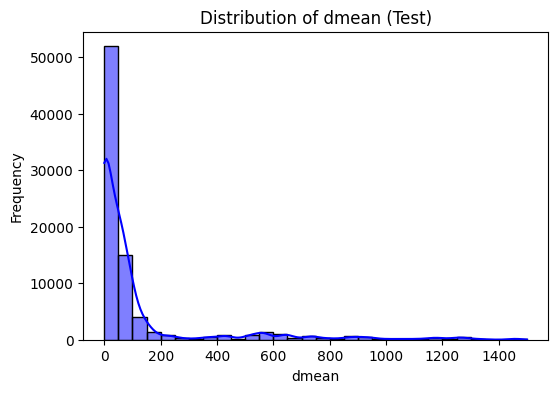

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: dmean (Test)
Shapiro-Wilk Test: Statistic=0.511290073833494, p-value=7.630696160596654e-155
D'Agostino and Pearson Test: Statistic=52349.773991061666, p-value=0.0
--------------------------------------------------


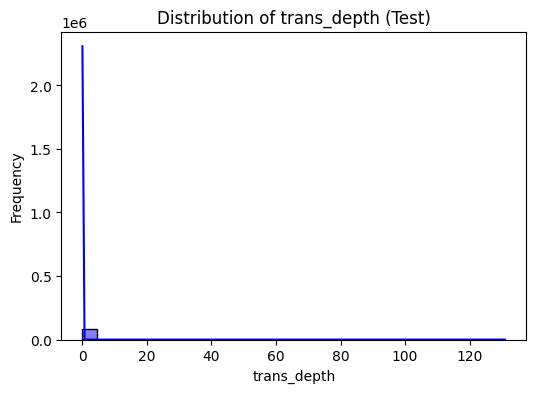

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: trans_depth (Test)
Shapiro-Wilk Test: Statistic=0.10345360774293255, p-value=5.302099260193963e-175
D'Agostino and Pearson Test: Statistic=384955.9368270857, p-value=0.0
--------------------------------------------------


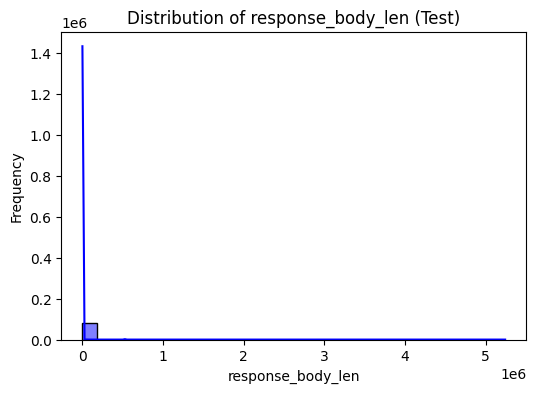

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: response_body_len (Test)
Shapiro-Wilk Test: Statistic=0.017794208383051457, p-value=3.846333932354956e-178
D'Agostino and Pearson Test: Statistic=297566.86037684185, p-value=0.0
--------------------------------------------------


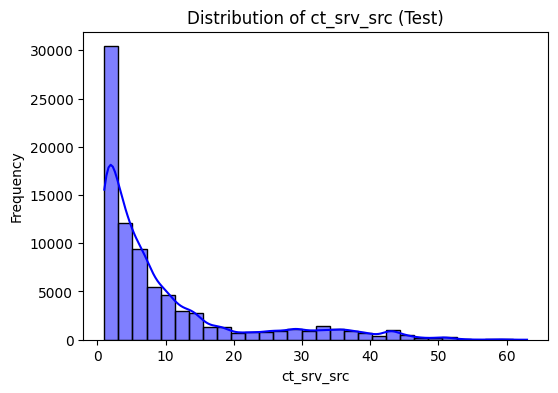

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: ct_srv_src (Test)
Shapiro-Wilk Test: Statistic=0.7370022202652682, p-value=1.51345625050231e-135
D'Agostino and Pearson Test: Statistic=27600.83525252095, p-value=0.0
--------------------------------------------------


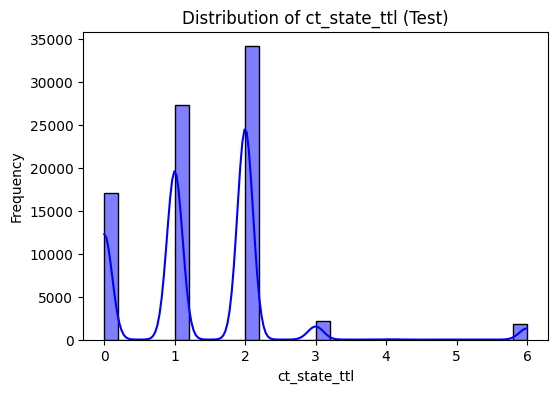

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: ct_state_ttl (Test)
Shapiro-Wilk Test: Statistic=0.7765722072741633, p-value=1.1015777541940357e-130
D'Agostino and Pearson Test: Statistic=27198.317008102757, p-value=0.0
--------------------------------------------------


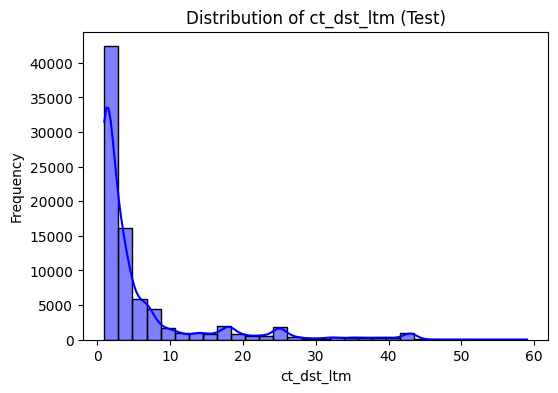

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: ct_dst_ltm (Test)
Shapiro-Wilk Test: Statistic=0.5991171902897344, p-value=1.5616876156377054e-148
D'Agostino and Pearson Test: Statistic=44641.10583827993, p-value=0.0
--------------------------------------------------


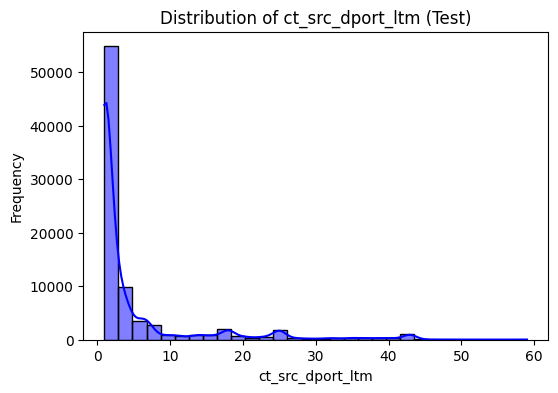

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: ct_src_dport_ltm (Test)
Shapiro-Wilk Test: Statistic=0.5300462685105687, p-value=1.3799203533465916e-153
D'Agostino and Pearson Test: Statistic=47922.63461625739, p-value=0.0
--------------------------------------------------


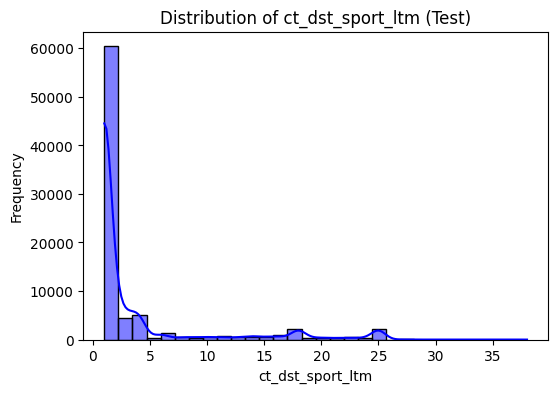

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: ct_dst_sport_ltm (Test)
Shapiro-Wilk Test: Statistic=0.5109693375883841, p-value=7.268454957125267e-155
D'Agostino and Pearson Test: Statistic=40253.86990109075, p-value=0.0
--------------------------------------------------


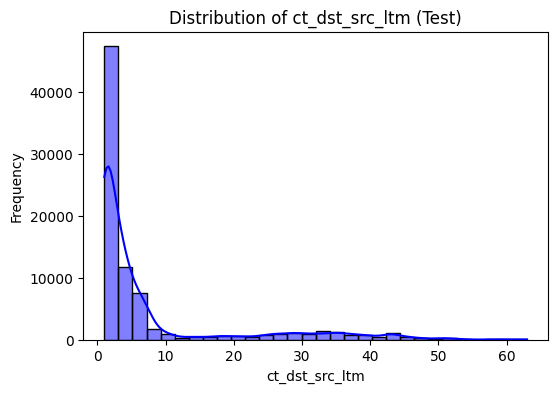

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: ct_dst_src_ltm (Test)
Shapiro-Wilk Test: Statistic=0.6025046078901275, p-value=2.8904357203993716e-148
D'Agostino and Pearson Test: Statistic=33891.31346090534, p-value=0.0
--------------------------------------------------


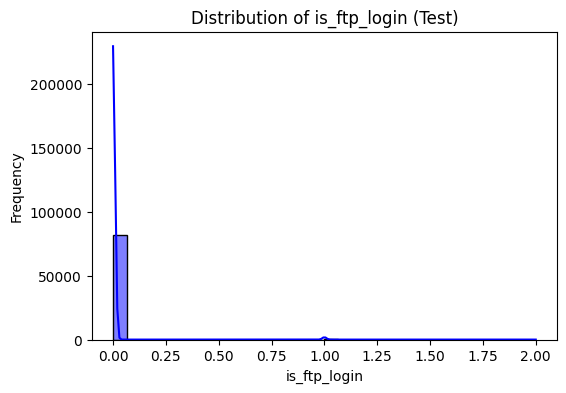

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: is_ftp_login (Test)
Shapiro-Wilk Test: Statistic=0.0619131269397597, p-value=1.478179033278569e-176
D'Agostino and Pearson Test: Statistic=132960.37432504265, p-value=0.0
--------------------------------------------------


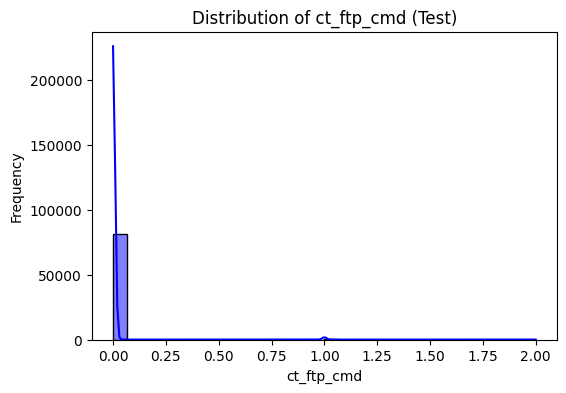

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: ct_ftp_cmd (Test)
Shapiro-Wilk Test: Statistic=0.06194283569613135, p-value=1.481892085218825e-176
D'Agostino and Pearson Test: Statistic=134439.66816056802, p-value=0.0
--------------------------------------------------


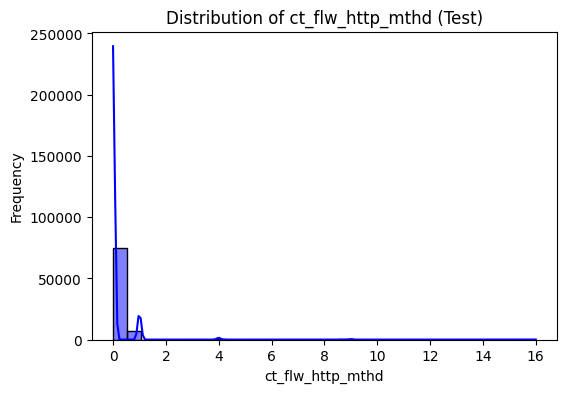

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: ct_flw_http_mthd (Test)
Shapiro-Wilk Test: Statistic=0.1858962435215964, p-value=1.0291102100772428e-171
D'Agostino and Pearson Test: Statistic=144455.5976949944, p-value=0.0
--------------------------------------------------


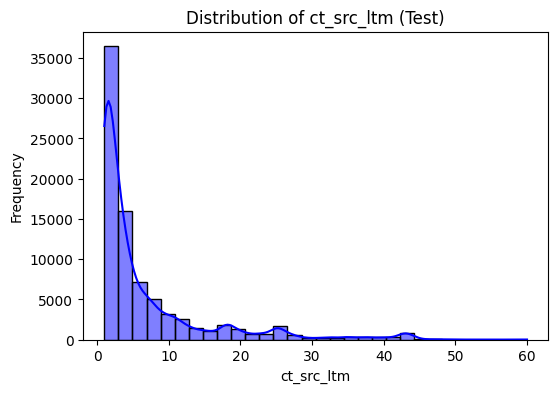

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: ct_src_ltm (Test)
Shapiro-Wilk Test: Statistic=0.6586622901201602, p-value=1.653737941420182e-143
D'Agostino and Pearson Test: Statistic=40549.72719873455, p-value=0.0
--------------------------------------------------


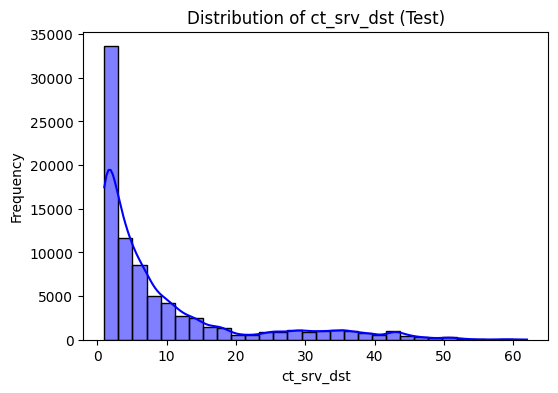

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Feature: ct_srv_dst (Test)
Shapiro-Wilk Test: Statistic=0.7216607267583227, p-value=2.9398809863267005e-137
D'Agostino and Pearson Test: Statistic=28437.353785695224, p-value=0.0
--------------------------------------------------


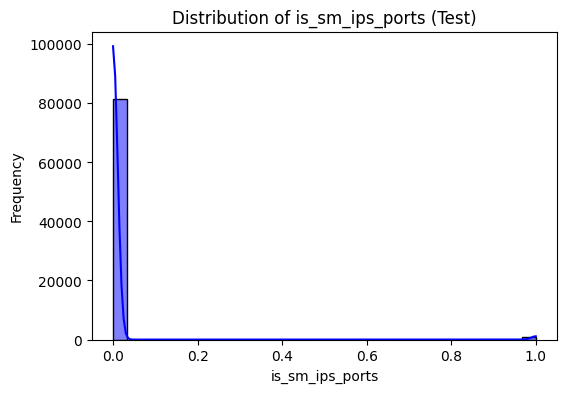

Feature: is_sm_ips_ports (Test)
Shapiro-Wilk Test: Statistic=0.07774895854168651, p-value=5.687868283659418e-176
D'Agostino and Pearson Test: Statistic=120637.70440172011, p-value=0.0
--------------------------------------------------
Test Data Normality Results:
              Feature  Shapiro-Wilk Statistic  Shapiro-Wilk p-value  \
0                 dur                0.182615         7.516003e-172   
1               spkts                0.060259         1.285628e-176   
2               dpkts                0.092451         2.025047e-175   
3              sbytes                0.017137         3.646988e-178   
4              dbytes                0.051733         6.283300e-177   
5                rate                0.585081         1.278798e-149   
6                sttl                0.632950         9.115226e-146   
7                dttl                0.656711         1.101219e-143   
8               sload                0.352734         5.044506e-164   
9               dload     

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


In [ ]:
# Initialize summary table for test data
test_normality_results = []

# Check distribution visually and statistically for test data
for col in numerical_columns:
    plt.figure(figsize=(6, 4))
    sns.histplot(test[col], kde=True, bins=30, color='blue')
    plt.title(f"Distribution of {col} (Test)")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.show()

    # Perform normality tests
    shapiro_test = shapiro(test[col])  # Shapiro-Wilk Test
    ks_test = normaltest(test[col])  # D'Agostino and Pearson's Test

    # Store results
    test_normality_results.append({
        'Feature': col,
        'Shapiro-Wilk Statistic': shapiro_test.statistic,
        'Shapiro-Wilk p-value': shapiro_test.pvalue,
        'D Agostino-Pearson Statistic': ks_test.statistic,
        'D Agostino-Pearson p-value': ks_test.pvalue,
        'Normal (p > 0.05)': (shapiro_test.pvalue > 0.05) and (ks_test.pvalue > 0.05)
    })

    print(f"Feature: {col} (Test)")
    print(f"Shapiro-Wilk Test: Statistic={shapiro_test.statistic}, p-value={shapiro_test.pvalue}")
    print(f"D'Agostino and Pearson Test: Statistic={ks_test.statistic}, p-value={ks_test.pvalue}")
    print("-" * 50)

# Convert results to a DataFrame for reporting
test_normality_df = pd.DataFrame(test_normality_results)
print("Test Data Normality Results:")
print(test_normality_df)

In [ ]:
print(train_normality_df.to_markdown(index = False))
print(test_normality_df.to_markdown(index = False))


| Feature           |   Shapiro-Wilk Statistic |   Shapiro-Wilk p-value |   D Agostino-Pearson Statistic |   D Agostino-Pearson p-value | Normal (p > 0.05)   |
|:------------------|-------------------------:|-----------------------:|-------------------------------:|-----------------------------:|:--------------------|
| dur               |                0.192937  |           1.93069e-192 |               225786           |                            0 | False               |
| spkts             |                0.0714473 |           1.47182e-197 |               507881           |                            0 | False               |
| dpkts             |                0.119507  |           1.30467e-195 |               493351           |                            0 | False               |
| sbytes            |                0.0202914 |           1.55828e-199 |               530456           |                            0 | False               |
| dbytes            |                0.0

Correlation Analysis

In [ ]:
from scipy.stats import pearsonr, spearmanr, shapiro


# Initialize a list to store correlation results for training data
train_correlation_results_list = []

# Iterate through numerical columns in the training data
for col in numerical_columns:
    # Check normality using Shapiro-Wilk test
    is_normal = shapiro(train[col]).pvalue > 0.05  # True if normally distributed

    if is_normal:  # Use Pearson correlation for normal distribution
        method = 'Pearson'
        corr, p_value = pearsonr(train[col], train['label'])
    else:  # Use Spearman correlation for non-normal distribution
        method = 'Spearman'
        corr, p_value = spearmanr(train[col], train['label'])

    # Append results to the list
    train_correlation_results_list.append({
        'Feature': col,
        'Method': method,
        'Correlation': corr,
        'P_value': p_value,
        'Significant': p_value < 0.05  # True if p-value < 0.05
    })

# Convert the list to a DataFrame for easy viewing
train_correlation_results_df = pd.DataFrame(train_correlation_results_list)

# Sort the results by absolute correlation values for better interpretation
train_correlation_results_df = train_correlation_results_df.sort_values(by='Correlation', ascending=False)

# Display the results for training data
print("Training Data Correlation Analysis Results:")
print(train_correlation_results_df)

# Filter for statistically significant correlations in training data
significant_train_correlations = train_correlation_results_df[train_correlation_results_df['Significant'] == True]
print("\nSignificant Correlations (Train):")
print(significant_train_correlations)


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 175341.
  res = hypotest_fun_out(*samples, **kwds)


Training Data Correlation Analysis Results:
              Feature    Method  Correlation        P_value  Significant
6                sttl  Spearman     0.732498   0.000000e+00         True
28       ct_state_ttl  Spearman     0.644469   0.000000e+00         True
31   ct_dst_sport_ltm  Spearman     0.429939   0.000000e+00         True
30   ct_src_dport_ltm  Spearman     0.326236   0.000000e+00         True
8               sload  Spearman     0.287640   0.000000e+00         True
5                rate  Spearman     0.286697   0.000000e+00         True
32     ct_dst_src_ltm  Spearman     0.220259   0.000000e+00         True
27         ct_srv_src  Spearman     0.094172   0.000000e+00         True
36         ct_src_ltm  Spearman     0.085382  5.815033e-281         True
37         ct_srv_dst  Spearman     0.070259  1.040294e-190         True
29         ct_dst_ltm  Spearman     0.033479   1.128653e-44         True
35   ct_flw_http_mthd  Spearman     0.020788   3.164417e-18         True
25     

In [ ]:
# Initialize a list to store correlation results for test data
test_correlation_results_list = []

# Iterate through numerical columns in the test data
for col in numerical_columns:
    # Check normality using Shapiro-Wilk test
    is_normal = shapiro(test[col]).pvalue > 0.05  # True if normally distributed

    if is_normal:  # Use Pearson correlation for normal distribution
        method = 'Pearson'
        corr, p_value = pearsonr(test[col], test['label'])
    else:  # Use Spearman correlation for non-normal distribution
        method = 'Spearman'
        corr, p_value = spearmanr(test[col], test['label'])

    # Append results to the list
    test_correlation_results_list.append({
        'Feature': col,
        'Method': method,
        'Correlation': corr,
        'P_value': p_value,
        'Significant': p_value < 0.05  # True if p-value < 0.05
    })

# Convert the list to a DataFrame for easy viewing
test_correlation_results_df = pd.DataFrame(test_correlation_results_list)

# Sort the results by absolute correlation values for better interpretation
test_correlation_results_df = test_correlation_results_df.sort_values(by='Correlation', ascending=False)

# Display the results for test data
print("Test Data Correlation Analysis Results:")
print(test_correlation_results_df)

# Filter for statistically significant correlations in test data
significant_test_correlations = test_correlation_results_df[test_correlation_results_df['Significant'] == True]
print("\nSignificant Correlations (Test):")
print(significant_test_correlations)

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 82332.
  res = hypotest_fun_out(*samples, **kwds)


Test Data Correlation Analysis Results:
              Feature    Method  Correlation        P_value  Significant
31   ct_dst_sport_ltm  Spearman     0.536975   0.000000e+00         True
6                sttl  Spearman     0.532903   0.000000e+00         True
28       ct_state_ttl  Spearman     0.489399   0.000000e+00         True
30   ct_src_dport_ltm  Spearman     0.384936   0.000000e+00         True
5                rate  Spearman     0.363144   0.000000e+00         True
8               sload  Spearman     0.340291   0.000000e+00         True
36         ct_src_ltm  Spearman     0.190154   0.000000e+00         True
27         ct_srv_src  Spearman     0.182837   0.000000e+00         True
32     ct_dst_src_ltm  Spearman     0.179599   0.000000e+00         True
37         ct_srv_dst  Spearman     0.165086   0.000000e+00         True
29         ct_dst_ltm  Spearman     0.143805   0.000000e+00         True
33       is_ftp_login  Spearman    -0.016830   1.370353e-06         True
34         

In [ ]:
print(train_correlation_results_df.to_markdown(index = False))
print(test_correlation_results_df.to_markdown(index = False))



| Feature           | Method   |   Correlation |      P_value | Significant   |
|:------------------|:---------|--------------:|-------------:|:--------------|
| sttl              | Spearman |     0.732498  | 0            | True          |
| ct_state_ttl      | Spearman |     0.644469  | 0            | True          |
| ct_dst_sport_ltm  | Spearman |     0.429939  | 0            | True          |
| ct_src_dport_ltm  | Spearman |     0.326236  | 0            | True          |
| sload             | Spearman |     0.28764   | 0            | True          |
| rate              | Spearman |     0.286697  | 0            | True          |
| ct_dst_src_ltm    | Spearman |     0.220259  | 0            | True          |
| ct_srv_src        | Spearman |     0.0941724 | 0            | True          |
| ct_src_ltm        | Spearman |     0.0853822 | 5.81503e-281 | True          |
| ct_srv_dst        | Spearman |     0.0702595 | 1.04029e-190 | True          |
| ct_dst_ltm        | Spearman |     0.0

In [ ]:
from scipy.stats import chi2_contingency


# Function to calculate Cramér's V
def cramers_v(confusion_matrix):
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum()
    return np.sqrt(chi2 / (n * (min(confusion_matrix.shape) - 1)))

# Identify categorical columns from standardized training data
categorical_columns_standardized_train = [
    col for col in train_standardized.columns
    if col not in numerical_columns and col not in ['id','label']
]

# Create a DataFrame to store results for training data
categorical_results_train = []

# Iterate through each categorical column in training data
for col in categorical_columns_standardized_train:
    # Create a contingency table
    contingency_table = pd.crosstab(train_standardized[col], train_standardized['label'])

    # Perform Chi-Square Test
    chi2_stat, p_value, _, _ = chi2_contingency(contingency_table)

    # Calculate Cramér's V
    cramer_v_value = cramers_v(contingency_table.values)

    # Append results
    categorical_results_train.append({
        'Feature': col,
        'Chi2_Statistic': chi2_stat,
        'P_Value': p_value,
        'Cramers_V': cramer_v_value
    })

# Convert results to a DataFrame for training data
categorical_results_train_df = pd.DataFrame(categorical_results_train)

# Display sorted results for training data
print("Training Data Categorical Feature Analysis Results:")
print(categorical_results_train_df.sort_values(by='Cramers_V', ascending=False).to_markdown(index=False))

Training Data Categorical Feature Analysis Results:
| Feature                   |   Chi2_Statistic |      P_Value |   Cramers_V |
|:--------------------------|-----------------:|-------------:|------------:|
| attack_cat_Normal         |    175336        | 0            | 0.999987    |
| state_INT                 |     44536.4      | 0            | 0.503983    |
| attack_cat_Generic        |     24315.2      | 0            | 0.37239     |
| state_CON                 |     23588.4      | 0            | 0.366782    |
| proto_tcp                 |     19526.8      | 0            | 0.333714    |
| attack_cat_Exploits       |     19353.8      | 0            | 0.332232    |
| state_FIN                 |     16129.6      | 0            | 0.303298    |
| attack_cat_Fuzzers        |      9518.37     | 0            | 0.232991    |
| service_dns               |      7716.09     | 0            | 0.209777    |
| proto_arp                 |      6190.59     | 0            | 0.187899    |
| attack_cat

In [ ]:
# Identify categorical columns from standardized test data
categorical_columns_standardized_test = [
    col for col in test_standardized.columns
    if col not in numerical_columns and col not in ['id','label']
]

# Create a DataFrame to store results for test data
categorical_results_test = []

# Iterate through each categorical column in test data
for col in categorical_columns_standardized_test:
    # Create a contingency table
    contingency_table = pd.crosstab(test_standardized[col], test_standardized['label'])

    # Perform Chi-Square Test
    chi2_stat, p_value, _, _ = chi2_contingency(contingency_table)

    # Calculate Cramér's V
    cramer_v_value = cramers_v(contingency_table.values)

    # Append results
    categorical_results_test.append({
        'Feature': col,
        'Chi2_Statistic': chi2_stat,
        'P_Value': p_value,
        'Cramers_V': cramer_v_value
    })

# Convert results to a DataFrame for test data
categorical_results_test_df = pd.DataFrame(categorical_results_test)

# Display sorted results for test data
print("Test Data Categorical Feature Analysis Results:")
print(categorical_results_test_df.sort_values(by='Cramers_V', ascending=False).to_markdown(index=False))

<ipython-input-55-729bade3da6b>:8: RuntimeWarning: invalid value encountered in divide
  return np.sqrt(chi2 / (n * (min(confusion_matrix.shape) - 1)))
<ipython-input-55-729bade3da6b>:8: RuntimeWarning: invalid value encountered in divide
  return np.sqrt(chi2 / (n * (min(confusion_matrix.shape) - 1)))


Test Data Categorical Feature Analysis Results:
| Feature                   |   Chi2_Statistic |      P_Value |     Cramers_V |
|:--------------------------|-----------------:|-------------:|--------------:|
| attack_cat_Normal         |    82328         | 0            |   0.999975    |
| state_INT                 |    23879.4       | 0            |   0.538552    |
| attack_cat_Generic        |    19980.3       | 0            |   0.492625    |
| proto_tcp                 |    14152.4       | 0            |   0.414602    |
| service_dns               |    10904.6       | 0            |   0.363933    |
| attack_cat_Exploits       |    10504.4       | 0            |   0.357192    |
| state_FIN                 |     8292.96      | 0            |   0.317373    |
| state_CON                 |     7724.64      | 0            |   0.306306    |
| service_-                 |     7670.74      | 0            |   0.305235    |
| proto_udp                 |     5609.91      | 0            |   0.2610

<ipython-input-55-729bade3da6b>:8: RuntimeWarning: invalid value encountered in divide
  return np.sqrt(chi2 / (n * (min(confusion_matrix.shape) - 1)))
<ipython-input-55-729bade3da6b>:8: RuntimeWarning: invalid value encountered in divide
  return np.sqrt(chi2 / (n * (min(confusion_matrix.shape) - 1)))
<ipython-input-55-729bade3da6b>:8: RuntimeWarning: invalid value encountered in divide
  return np.sqrt(chi2 / (n * (min(confusion_matrix.shape) - 1)))
<ipython-input-55-729bade3da6b>:8: RuntimeWarning: invalid value encountered in divide
  return np.sqrt(chi2 / (n * (min(confusion_matrix.shape) - 1)))


Model-based Feature Selection

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
import numpy as np
import pandas as pd

# Retain 'id' separately for referencing in both train and test datasets
train_ids = train_standardized['id']
test_ids = test_standardized['id']

# Prepare training data
X_train = train_standardized.drop(columns=['id', 'label'])  # Use only meaningful features
y_train = train_standardized['label']

# Apply Random Forest Classifier for Feature Selection
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Calculate feature importance scores
feature_importances = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': rf.feature_importances_
}).sort_values(by='Importance', ascending=False)

# Identify high-importance features based on a threshold
important_features = feature_importances[feature_importances['Importance'] > 0.01]  # Threshold
selected_features = important_features['Feature'].tolist()

# Retain only selected features in training data
X_selected_train = X_train[selected_features]  # Keep only important features

print("Selected Features Based on Importance:")
print(important_features.to_markdown(index=False))

# Apply XGBoost for Outlier Handling on training data
xgb = XGBClassifier(random_state=42)
xgb.fit(X_selected_train, y_train)
rf.fit(X_selected_train, y_train)  # Re-train Random Forest on selected features

# Detect outliers based on model predictions in training data
outliers_rf_train = (rf.predict(X_selected_train) != y_train)  # Random Forest outliers
outliers_xgb_train = (xgb.predict(X_selected_train) != y_train)  # XGBoost outliers

# Combine outlier results from both models in training data
combined_outliers_train = np.logical_or(outliers_rf_train, outliers_xgb_train)

# Create a cleaned training dataset excluding outliers and keeping selected features
data_cleaned_train = train_standardized[~combined_outliers_train]  # Exclude combined outliers
data_cleaned_train = data_cleaned_train[selected_features + ['label']]  # Retain only selected features and label

# Output results for training data
print("Number of outliers removed from training data:", combined_outliers_train.sum())
print("Shape of the cleaned training dataset:", data_cleaned_train.shape)

# Now apply the same process to the test dataset using the selected features

# Prepare test data using only selected features
X_test = test_standardized[selected_features]  # Keep only important features from test set

# Detect outliers based on model predictions in test data
outliers_rf_test = (rf.predict(X_test) != test_standardized['label'])  # Random Forest outliers (if labels are available)
outliers_xgb_test = (xgb.predict(X_test) != test_standardized['label'])  # XGBoost outliers (if labels are available)

# Combine outlier results from both models in test data (if labels are available)
combined_outliers_test = np.logical_or(outliers_rf_test, outliers_xgb_test)

# Create a cleaned test dataset excluding outliers and keeping selected features
data_cleaned_test = test_standardized[~combined_outliers_test]  # Exclude combined outliers
data_cleaned_test = data_cleaned_test[selected_features + ['label']]  # Retain only selected features and label

# Output results for test data
print("Number of outliers removed from test data:", combined_outliers_test.sum())
print("Shape of the cleaned test dataset:", data_cleaned_test.shape)

Selected Features Based on Importance:
| Feature             |   Importance |
|:--------------------|-------------:|
| attack_cat_Normal   |    0.244926  |
| sttl                |    0.112886  |
| dload               |    0.0565023 |
| ct_state_ttl        |    0.0445674 |
| dttl                |    0.0416441 |
| sload               |    0.0376351 |
| attack_cat_Fuzzers  |    0.0304444 |
| synack              |    0.0294212 |
| rate                |    0.0256053 |
| dmean               |    0.0247766 |
| dur                 |    0.0229882 |
| sbytes              |    0.0220538 |
| tcprtt              |    0.0219432 |
| sinpkt              |    0.0207532 |
| dpkts               |    0.020587  |
| ackdat              |    0.0204349 |
| dbytes              |    0.0193646 |
| attack_cat_Exploits |    0.0188921 |
| dinpkt              |    0.0187206 |
| ct_srv_dst          |    0.0162394 |
| state_INT           |    0.0141117 |
| ct_dst_src_ltm      |    0.0122338 |
| smean               |  

In [ ]:
# Check columns in cleaned datasets
print("Columns in Cleaned Training Dataset:")
print(data_cleaned_train.columns.tolist())

print("Columns in Cleaned Test Dataset:")
print(data_cleaned_test.columns.tolist())

Columns in Cleaned Training Dataset:
['attack_cat_Normal', 'sttl', 'dload', 'ct_state_ttl', 'dttl', 'sload', 'attack_cat_Fuzzers', 'synack', 'rate', 'dmean', 'dur', 'sbytes', 'tcprtt', 'sinpkt', 'dpkts', 'ackdat', 'dbytes', 'attack_cat_Exploits', 'dinpkt', 'ct_srv_dst', 'state_INT', 'ct_dst_src_ltm', 'smean', 'label']
Columns in Cleaned Test Dataset:
['attack_cat_Normal', 'sttl', 'dload', 'ct_state_ttl', 'dttl', 'sload', 'attack_cat_Fuzzers', 'synack', 'rate', 'dmean', 'dur', 'sbytes', 'tcprtt', 'sinpkt', 'dpkts', 'ackdat', 'dbytes', 'attack_cat_Exploits', 'dinpkt', 'ct_srv_dst', 'state_INT', 'ct_dst_src_ltm', 'smean', 'label']


In [ ]:
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTEENN

# Define features and target from the cleaned training dataset
X_train_cleaned = data_cleaned_train.drop(columns=['label'])  # Features
y_train_cleaned = data_cleaned_train['label']  # Target

# Resampling using SMOTE to address class imbalance
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train_cleaned, y_train_cleaned)

print("Resampled training dataset shape after SMOTE:", X_resampled.shape)

# Combine SMOTE with undersampling using SMOTEENN
smote_enn = SMOTEENN(random_state=42)
X_final, y_final = smote_enn.fit_resample(X_resampled, y_resampled)

print("Final training dataset shape after SMOTE and undersampling:", X_final.shape)



Resampled training dataset shape after SMOTE: (238682, 23)
Final training dataset shape after SMOTE and undersampling: (238521, 23)


In [ ]:
# The test dataset remains unchanged for evaluation.
X_test_cleaned = data_cleaned_test.drop(columns=['label'])
y_test_cleaned = data_cleaned_test['label']

post preprocessing visualisations

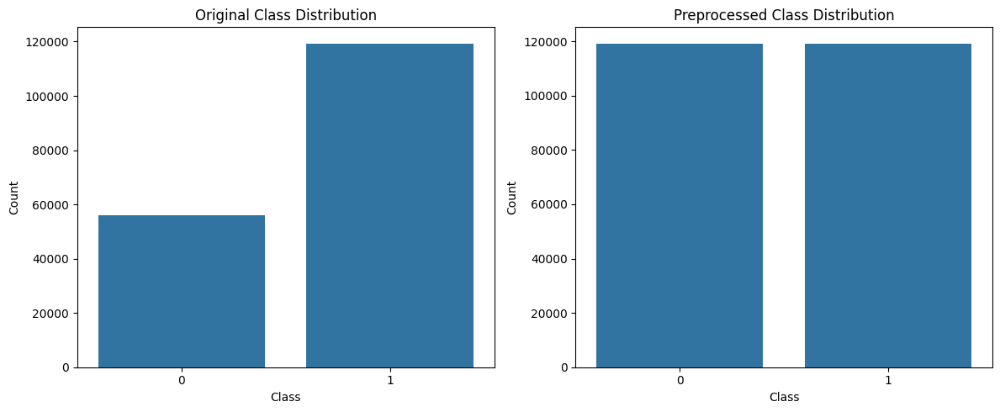

In [ ]:

plt.figure(figsize=(12, 5))

# Plot original class distribution
plt.subplot(1, 2, 1)
sns.countplot(x=train_standardized['label'])
plt.title('Original Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')

# Plot preprocessed class distribution after SMOTE and SMOTE-ENN
plt.subplot(1, 2, 2)
sns.countplot(x=y_final)
plt.title('Preprocessed Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')


plt.tight_layout()
plt.show()



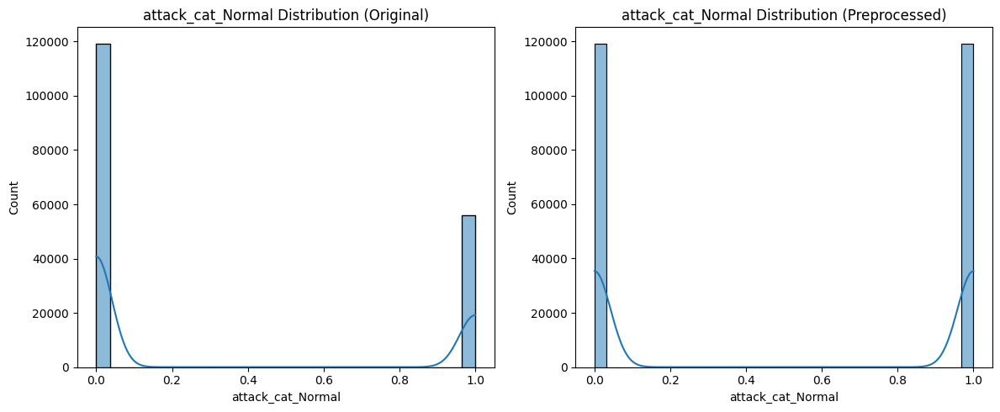

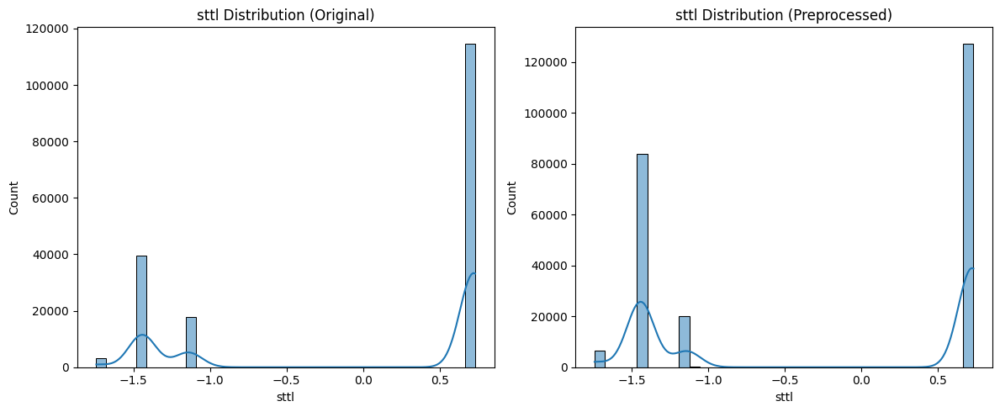

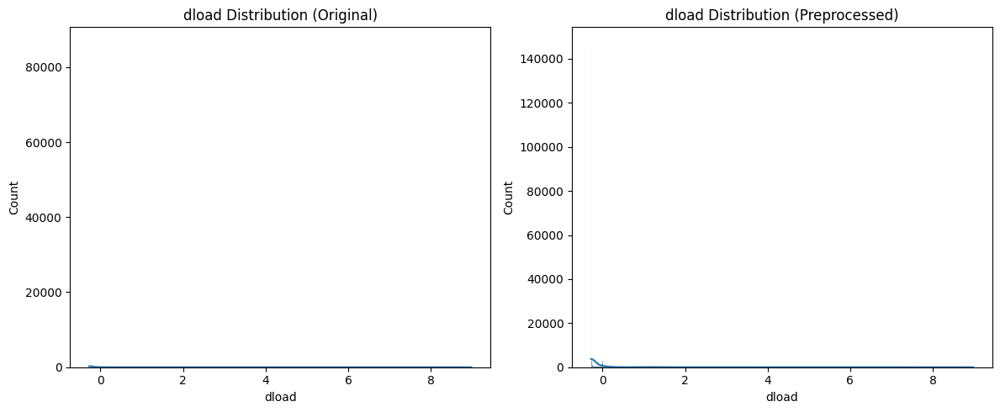

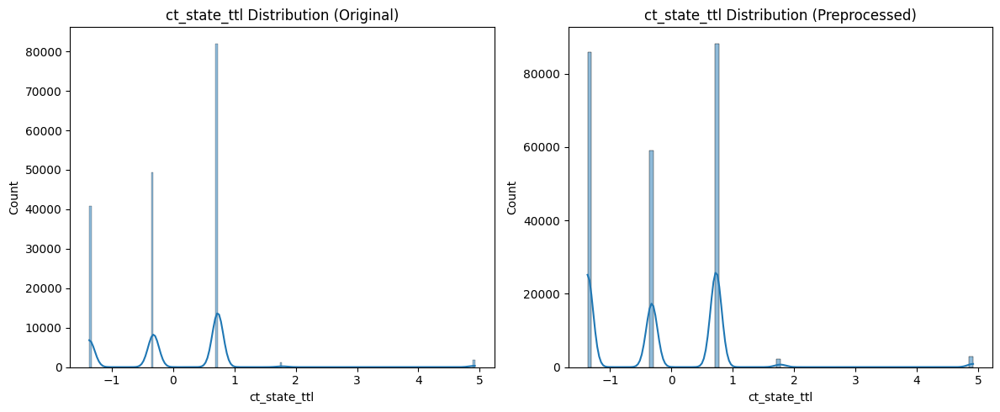

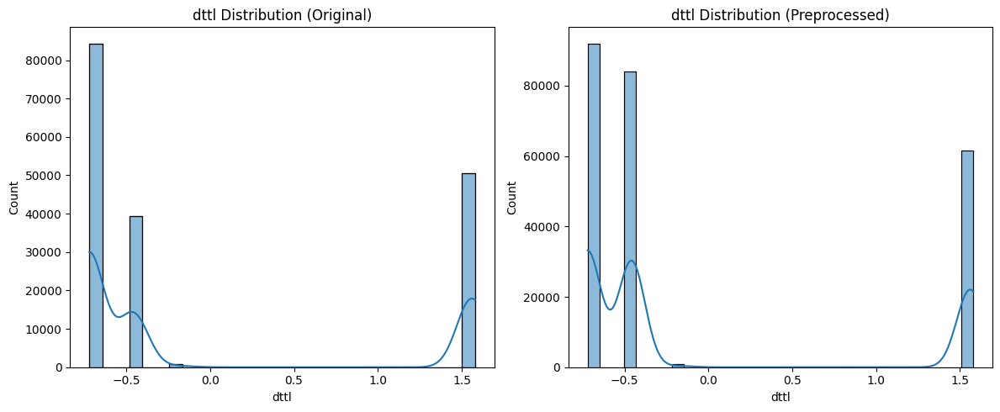

...

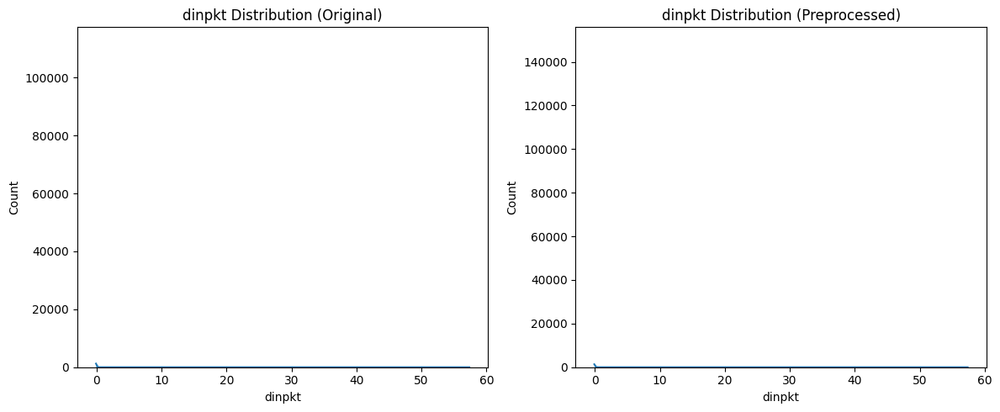

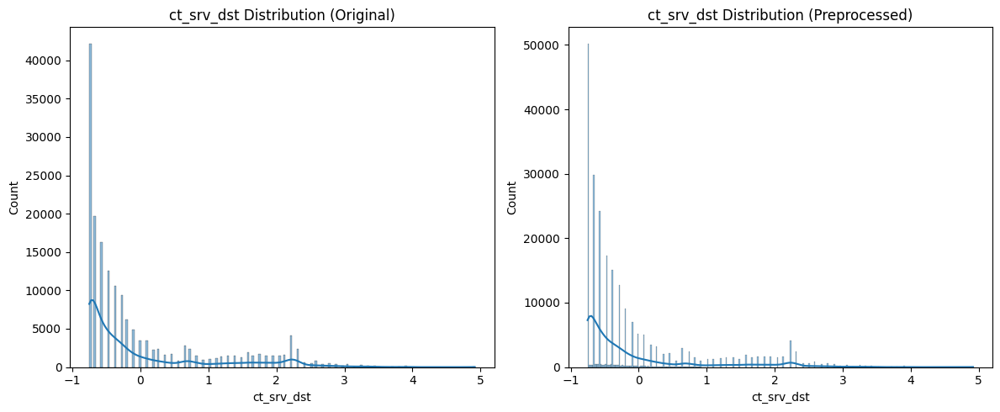

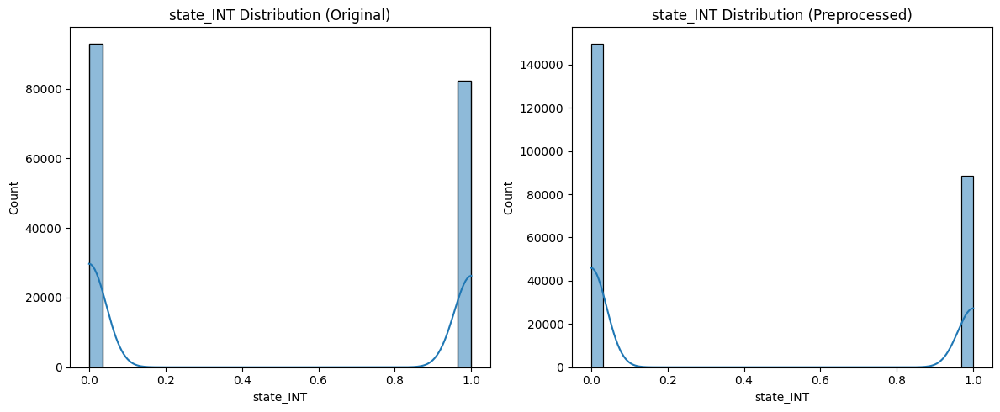

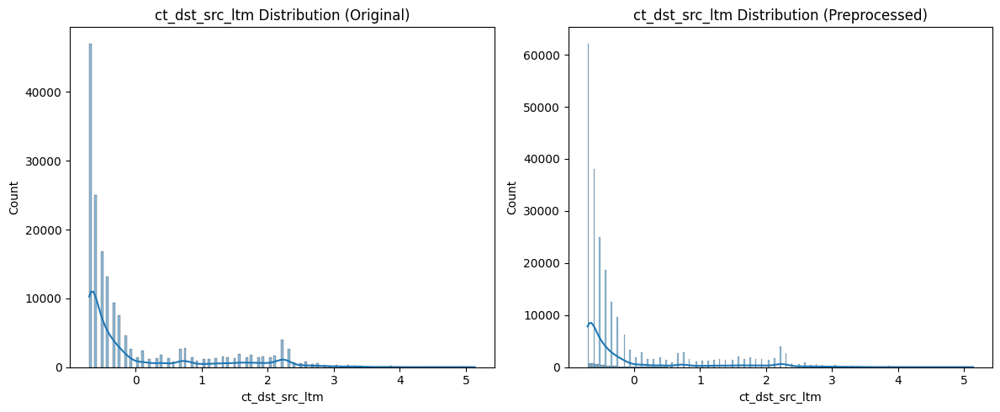

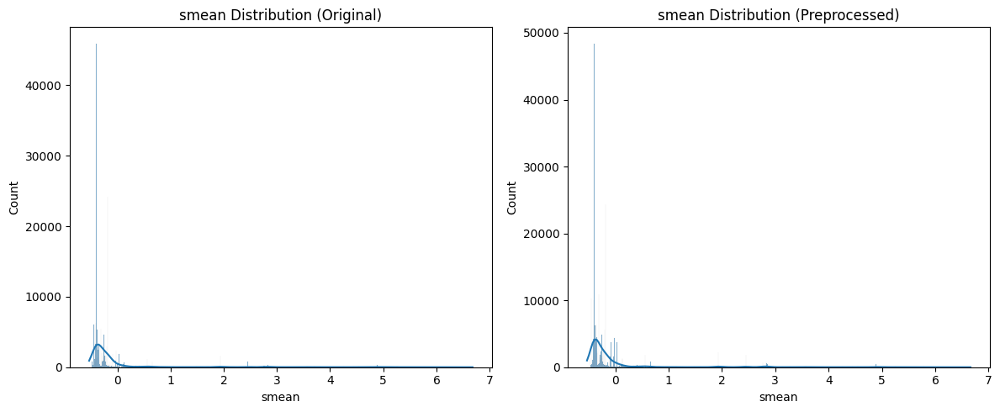

In [ ]:
def compare_feature_distributions(feature, X_original, X_resampled):
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    sns.histplot(X_original[feature], kde=True)
    plt.title(f'{feature} Distribution (Original)')

    plt.subplot(1, 2, 2)
    sns.histplot(X_resampled[feature], kde=True)
    plt.title(f'{feature} Distribution (Preprocessed)')

    plt.tight_layout()
    plt.show()

for feature in X_final.columns:
    compare_feature_distributions(feature, train_standardized ,X_final)

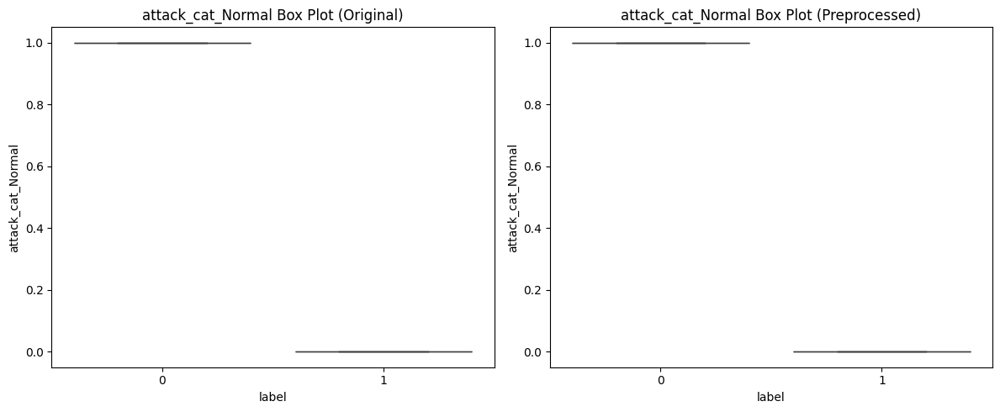

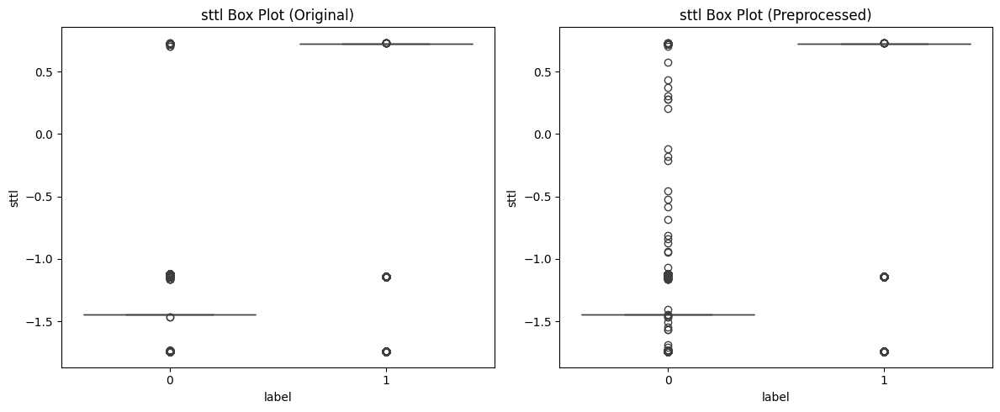

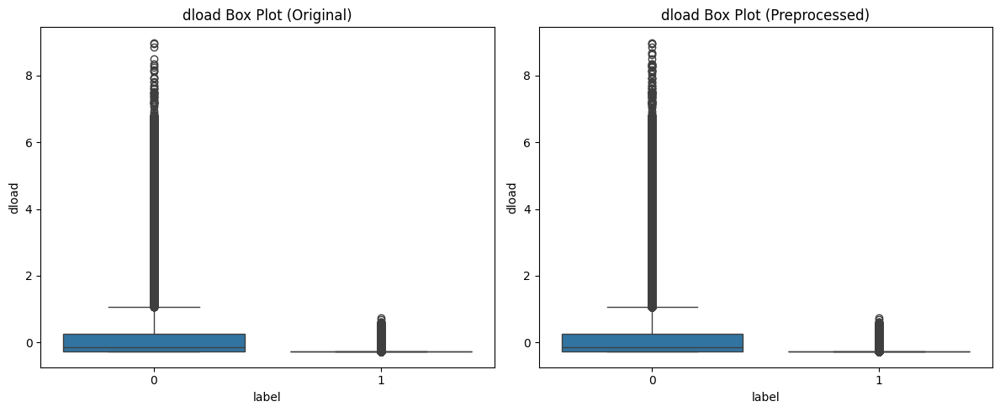

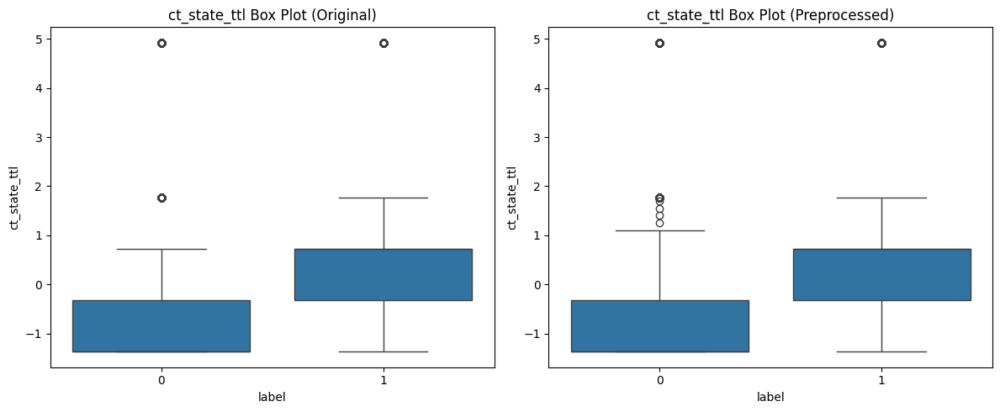

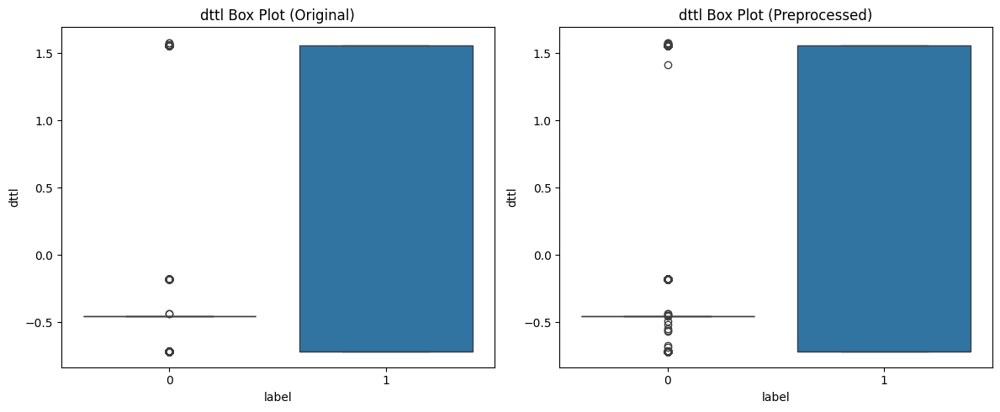

...

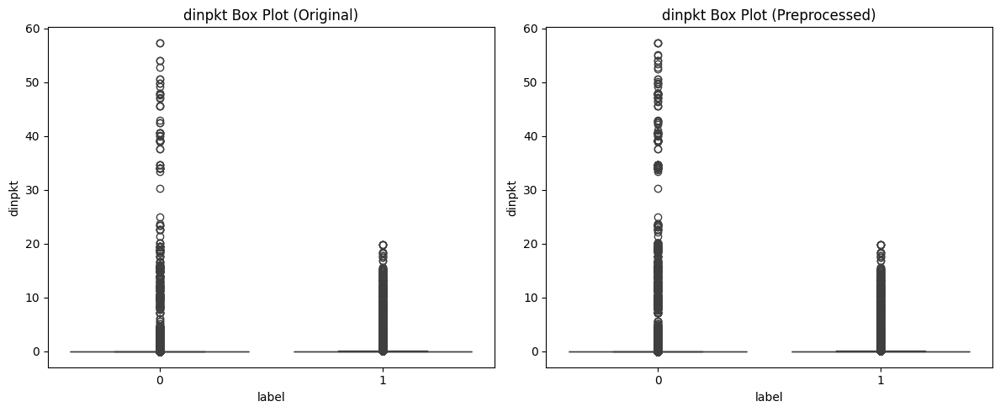

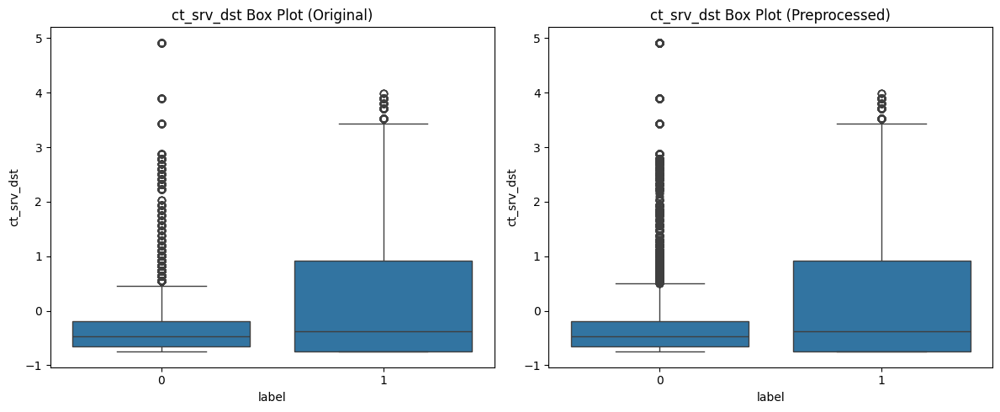

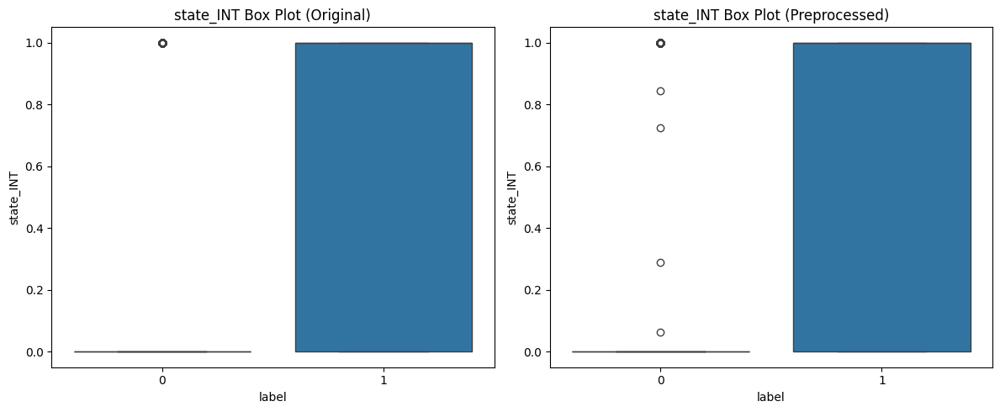

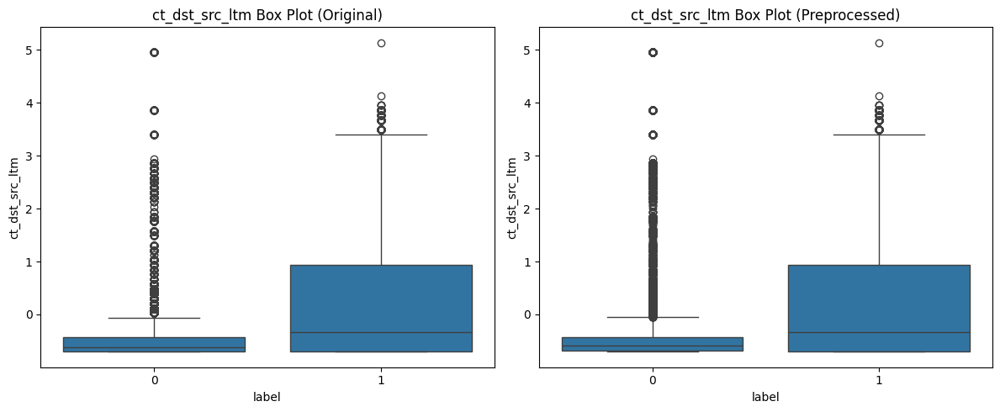

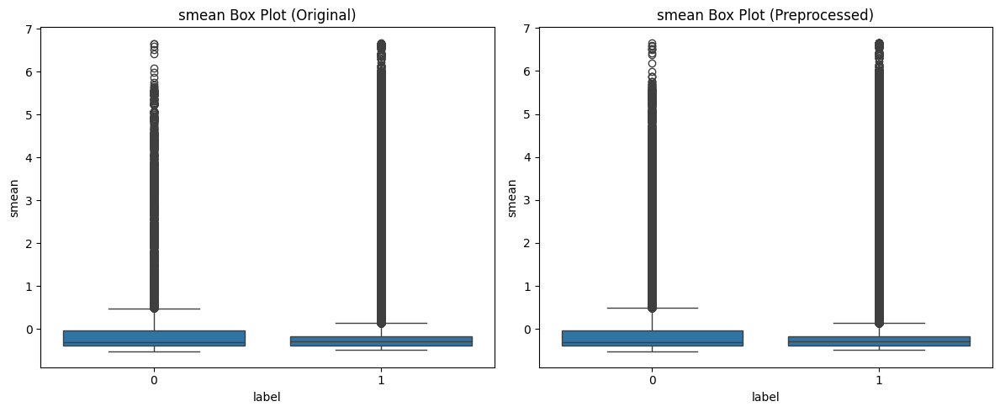

In [ ]:
def compare_box_plots(feature, X_original, y_original, X_resampled, y_resampled):
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    sns.boxplot(x=y_original, y=X_original[feature])
    plt.title(f'{feature} Box Plot (Original)')

    plt.subplot(1, 2, 2)
    sns.boxplot(x=y_resampled, y=X_resampled[feature])
    plt.title(f'{feature} Box Plot (Preprocessed)')

    plt.tight_layout()
    plt.show()

for feature in X_final.columns:
    compare_box_plots(feature, train_standardized, train_standardized['label'], X_final, y_final)

In [ ]:
X_train = X_final
y_train = y_final

For Saving the preprocessed training and testing datasets

In [ ]:




# # Concatenate x_train and y_train
# train_data_cleaned = pd.concat([X_train, y_train], axis=1)
# train_data_cleaned.to_csv('train_data.csv', index=False)

# # Concatenate x_test_cleaned and y_test_cleaned
# test_data_cleaned = pd.concat([X_test_cleaned, y_test_cleaned], axis=1)
# test_data_cleaned.to_csv('test_data.csv', index=False)


In [ ]:
# import pandas as pd

# # Read the saved CSV files
# train_data = pd.read_csv('train_data.csv')
# test_data = pd.read_csv('test_data.csv')

# # Separate features and labels for training data
# X_train = train_data.drop('label', axis=1)  # Assuming 'label' is the target column
# y_train = train_data['label']

# # Separate features and labels for test data
# X_test_cleaned = test_data.drop('label', axis=1)
# y_test_cleaned = test_data['label']

# print("X_train shape:", X_train.shape)
# print("y_train shape:", y_train.shape)
# print("X_test_cleaned shape:", X_test_cleaned.shape)
# print("y_test_cleaned shape:", y_test_cleaned.shape)

X_train shape: (238521, 23)
y_train shape: (238521,)
X_test_cleaned shape: (82332, 23)
y_test_cleaned shape: (82332,)


Models Application

In [ ]:

from sklearn.model_selection import  GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_auc_score, f1_score

Random Forest

In [ ]:
param_grid = {
    'n_estimators': [3, 5],
    'max_depth': [2, 3],
    'min_samples_split': [20, 30],
    'min_samples_leaf': [10, 15],
    'max_features': ['sqrt'],
    'max_leaf_nodes': [5, 10]
}



# Initialize Random Forest Classifier with balanced class weights
rf = RandomForestClassifier(random_state=42, class_weight='balanced')

# Set up GridSearchCV for hyperparameter tuning with cross-validation
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid,
                           cv=3, n_jobs=-1, verbose=2,
                           scoring='balanced_accuracy')

# Fit GridSearchCV
grid_search.fit(X_train, y_train)

# Get best parameters and best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print("Best Parameters:", best_params)
print("Best Cross-Validation Score (Balanced Accuracy):", best_score)

Fitting 3 folds for each of 32 candidates, totalling 96 fits
Best Parameters: {'max_depth': 3, 'max_features': 'sqrt', 'max_leaf_nodes': 10, 'min_samples_leaf': 10, 'min_samples_split': 20, 'n_estimators': 5}
Best Cross-Validation Score (Balanced Accuracy): 0.8576153055653449


In [ ]:
# Train final model with best parameters
final_rf = RandomForestClassifier(**best_params, random_state=42)
final_rf.fit(X_train, y_train)

RandomForestClassifier(max_depth=3, max_leaf_nodes=10, min_samples_leaf=10,
                       min_samples_split=20, n_estimators=5, random_state=42)

In [ ]:

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score, matthews_corrcoef, balanced_accuracy_score, cohen_kappa_score, classification_report


# Make predictions on test data
y_pred_rf = final_rf.predict(X_test_cleaned)
y_pred_proba_rf = final_rf.predict_proba(X_test_cleaned)[:, 1]

# Calculate evaluation metrics
accuracy_rf = accuracy_score(y_test_cleaned, y_pred_rf)
balanced_accuracy_rf = balanced_accuracy_score(y_test_cleaned, y_pred_rf)
precision_rf = precision_score(y_test_cleaned, y_pred_rf, average='weighted')
recall_rf = recall_score(y_test_cleaned, y_pred_rf, average='weighted')
f1_rf = f1_score(y_test_cleaned, y_pred_rf, average='weighted')
mcc_rf = matthews_corrcoef(y_test_cleaned, y_pred_rf)
kappa_rf = cohen_kappa_score(y_test_cleaned, y_pred_rf)
conf_matrix_rf = confusion_matrix(y_test_cleaned, y_pred_rf)
roc_auc_rf = roc_auc_score(y_test_cleaned, y_pred_proba_rf)

# Calculate specificity
tn_rf, fp_rf, fn_rf, tp_rf = conf_matrix_rf.ravel()
specificity_rf = tn_rf / (tn_rf + fp_rf)

# Print evaluation metrics
print("Random Forest Metrics:")
print("Accuracy:", accuracy_rf)
print("Balanced Accuracy:", balanced_accuracy_rf)
print("Precision:", precision_rf)
print("Recall:", recall_rf)
print("F1 Score:", f1_rf)
print("Matthews Correlation Coefficient:", mcc_rf)
print("Cohen's Kappa:", kappa_rf)
print("Specificity:", specificity_rf)
print("ROC AUC Score:", roc_auc_rf)
print("\nConfusion Matrix:\n", conf_matrix_rf)

# Detailed classification report
print("\nClassification Report:\n", classification_report(y_test_cleaned, y_pred_rf))

# Additional metrics
print("\nAdditional Metrics:")
print("True Positives:", tp_rf)
print("True Negatives:", tn_rf)
print("False Positives:", fp_rf)
print("False Negatives:", fn_rf)
print("Sensitivity (True Positive Rate):", recall_rf)
print("Fall-out (False Positive Rate):", fp_rf / (fp_rf + tn_rf))
print("Precision (Positive Predictive Value):", precision_rf)
print("Negative Predictive Value:", tn_rf / (tn_rf + fn_rf))
print("False Discovery Rate:", fp_rf / (fp_rf + tp_rf))
print("False Omission Rate:", fn_rf / (fn_rf + tn_rf))

Random Forest Metrics:
Accuracy: 0.8041709177476558
Balanced Accuracy: 0.7842551863608072
Precision: 0.8422257128156782
Recall: 0.8041709177476558
F1 Score: 0.7939276343104849
Matthews Correlation Coefficient: 0.6337439377401979
Cohen's Kappa: 0.5896057669974868
Specificity: 0.5874594594594594
ROC AUC Score: 0.9428222349345727

Confusion Matrix:
 [[21736 15264]
 [  859 44473]]

Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.59      0.73     37000
           1       0.74      0.98      0.85     45332

    accuracy                           0.80     82332
   macro avg       0.85      0.78      0.79     82332
weighted avg       0.84      0.80      0.79     82332


Additional Metrics:
True Positives: 44473
True Negatives: 21736
False Positives: 15264
False Negatives: 859
Sensitivity (True Positive Rate): 0.8041709177476558
Fall-out (False Positive Rate): 0.41254054054054057
Precision (Positive Predictive Value): 0.8422257128156

In [ ]:
import time
import psutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.inspection import permutation_importance
import shap


# Computational Metrics
start_time = time.time()
y_pred_rf = final_rf.predict(X_test_cleaned)
inference_time = time.time() - start_time

computational_metrics_rf = {
    'inference_speed': len(X_test_cleaned) / inference_time,
    'memory_usage': psutil.Process().memory_info().rss / (1024 * 1024),  # in MB
    'n_estimators': final_rf.n_estimators,
    'max_depth': final_rf.max_depth,
    'max_features': final_rf.max_features
}

# Interpretability Metrics
# 1. Feature Importance
feature_importance = final_rf.feature_importances_
feature_names = X_test_cleaned.columns if isinstance(X_test_cleaned, pd.DataFrame) else [f'feature_{i}' for i in range(X_test_cleaned.shape[1])]
importance_df = pd.DataFrame({'feature': feature_names, 'importance': feature_importance})
importance_df = importance_df.sort_values('importance', ascending=False)

# 2. Permutation Importance
perm_importance = permutation_importance(final_rf, X_test_cleaned, y_test_cleaned, n_repeats=10, random_state=42)
perm_importance_df = pd.DataFrame({
    'feature': feature_names,
    'permutation_importance': perm_importance.importances_mean
}).sort_values('permutation_importance', ascending=False)

# 3. SHAP Values
explainer = shap.TreeExplainer(final_rf)
shap_values = explainer.shap_values(X_test_cleaned)

# Print results
print("Computational Metrics:")
for metric, value in computational_metrics_rf.items():
    print(f"{metric}: {value}")

print("\nTop 5 Important Features (based on built-in feature importance):")
print(importance_df.head())

print("\nTop 5 Important Features (based on permutation importance):")
print(perm_importance_df.head())

# Save SHAP summary plot
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values, X_test_cleaned, plot_type="bar", show=False)
plt.tight_layout()
plt.savefig('rf_shap_summary_plot.png')
plt.close()

print("\nSHAP summary plot saved as 'rf_shap_summary_plot.png'")


Computational Metrics:
inference_speed: 6726376.379126979
memory_usage: 491.4296875
n_estimators: 5
max_depth: 3
max_features: sqrt

Top 5 Important Features (based on built-in feature importance):
        feature  importance
1          sttl    0.202697
3  ct_state_ttl    0.183762
5         sload    0.155808
2         dload    0.127539
8          rate    0.105806

Top 5 Important Features (based on permutation importance):
              feature  permutation_importance
0   attack_cat_Normal                0.112610
20          state_INT                0.032238
22              smean                0.022946
12             tcprtt                0.015550
9               dmean                0.012592

SHAP summary plot saved as 'rf_shap_summary_plot.png'


<Figure size 1000x600 with 0 Axes>

CNN Model

In [ ]:
from sklearn.model_selection import StratifiedKFold, train_test_split
import tensorflow as tf
import numpy as np
from sklearn.metrics import accuracy_score, confusion_matrix, balanced_accuracy_score, matthews_corrcoef, cohen_kappa_score
from sklearn.metrics import precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import time
import psutil
import os

# Set seed for NumPy
np.random.seed(42)

# Set seed for TensorFlow
tf.random.set_seed(42)

# Step 1: Define the input shape and number of classes
num_features = X_train.shape[1]
num_classes = len(np.unique(y_train))

# Define the CNN model
def create_cnn_model(learning_rate=0.001, num_filters=16, dropout_rate=0.5):
    model = tf.keras.models.Sequential([
        tf.keras.layers.Reshape((num_features, 1), input_shape=(num_features,)),
        tf.keras.layers.Conv1D(num_filters, kernel_size=3, activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling1D(pool_size=2),
        tf.keras.layers.GlobalAveragePooling1D(),
        tf.keras.layers.Dense(8, activation='relu'),
        tf.keras.layers.Dropout(dropout_rate),
        tf.keras.layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

# Function to measure memory usage
def get_memory_usage():
    process = psutil.Process(os.getpid())
    memory_info = process.memory_info()
    return memory_info.rss / 1024 ** 2  # Convert bytes to MB

# Define hyperparameter grid
param_grid_cnn = {
    'learning_rate': [0.001, 0.0005],
    'num_filters': [16, 32],
    'dropout_rate': [0.3, 0.5]
}

# Initialize best parameters and best score
best_params = None
best_score = 0.0

# Stratified k-fold cross-validation
kf = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# Variables to store computational metrics
total_time = 0.0
memory_usage = []
flop_count = 0

for learning_rate in param_grid_cnn['learning_rate']:
    for num_filters in param_grid_cnn['num_filters']:
        for dropout_rate in param_grid_cnn['dropout_rate']:
            fold_accuracies = []
            val_accuracies = []

            # Perform cross-validation
            for train_index, val_index in kf.split(X_train, y_train):
                # Use .iloc for indexing rows by numerical indices
                X_train_fold, X_val_fold = X_train.iloc[train_index], X_train.iloc[val_index]
                y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

                # Create and train the model
                model = create_cnn_model(learning_rate, num_filters, dropout_rate)

                start_time = time.time()
                history = model.fit(X_train_fold, y_train_fold, epochs=10, batch_size=32, verbose=0, validation_data=(X_val_fold, y_val_fold))
                end_time = time.time()

                # Record time taken for training
                total_time += (end_time - start_time)

                # Record memory usage
                memory_usage.append(get_memory_usage())

                # Evaluate on validation fold
                predictions = model.predict(X_val_fold)
                predictions_classes = np.argmax(predictions, axis=1)
                fold_accuracy = accuracy_score(y_val_fold, predictions_classes)
                val_accuracy = history.history['val_accuracy'][-1]
                fold_accuracies.append(fold_accuracy)
                val_accuracies.append(val_accuracy)

            # Calculate mean accuracy across folds
            mean_accuracy = np.mean(fold_accuracies)
            mean_val_accuracy = np.mean(val_accuracies)
            print(f"Learning Rate: {learning_rate}, Num Filters: {num_filters}, Dropout Rate: {dropout_rate}, Mean CV Accuracy: {mean_accuracy:.4f}, Mean Val Accuracy: {mean_val_accuracy:.4f}")

            # Update best parameters if current score is better
            if mean_accuracy > best_score:
                best_score = mean_accuracy
                best_params = {'learning_rate': learning_rate, 'num_filters': num_filters, 'dropout_rate': dropout_rate}

print("Best Parameters:", best_params)
print("Best Cross-Validation Score:", best_score)

# Split the training data into training and validation sets for final training
X_train_split, X_val_split, y_train_split, y_val_split = train_test_split(
    X_train, y_train, test_size=0.2, random_state=42)

# Train final model with best parameters on the split training data
best_model = create_cnn_model(**best_params)
start_time = time.time()
history = best_model.fit(X_train_split, y_train_split, epochs=10, batch_size=32, verbose=0, validation_data=(X_val_split, y_val_split))
end_time = time.time()

# Record time taken for final training
total_time += (end_time - start_time)

# Evaluate the best model on the test set
start_inference_time = time.time()
test_predictions = best_model.predict(X_test_cleaned)
end_inference_time = time.time()

inference_time = end_inference_time - start_inference_time
num_predictions = X_test_cleaned.shape[0]  # Number of samples in the test set
inference_speed = num_predictions / inference_time

test_predictions_classes = np.argmax(test_predictions, axis=1)
test_accuracy = accuracy_score(y_test_cleaned, test_predictions_classes)
print(f"Test Accuracy: {test_accuracy:.4f}")

# Memory usage during testing
memory_usage.append(get_memory_usage())

# Print computational metrics
print(f"\nTotal Training Time: {total_time:.4f} seconds")
print(f"Inference Speed: {inference_speed:.2f} predictions/second")
print(f"Average Memory Usage: {np.mean(memory_usage):.2f} MB")
print(f"Total FLOPs: {flop_count}")

# Step 8: Calculate confusion matrix for test set
conf_matrix_test_cnn = confusion_matrix(y_test_cleaned, test_predictions_classes)

# Extract values from the confusion matrix for test set
tp_test_cnn = conf_matrix_test_cnn[1, 1]   # True Positives for test set
tn_test_cnn = conf_matrix_test_cnn[0, 0]   # True Negatives for test set
fp_test_cnn = conf_matrix_test_cnn[0, 1]   # False Positives for test set
fn_test_cnn = conf_matrix_test_cnn[1, 0]   # False Negatives for test set

# Calculate additional metrics for test set with _cnn suffix
specificity_test_cnn = tn_test_cnn / (tn_test_cnn + fp_test_cnn) if (tn_test_cnn + fp_test_cnn) > 0 else 0
sensitivity_test_cnn = tp_test_cnn / (tp_test_cnn + fn_test_cnn) if (tp_test_cnn + fn_test_cnn) > 0 else 0
fpr_test_cnn = fp_test_cnn / (fp_test_cnn + tn_test_cnn) if (fp_test_cnn + tn_test_cnn) > 0 else 0
npv_test_cnn = tn_test_cnn / (tn_test_cnn + fn_test_cnn) if (tn_test_cnn + fn_test_cnn) > 0 else 0
fdr_test_cnn = fp_test_cnn / (fp_test_cnn + tp_test_cnn) if (fp_test_cnn + tp_test_cnn) > 0 else 0
for_test_cnn = fn_test_cnn / (fn_test_cnn + tn_test_cnn) if (fn_test_cnn + tn_test_cnn) > 0 else 0

# Print additional metrics for test set with _cnn suffix
print("\nTest Set Metrics:")
print("True Positives:", tp_test_cnn)
print("True Negatives:", tn_test_cnn)
print("False Positives:", fp_test_cnn)
print("False Negatives:", fn_test_cnn)
print("Specificity:", specificity_test_cnn)
print("Sensitivity (True Positive Rate):", sensitivity_test_cnn)
print("Fall-out (False Positive Rate):", fpr_test_cnn)
print("Negative Predictive Value:", npv_test_cnn)
print("False Discovery Rate:", fdr_test_cnn)
print("False Omission Rate:", for_test_cnn)

# Calculate additional test metrics with _cnn suffix
accuracy_cnn = accuracy_score(y_test_cleaned, test_predictions_classes)
precision_cnn = precision_score(y_test_cleaned, test_predictions_classes, average='weighted')
recall_cnn = recall_score(y_test_cleaned, test_predictions_classes, average='weighted')
f1_cnn = f1_score(y_test_cleaned, test_predictions_classes, average='weighted')

# Print additional test metrics
print("\nAdditional Test Metrics:")
print(f"Accuracy: {accuracy_cnn:.4f}")
print(f"Precision: {precision_cnn:.4f}")
print(f"Recall: {recall_cnn:.4f}")
print(f"F1-score: {f1_cnn:.4f}")


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/reshape.py:39: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2485/2485 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/reshape.py:39: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2485/2485 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/reshape.py:39: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2485/2485 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step
Learning Rate: 0.001, Num Filters: 16, Dropout Rate: 0.3, Mean CV Accuracy: 0.9985, Mean Val Accuracy: 0.9985


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/reshape.py:39: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2485/2485 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/reshape.py:39: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2485/2485 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/reshape.py:39: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2485/2485 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step
Learning Rate: 0.001, Num Filters: 16, Dropout Rate: 0.5, Mean CV Accuracy: 0.9966, Mean Val Accuracy: 0.9966


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/reshape.py:39: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2485/2485 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/reshape.py:39: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2485/2485 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/reshape.py:39: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2485/2485 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step
Learning Rate: 0.001, Num Filters: 32, Dropout Rate: 0.3, Mean CV Accuracy: 0.9998, Mean Val Accuracy: 0.9998


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/reshape.py:39: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2485/2485 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/reshape.py:39: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2485/2485 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/reshape.py:39: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2485/2485 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step
Learning Rate: 0.001, Num Filters: 32, Dropout Rate: 0.5, Mean CV Accuracy: 0.9994, Mean Val Accuracy: 0.9994


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/reshape.py:39: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2485/2485 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/reshape.py:39: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2485/2485 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/reshape.py:39: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2485/2485 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step
Learning Rate: 0.0005, Num Filters: 16, Dropout Rate: 0.3, Mean CV Accuracy: 0.9987, Mean Val Accuracy: 0.9987


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/reshape.py:39: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2485/2485 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/reshape.py:39: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2485/2485 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/reshape.py:39: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2485/2485 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step
Learning Rate: 0.0005, Num Filters: 16, Dropout Rate: 0.5, Mean CV Accuracy: 0.9989, Mean Val Accuracy: 0.9989


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/reshape.py:39: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2485/2485 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/reshape.py:39: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2485/2485 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/reshape.py:39: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2485/2485 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step
Learning Rate: 0.0005, Num Filters: 32, Dropout Rate: 0.3, Mean CV Accuracy: 0.9998, Mean Val Accuracy: 0.9998


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/reshape.py:39: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2485/2485 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/reshape.py:39: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2485/2485 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/reshape.py:39: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2485/2485 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step
Learning Rate: 0.0005, Num Filters: 32, Dropout Rate: 0.5, Mean CV Accuracy: 0.9997, Mean Val Accuracy: 0.9997
Best Parameters: {'learning_rate': 0.0005, 'num_filters': 32, 'dropout_rate': 0.3}
Best Cross-Validation Score: 0.9998113373665212


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/reshape.py:39: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2573/2573 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step
Test Accuracy: 0.9997

Total Training Time: 2502.9489 seconds
Inference Speed: 19311.66 predictions/second
Average Memory Usage: 5297.43 MB
Total FLOPs: 0

Test Set Metrics:
True Positives: 45310
True Negatives: 36995
False Positives: 5
False Negatives: 22
Specificity: 0.9998648648648648
Sensitivity (True Positive Rate): 0.9995146916085768
Fall-out (False Positive Rate): 0.00013513513513513514
Negative Predictive Value: 0.9994056784720534
False Discovery Rate: 0.00011033873993158998
False Omission Rate: 0.0005943215279466191

Additional Test Metrics:
Accuracy: 0.9997
Precision: 0.9997
Recall: 0.9997
F1-score: 0.9997



Balanced Accuracy: 0.9997
Matthews Correlation Coefficient (MCC): 0.9993
Cohen's Kappa: 0.9993
ROC-AUC: 1.0000


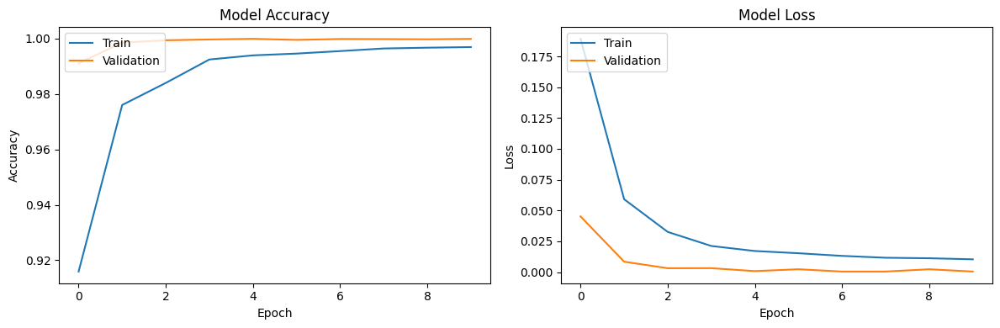

In [ ]:





# Calculate additional test metrics for the CNN model
balanced_accuracy_cnn = balanced_accuracy_score(y_test_cleaned, test_predictions_classes)
mcc_cnn = matthews_corrcoef(y_test_cleaned, test_predictions_classes)
kappa_cnn = cohen_kappa_score(y_test_cleaned, test_predictions_classes)

# Calculate ROC-AUC score for CNN model
if num_classes == 2:  # Binary classification
    roc_auc_cnn = roc_auc_score(y_test_cleaned, test_predictions[:, 1])
else:  # Multi-class classification
    roc_auc_cnn = roc_auc_score(y_test_cleaned, test_predictions, multi_class='ovr', average='weighted')

# Print the additional metrics
print(f"\nBalanced Accuracy: {balanced_accuracy_cnn:.4f}")
print(f"Matthews Correlation Coefficient (MCC): {mcc_cnn:.4f}")
print(f"Cohen's Kappa: {kappa_cnn:.4f}")
print(f"ROC-AUC: {roc_auc_cnn:.4f}")






# Step 10: Plot learning curves
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))

# Plot training & validation accuracy values
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()


In [ ]:
# Save the model temporarily to calculate its size
model.save("temp_model.h5")

# Calculate the size of the saved model in MB
model_size = os.path.getsize("temp_model.h5") / 1024 ** 2  # Convert bytes to MB

# Remove the temporary file
os.remove("temp_model.h5")

# Print the model size
print(f"Model size: {model_size:.2f} MB")


Model size: 0.05 MB


In [ ]:
computational_metrics_cnn = { 'total_training_time': total_time, 'average_memory_usage': np.mean(memory_usage), 'total_flops': flop_count, 'model_size': model_size}

In [ ]:
import shap
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Prepare background and test samples for SHAP
background_sample = X_train.sample(n=100, random_state=42).values  # Convert to numpy array
X_test_sample = X_test_cleaned.sample(n=50, random_state=42).values  # Convert to numpy array

# Create SHAP explainer using DeepExplainer for CNN
explainer = shap.DeepExplainer(best_model, background_sample)

# Calculate SHAP values for the test sample
shap_values = explainer.shap_values(X_test_sample)

# Calculate feature importance (mean absolute SHAP values for each feature)
if isinstance(shap_values, list):  # Multi-class case
    mean_shap_values = np.mean([np.abs(sv) for sv in shap_values], axis=0).mean(axis=0)
else:  # Binary classification case
    mean_shap_values = np.abs(shap_values).mean(axis=0)

# Ensure mean_shap_values is 1-dimensional
mean_shap_values = mean_shap_values.flatten()

# Print top 5 important features without creating a DataFrame
top_features = sorted(zip(X_test_cleaned.columns, mean_shap_values), key=lambda x: abs(x[1]), reverse=True)[:5]
print("Top 5 Important Features (CNN):")
for feature, importance in top_features:
    print(f"{feature}: {importance:.6f}")



# Visualize SHAP feature importance (bar plot)
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values, X_test_sample, feature_names=X_test_cleaned.columns, plot_type="bar", show=False)
plt.title("SHAP Feature Importance (CNN)")
plt.tight_layout()
plt.savefig('cnn_shap_feature_importance.png')
plt.close()

print("SHAP plots saved as 'cnn_shap_summary_plot.png' and 'cnn_shap_feature_importance.png'")


/usr/local/lib/python3.10/dist-packages/shap/explainers/_deep/deep_tf.py:99: UserWarning: Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.
  warnings.warn("Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.")


Top 5 Important Features (CNN):
sttl: 0.184843
attack_cat_Normal: 0.184383
ct_state_ttl: 0.163782
dload: 0.163714
attack_cat_Fuzzers: 0.094761
SHAP plots saved as 'cnn_shap_summary_plot.png' and 'cnn_shap_feature_importance.png'


<Figure size 1000x600 with 0 Axes>

In [ ]:
mean_shap_values = mean_shap_values.flatten()


In [ ]:
final_cnn = best_model

In [ ]:
model_size

0.04567718505859375

Stacking Hybrid Ensemble

In [ ]:
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, balanced_accuracy_score, matthews_corrcoef, cohen_kappa_score

# Generate predictions from base models

X_test_cleaned_float32 = X_test_cleaned.astype(np.float32)

# Using your existing trained models and test data
rf_predictions = final_rf.predict_proba(X_test_cleaned_float32)
cnn_predictions = final_cnn.predict(X_test_cleaned_float32)

# Create a new dataset for the meta-model
stacking_features = np.column_stack((rf_predictions, cnn_predictions))

# Train the meta-model
meta_model = LogisticRegression()
meta_model.fit(stacking_features, y_test_cleaned)

#Make predictions using the meta-model
ensemble_predictions = meta_model.predict(stacking_features)

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_auc_score

# Step 5: Evaluate the ensemble model
# Calculate performance metrics
ensemble_accuracy = accuracy_score(y_test_cleaned, ensemble_predictions)
ensemble_precision = precision_score(y_test_cleaned, ensemble_predictions, average='weighted')
ensemble_recall = recall_score(y_test_cleaned, ensemble_predictions, average='weighted')
ensemble_f1 = f1_score(y_test_cleaned, ensemble_predictions, average='weighted')
ensemble_balanced_accuracy = balanced_accuracy_score(y_test_cleaned, ensemble_predictions)
ensemble_mcc = matthews_corrcoef(y_test_cleaned, ensemble_predictions)
ensemble_kappa = cohen_kappa_score(y_test_cleaned, ensemble_predictions)

# Calculate ROC-AUC score
if num_classes == 2:  # Binary classification
    ensemble_roc_auc = roc_auc_score(y_test_cleaned, ensemble_predictions)
else:  # Multi-class classification
    ensemble_roc_auc = roc_auc_score(y_test_cleaned, ensemble_predictions, multi_class='ovr', average='weighted')

# Calculate confusion matrix for the ensemble model
conf_matrix_ensemble = confusion_matrix(y_test_cleaned, ensemble_predictions)

# Extract values from the confusion matrix
tp_ensemble = conf_matrix_ensemble[1, 1]   # True Positives
tn_ensemble = conf_matrix_ensemble[0, 0]   # True Negatives
fp_ensemble = conf_matrix_ensemble[0, 1]   # False Positives
fn_ensemble = conf_matrix_ensemble[1, 0]   # False Negatives

# Calculate additional metrics
specificity_ensemble = tn_ensemble / (tn_ensemble + fp_ensemble) if (tn_ensemble + fp_ensemble) > 0 else 0
sensitivity_ensemble = tp_ensemble / (tp_ensemble + fn_ensemble) if (tp_ensemble + fn_ensemble) > 0 else 0
fpr_ensemble = fp_ensemble / (fp_ensemble + tn_ensemble) if (fp_ensemble + tn_ensemble) > 0 else 0
npv_ensemble = tn_ensemble / (tn_ensemble + fn_ensemble) if (tn_ensemble + fn_ensemble) > 0 else 0
fdr_ensemble = fp_ensemble / (fp_ensemble + tp_ensemble) if (fp_ensemble + tp_ensemble) > 0 else 0
for_ensemble = fn_ensemble / (fn_ensemble + tn_ensemble) if (fn_ensemble + tn_ensemble) > 0 else 0

# Print results
print("Ensemble Model Performance:")
print(f"Accuracy: {ensemble_accuracy:.4f}")
print(f"Precision: {ensemble_precision:.4f}")
print(f"Recall: {ensemble_recall:.4f}")
print(f"F1 Score: {ensemble_f1:.4f}")
print(f"Balanced Accuracy: {ensemble_balanced_accuracy:.4f}")
print(f"Matthews Correlation Coefficient: {ensemble_mcc:.4f}")
print(f"Cohen's Kappa: {ensemble_kappa:.4f}")
print(f"Specificity: {specificity_ensemble:.4f}")
print(f"Sensitivity (True Positive Rate): {sensitivity_ensemble:.4f}")
print(f"Fall-out (False Positive Rate): {fpr_ensemble:.4f}")
print(f"Negative Predictive Value: {npv_ensemble:.4f}")
print(f"False Discovery Rate: {fdr_ensemble:.4f}")
print(f"False Omission Rate: {for_ensemble:.4f}")
print(f"ROC-AUC: {ensemble_roc_auc:.4f}")
print(f"Confusion Matrix:\n{conf_matrix_ensemble}")




2573/2573 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step
Ensemble Model Performance:
Accuracy: 0.9997
Precision: 0.9997
Recall: 0.9997
F1 Score: 0.9997
Balanced Accuracy: 0.9997
Matthews Correlation Coefficient: 0.9994
Cohen's Kappa: 0.9994
Specificity: 0.9999
Sensitivity (True Positive Rate): 0.9995
Fall-out (False Positive Rate): 0.0001
Negative Predictive Value: 0.9994
False Discovery Rate: 0.0001
False Omission Rate: 0.0006
ROC-AUC: 0.9997
Confusion Matrix:
[[36995     5]
 [   21 45311]]


In [ ]:

import time
import psutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.inspection import permutation_importance

# Ensemble Computational Metrics
start_time = time.time()
ensemble_predictions = meta_model.predict(stacking_features)
inference_time = time.time() - start_time

computational_metrics_ensemble = {
    'inference_speed_ensemble': len(X_test_cleaned_float32) / inference_time,
    'memory_usage_ensemble': psutil.Process().memory_info().rss / (1024 * 1024),  # in MB
    'model_size_ensemble': (
        computational_metrics_rf['n_estimators'] * computational_metrics_rf['max_depth'] +
        model_size +
        (np.sum([coef.size for coef in meta_model.coef_]) if hasattr(meta_model, 'coef_') else 0)
    )
}

# Interpretability Metrics for Ensemble
perm_importance_ensemble = permutation_importance(meta_model, stacking_features, y_test_cleaned, n_repeats=10, random_state=42)

# Adjust feature names based on actual features used in stacking_features
feature_names = ['RF_class0', 'RF_class1', 'CNN_class0', 'CNN_class1']
if len(perm_importance_ensemble.importances_mean) > len(feature_names):
    feature_names += [f'Feature_{i}' for i in range(len(feature_names), len(perm_importance_ensemble.importances_mean))]

feature_importance_ensemble = pd.DataFrame({
    'feature': feature_names[:len(perm_importance_ensemble.importances_mean)],
    'importance': perm_importance_ensemble.importances_mean
}).sort_values('importance', ascending=False)

# Visualize Ensemble Feature Importance
plt.figure(figsize=(10, 6))
plt.bar(feature_importance_ensemble['feature'], feature_importance_ensemble['importance'])
plt.title('Ensemble Model - Feature Importance')
plt.xlabel('Base Model Predictions')
plt.ylabel('Importance')
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('ensemble_feature_importance.png')
plt.close()

# Combine all metrics
all_computational_metrics = {
    **computational_metrics_rf,
    **computational_metrics_cnn,
    **computational_metrics_ensemble
}

# Print combined results
print("Computational Metrics (All Models):")
for metric, value in all_computational_metrics.items():
    print(f"{metric}: {value}")

print("\nFeature Importance (Ensemble):")
print(feature_importance_ensemble)

print("\nFeature importance visualization saved as 'ensemble_feature_importance.png'")




Computational Metrics (All Models):
inference_speed: 6726376.379126979
memory_usage: 491.4296875
n_estimators: 5
max_depth: 3
max_features: sqrt
total_training_time: 2502.9488570690155
average_memory_usage: 5297.43265625
total_flops: 0
model_size: 0.04567718505859375
inference_speed_ensemble: 60657902.14790093
memory_usage_ensemble: 5885.76171875
model_size_ensemble: 19.045677185058594

Feature Importance (Ensemble):
      feature  importance
2  CNN_class0    0.107588
3  CNN_class1    0.104934
0   RF_class0   -0.000011
1   RF_class1   -0.000011

Feature importance visualization saved as 'ensemble_feature_importance.png'


In [ ]:

# from sklearn.linear_model import LogisticRegression
# from sklearn.metrics import (
#     accuracy_score, precision_score, recall_score,
#     f1_score, balanced_accuracy_score, matthews_corrcoef,
#     cohen_kappa_score
# )
# import psutil



# # Use previously calculated metrics for CNN
# print("Computational Metrics (CNN):")
# for metric, value in computational_metrics_cnn.items():
#     print(f"{metric}: {value}")

# # Use previously calculated metrics for Random Forest

# print("Computational Metrics (rf):")
# for metric, value in computational_metrics_rf.items():
#     print(f"{metric}: {value}")



# # Step 5: Evaluate the ensemble model
# ensemble_accuracy = accuracy_score(y_test_cleaned, ensemble_predictions)
# ensemble_precision = precision_score(y_test_cleaned, ensemble_predictions, average='weighted')
# ensemble_recall = recall_score(y_test_cleaned, ensemble_predictions, average='weighted')
# ensemble_f1 = f1_score(y_test_cleaned, ensemble_predictions, average='weighted')
# ensemble_balanced_accuracy = balanced_accuracy_score(y_test_cleaned, ensemble_predictions)
# ensemble_mcc = matthews_corrcoef(y_test_cleaned, ensemble_predictions)
# ensemble_kappa = cohen_kappa_score(y_test_cleaned, ensemble_predictions)

# # Measure inference time for ensemble model predictions
# start_time_ensemble = time.time()

# meta_model = LogisticRegression()
# meta_model.fit(stacking_features, y_test_cleaned)

# ensemble_predictions_time = meta_model.predict(stacking_features)

# inference_time_ensemble = time.time() - start_time_ensemble

# computational_metrics_ensemble = {
#     'inference_speed_ensemble': len(X_test_cleaned) / inference_time_ensemble,
#     'memory_usage_ensemble': psutil.Process().memory_info().rss / (1024 * 1024),  # in MB
# }






# # Combine all metrics for comparison
# all_computational_metrics = {
#     **computational_metrics_rf,
#     **computational_metrics_cnn,
#     **computational_metrics_ensemble
# }

# print("\nComputational Metrics (All Models):")
# for metric, value in all_computational_metrics.items():
#     print(f"{metric}: {value}")


Computational Metrics (CNN):
total_training_time: 2502.9488570690155
average_memory_usage: 5297.43265625
total_flops: 0
model_size: 0.04567718505859375
Computational Metrics (rf):
inference_speed: 6726376.379126979
memory_usage: 491.4296875
n_estimators: 5
max_depth: 3
max_features: sqrt

Computational Metrics (All Models):
inference_speed: 6726376.379126979
memory_usage: 491.4296875
n_estimators: 5
max_depth: 3
max_features: sqrt
total_training_time: 2502.9488570690155
average_memory_usage: 5297.43265625
total_flops: 0
model_size: 0.04567718505859375
inference_speed_ensemble: 1696589.0750659571
memory_usage_ensemble: 5895.453125


In [ ]:
# Compare with individual models (using your existing metrics)
print("\nComparison:")
print("Metric    | Random Forest |    CNN    | Ensemble")
print("-------------------------------------------------")
print(f"Accuracy  |    {accuracy_rf:.4f}    |  {accuracy_cnn:.4f}  |  {ensemble_accuracy:.4f}")
print(f"Precision |    {precision_rf:.4f}    |  {precision_cnn:.4f}  |  {ensemble_precision:.4f}")
print(f"Recall    |    {recall_rf:.4f}    |  {recall_cnn:.4f}  |  {ensemble_recall:.4f}")
print(f"F1 Score  |    {f1_rf:.4f}    |  {f1_cnn:.4f}  |  {ensemble_f1:.4f}")
# Compare with individual models
print("\nComparison:")
print("Metric              | Random Forest |    CNN    | Ensemble")
print("-------------------------------------------------------")
print(f"Accuracy            |    {accuracy_rf:.4f}    |  {accuracy_cnn:.4f}  |  {ensemble_accuracy:.4f}")
print(f"Balanced Accuracy   |    {balanced_accuracy_rf:.4f}    |  {balanced_accuracy_cnn:.4f}  |  {ensemble_balanced_accuracy:.4f}")
print(f"Precision           |    {precision_rf:.4f}    |  {precision_cnn:.4f}  |  {ensemble_precision:.4f}")
print(f"Recall              |    {recall_rf:.4f}    |  {recall_cnn:.4f}  |  {ensemble_recall:.4f}")
print(f"F1 Score            |    {f1_rf:.4f}    |  {f1_cnn:.4f}  |  {ensemble_f1:.4f}")
print(f"MCC                 |    {mcc_rf:.4f}    |  {mcc_cnn:.4f}  |  {ensemble_mcc:.4f}")
print(f"Cohen's Kappa       |    {kappa_rf:.4f}    |  {kappa_cnn:.4f}  |  {ensemble_kappa:.4f}")
#print(f"ROC AUC             |    {roc_auc_rf:.4f}    |  {roc_auc_cnn:.4f}  |  {ensemble_roc_auc:.4f}")


Comparison:
Metric    | Random Forest |    CNN    | Ensemble
-------------------------------------------------
Accuracy  |    0.8042    |  0.9997  |  0.9997
Precision |    0.8422    |  0.9997  |  0.9997
Recall    |    0.8042    |  0.9997  |  0.9997
F1 Score  |    0.7939    |  0.9997  |  0.9997

Comparison:
Metric              | Random Forest |    CNN    | Ensemble
-------------------------------------------------------
Accuracy            |    0.8042    |  0.9997  |  0.9997
Balanced Accuracy   |    0.7843    |  0.9997  |  0.9997
Precision           |    0.8422    |  0.9997  |  0.9997
Recall              |    0.8042    |  0.9997  |  0.9997
F1 Score            |    0.7939    |  0.9997  |  0.9997
MCC                 |    0.6337    |  0.9993  |  0.9994
Cohen's Kappa       |    0.5896    |  0.9993  |  0.9994


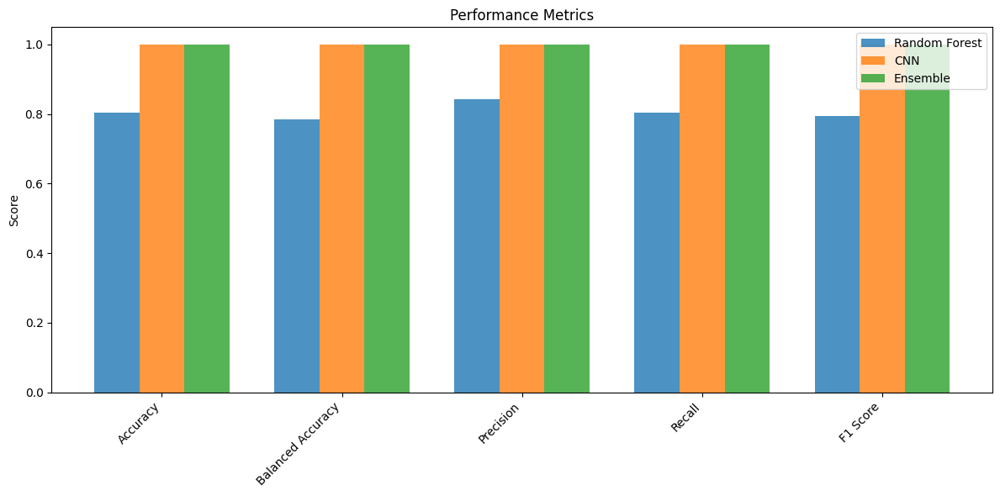

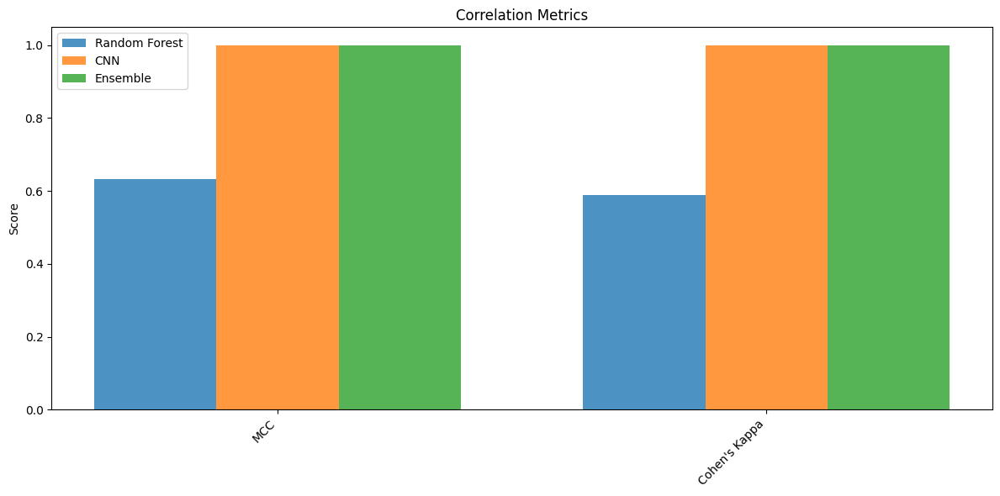

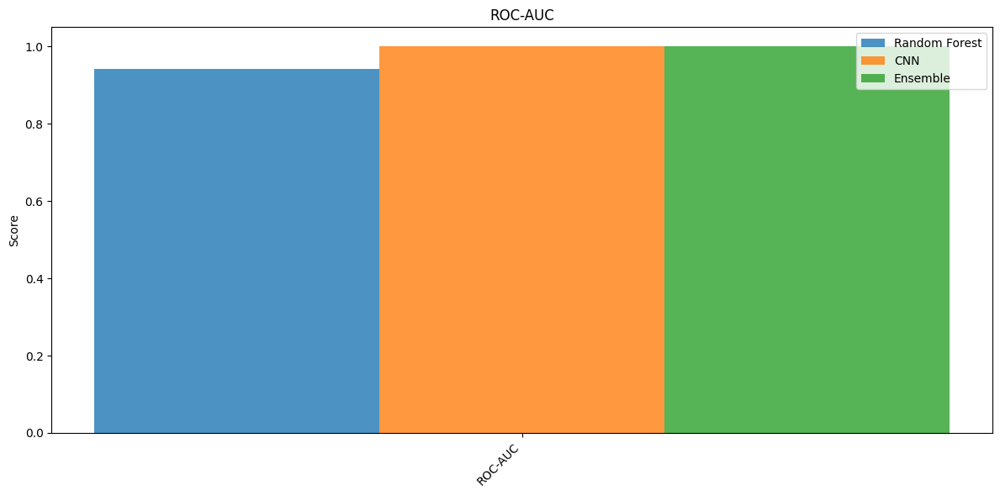

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Prepare data for plotting
metrics1 = ['Accuracy', 'Balanced Accuracy', 'Precision', 'Recall', 'F1 Score']
metrics2 = ['MCC', "Cohen's Kappa"]
metrics3 = ['ROC-AUC']

rf_scores1 = [accuracy_rf, balanced_accuracy_rf, precision_rf, recall_rf, f1_rf]
cnn_scores1 = [accuracy_cnn, balanced_accuracy_cnn, precision_cnn, recall_cnn, f1_cnn]
ensemble_scores1 = [ensemble_accuracy, ensemble_balanced_accuracy, ensemble_precision, ensemble_recall, ensemble_f1]

rf_scores2 = [mcc_rf, kappa_rf]
cnn_scores2 = [mcc_cnn, kappa_cnn]
ensemble_scores2 = [ensemble_mcc, ensemble_kappa]

rf_scores3 = [roc_auc_rf]
cnn_scores3 = [roc_auc_cnn]
ensemble_scores3 = [ensemble_roc_auc]

# Plot Performance Metrics
fig, ax = plt.subplots(figsize=(12, 6))
width = 0.25
x = np.arange(len(metrics1))
ax.bar(x - width, rf_scores1, width, label='Random Forest', alpha=0.8)
ax.bar(x, cnn_scores1, width, label='CNN', alpha=0.8)
ax.bar(x + width, ensemble_scores1, width, label='Ensemble', alpha=0.8)
ax.set_ylabel('Score')
ax.set_title('Performance Metrics')
ax.set_xticks(x)
ax.set_xticklabels(metrics1, rotation=45, ha='right')
ax.legend()
plt.tight_layout()
plt.show()

# Plot Correlation Metrics
fig, ax = plt.subplots(figsize=(12, 6))
width = 0.25
x = np.arange(len(metrics2))
ax.bar(x - width, rf_scores2, width, label='Random Forest', alpha=0.8)
ax.bar(x, cnn_scores2, width, label='CNN', alpha=0.8)
ax.bar(x + width, ensemble_scores2, width, label='Ensemble', alpha=0.8)
ax.set_ylabel('Score')
ax.set_title('Correlation Metrics')
ax.set_xticks(x)
ax.set_xticklabels(metrics2, rotation=45, ha='right')
ax.legend()
plt.tight_layout()
plt.show()

# Plot ROC-AUC
fig, ax = plt.subplots(figsize=(12, 6))
width = 0.25
x = np.arange(len(metrics3))
ax.bar(x - width, rf_scores3, width, label='Random Forest', alpha=0.8)
ax.bar(x, cnn_scores3, width, label='CNN', alpha=0.8)
ax.bar(x + width, ensemble_scores3, width, label='Ensemble', alpha=0.8)
ax.set_ylabel('Score')
ax.set_title('ROC-AUC')
ax.set_xticks(x)
ax.set_xticklabels(metrics3, rotation=45, ha='right')
ax.legend()
plt.tight_layout()
plt.show()
